# Ablation Experiments — Zero-Shot Nutrient and Quantity Association

**Thesis:** Zero-Shot Nutrient and Quantity Association using OCR-Guided Semantic Graph Matching
**Author:** Moustafa Hamada · THD + USB

## Goal

Two-phase ablation to identify the strongest pipeline configuration.

**Phase 1 — OCR engine ablation** (`EXP-01`, `EXP-02`).
Fix every downstream component (rule-based classifier, Graph V2 association). Only swap the OCR engine. Each engine ships with its own corrector — EasyOCR uses `OCRCorrector`, PaddleOCR uses `paddleOCR_corrector_v2.correct_tokens`. Treating the corrector as part of the OCR stage is defensible because we are comparing OCR *systems*, not raw engines.

**Phase 2 — Classifier × Association ablation** (`EXP-03` … `EXP-11`).
Lock the OCR engine to the Phase 1 winner. Run a 3 × 3 factorial:

|                  | Graph v1 (naive) | Graph v2 | VLM |
|------------------|------------------|----------|-----|
| **Classifier A — rule-based**      | EXP-03 | EXP-04 | EXP-05 |
| **Classifier B — embedding (BGE-M3)** | EXP-06 | EXP-07 | EXP-08 |
| **Classifier C — GLiNER**           | EXP-09 | EXP-10 | EXP-11 |

## Evaluation

Each experiment produces:

1. **Quantitative metrics** vs ground truth — per-image and dataset-level precision, recall, 4-field F1.
2. **Fast-rule decisions** from `LLMTupleEvaluator` (`use_llm=False`).
3. **Descriptive per-image evaluation** — rule-based explanations of TP / FP / FN with a likely-failure-source attribution.
4. **Dataset-level descriptive report** — academic-style summary of performance characteristics.
5. **Failure analysis tables** — best/worst by F1, precision-recall imbalance, evaluator-vs-metric disagreement.
6. **Histograms and bar charts**, saved as PNG and rendered inline.

## Output structure

```
results/ablation/
    EXP-01_easyocr/
        config_snapshot.json
        predicted_tuples.csv
        quantitative_metrics.json
        per_image_metrics.csv
        tuple_matches.csv
        fast_rule_decisions.csv
        fast_rule_summary.json
        per_image_descriptions.csv
        per_image_descriptive_report.md
        dataset_descriptive_report.md
        errors.csv
        intermediate/
        failure_analysis/
        plots/
    EXP-02_paddleocr/
    EXP-03_A_G1/
    ...
    summary/
        phase1_summary.csv
        phase1_winner.json
        phase2_summary.csv
        all_experiments_summary.csv
        final_descriptive_comparison.md
        plots/
```

In [22]:
"""Setup: imports, paths, logging, display settings."""

import os
import sys
import json
import csv
import math
import time
import logging
import warnings
import traceback
import importlib.util
from pathlib import Path
from collections import Counter, defaultdict
from dataclasses import dataclass, field, asdict
from typing import Optional, List, Dict, Any, Tuple, Callable

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont, ImageOps
from IPython.display import display, Markdown, Image as IPImage

# Project root — walk up from CWD looking for the data/ + src/ markers,
# so the notebook works whether it lives at the repo root or under experiments/.
def _find_project_root(start: Path, marker_dirs=("data", "src"), max_up: int = 8) -> Path:
    cur = start.resolve()
    for _ in range(max_up):
        if all((cur / m).is_dir() for m in marker_dirs):
            return cur
        if cur.parent == cur:
            break
        cur = cur.parent
    return start.resolve()

PROJECT_ROOT = _find_project_root(Path.cwd())
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

# Logging
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(name)s :: %(message)s",
    datefmt="%H:%M:%S",
)
logger = logging.getLogger("ablation")

# Reduce noise from third-party libs
for noisy in ["PIL", "matplotlib", "urllib3", "sentence_transformers", "transformers"]:
    logging.getLogger(noisy).setLevel(logging.WARNING)

# Reproducibility
np.random.seed(42)

# Pandas display
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", 80)
pd.set_option("display.width", 180)

# Matplotlib inline + style
%matplotlib inline
plt.rcParams.update({
    "figure.figsize": (8, 4),
    "figure.dpi": 100,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

warnings.filterwarnings("ignore", category=UserWarning)

logger.info("Setup complete. Project root: %s", PROJECT_ROOT)

04:52:07 [INFO] ablation :: Setup complete. Project root: C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association


In [23]:
"""Single configuration object. Edit here to change the experiment."""

ablation_config = {
    # ── Data ────────────────────────────────────────────────────────────
    "data": {
        "raw_dir":          "data/raw",
        "annotations_dir":  "data/annotations",
        "ground_truth_csv": "data/annotations/test_set_normalized.csv",
        "image_extensions": {".jpg", ".jpeg", ".png", ".bmp", ".tiff", ".tif", ".webp"},
    },

    # ── Output ──────────────────────────────────────────────────────────
    "output_dir": "results/ablation",

    # ── Debug ───────────────────────────────────────────────────────────
    "debug": {
        "limit_images":      None,    # int or None — first N images for fast debug
        "strict_mode":       False,   # if True, exception in one image stops everything
        "skip_if_exists":    False,   # if True, skip experiment when output dir exists
        "display_n_images":  4,       # how many images to display per experiment cell
    },

    # ── Phase 1 — OCR ablation ──────────────────────────────────────────
    "phase1": {
        "ocr_engines": {
            "EXP-01": "easyocr",
            "EXP-02": "paddleocr",
        },
        "fixed_classifier":  "rule_based",   # Classifier A
        "fixed_association": "graph_v2",     # G2 = current best
        "primary_metric":    "full_tuple_f1",
    },

    # ── Phase 2 — Classifier × Association ablation ─────────────────────
    "phase2": {
        # Resolved after Phase 1 completes
        "ocr_engine": "auto_from_phase1",

        "classifiers": {
            "A": "rule_based",   # SemanticClassifier
            "B": "embedding",    # EmbeddingSemanticClassifier (BGE-M3)
            "C": "gliner",       # GLiNERClassifier
        },

        "associations": {
            "G1":  "graph_v1",
            "G2":  "graph_v2",
            "VLM": "vlm",
        },
    },

    # ── Classifier params ───────────────────────────────────────────────
    "classifiers": {
        "rule_based": {"confidence_threshold": 0.30},
        "embedding":  {"mode": "embedding_only","device": "cpu"},
        "gliner":     {},   # accept its own defaults
    },

    # ── VLM ─────────────────────────────────────────────────────────────
    "vlm": {
        "backend":            "openai_compat",
        "openai_base_url":    "http://127.0.0.1:1234/v1/chat/completions",
        "openai_model":       "google/gemma-3-4b",
        "temperature":        0.1,
        "max_tokens":         4096,
        "image_max_side":     896,
        "retry_max":          0,
    },
    "RUN_VLM_EXPERIMENTS": True,   # flip to True to actually call the VLM

    # ── Evaluation ──────────────────────────────────────────────────────
    "evaluation": {
        "use_llm_in_evaluator":   False,  # fast-rule mode
        "llm_evaluator_model":    "qwen2.5:7b",
        "thresholds": {
            "low_f1":   0.30,
            "high_f1":  0.70,
            "low_prec": 0.40,
            "high_prec": 0.80,
            "low_rec":  0.40,
            "high_rec": 0.80,
        },
    },

    # ── Plot settings ───────────────────────────────────────────────────
    "plots": {
        "figsize":       (8, 4),
        "save_format":   "png",
        "bar_label_fmt": "{:.0f}",
    },
}

# Convenience handles — every path anchored to PROJECT_ROOT, not kernel CWD.
RAW_DIR         = PROJECT_ROOT / ablation_config["data"]["raw_dir"]
ANNOTATIONS_DIR = PROJECT_ROOT / ablation_config["data"]["annotations_dir"]
GT_CSV_PATH     = PROJECT_ROOT / ablation_config["data"]["ground_truth_csv"]
OUTPUT_DIR      = PROJECT_ROOT / ablation_config["output_dir"]
SUMMARY_DIR     = OUTPUT_DIR / "summary"
SUMMARY_DIR.mkdir(parents=True, exist_ok=True)
(SUMMARY_DIR / "plots").mkdir(parents=True, exist_ok=True)

logger.info("RAW_DIR:         %s  (exists=%s)", RAW_DIR,         RAW_DIR.exists())
logger.info("ANNOTATIONS_DIR: %s  (exists=%s)", ANNOTATIONS_DIR, ANNOTATIONS_DIR.exists())
logger.info("GT_CSV_PATH:     %s  (exists=%s)", GT_CSV_PATH,     GT_CSV_PATH.exists())
logger.info("OUTPUT_DIR:      %s", OUTPUT_DIR)
logger.info("VLM experiments enabled: %s", ablation_config["RUN_VLM_EXPERIMENTS"])

04:52:13 [INFO] ablation :: RAW_DIR:         C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\data\raw  (exists=True)
04:52:13 [INFO] ablation :: ANNOTATIONS_DIR: C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\data\annotations  (exists=True)
04:52:13 [INFO] ablation :: GT_CSV_PATH:     C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\data\annotations\test_set_normalized.csv  (exists=True)
04:52:13 [INFO] ablation :: OUTPUT_DIR:      C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\results\ablation
04:52:13 [INFO] ablation :: VLM experiments enabled: True


In [24]:
"""Dynamic module loading — matches the style used in run_graph_v2_experiment.py.
Some modules live under src/ and are imported as src.X.Y. Where the path differs
between local file and installed location, we fall back to direct file load."""

def _load_module_from_file(name: str, filepath: Path):
    """Load a Python module from an arbitrary file path."""
    filepath = Path(filepath)
    if not filepath.exists():
        raise FileNotFoundError(f"Module file not found: {filepath}")
    spec   = importlib.util.spec_from_file_location(name, str(filepath))
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module


def _import_or_load(import_path: str, fallback_file: Optional[Path] = None):
    """Try a normal import first; fall back to file load if missing."""
    try:
        parts = import_path.split(".")
        mod = __import__(import_path, fromlist=[parts[-1]])
        return mod
    except Exception as e:
        if fallback_file and Path(fallback_file).exists():
            logger.info("Falling back to file load for %s -> %s", import_path, fallback_file)
            return _load_module_from_file(import_path.replace(".", "_"), fallback_file)
        raise

In [25]:
"""Image discovery and ground-truth loading.

Ground truth is read from a single normalized CSV (test_set_normalized.csv),
not the per-image JSON files. The legacy function name `load_gt_from_json`
is preserved as a shim so the rest of the notebook (Cell 14, Cell 15) needs
no changes — it now silently reads CSV.
"""

def list_images(raw_dir: Path, limit: Optional[int] = None) -> List[Path]:
    """Return sorted list of image paths in raw_dir, with optional limit."""
    exts = ablation_config["data"]["image_extensions"]
    files = [f for f in Path(raw_dir).iterdir() if f.suffix.lower() in exts]
    files.sort(key=lambda f: (int(f.stem) if f.stem.isdigit() else float("inf"), f.name))
    if limit:
        files = files[:limit]
    return files


def load_gt_from_csv(csv_path: Path) -> List[Dict[str, str]]:
    """Load GT tuples from test_set_normalized.csv.

    The CSV has 7 columns: image_id, nutrient, quantity, unit, context,
    nrv_percent, serving_size. We drop nrv_percent (the evaluator is
    4-field) and fold serving_size into context — identical contract to
    the original JSON loader so per-image matching behaves the same way.
    """
    csv_path = Path(csv_path)
    if not csv_path.exists():
        raise FileNotFoundError(f"GT CSV not found: {csv_path}")

    df = pd.read_csv(csv_path, dtype=str, keep_default_na=False)
    rows: List[Dict[str, str]] = []
    for _, r in df.iterrows():
        raw_id = str(r.get("image_id", "") or "").strip()
        if not raw_id:
            continue
        # Normalize image_id: stem + lower-case suffix
        image_id = Path(raw_id).stem + Path(raw_id).suffix.lower()

        context      = str(r.get("context",      "") or "").strip()
        serving_size = str(r.get("serving_size", "") or "").strip()
        context_full = f"{context} ({serving_size})" if serving_size else context

        rows.append({
            "image_id": image_id,
            "nutrient": str(r.get("nutrient", "") or "").strip(),
            "quantity": str(r.get("quantity", "") or "").strip(),
            "unit":     str(r.get("unit",     "") or "").strip(),
            "context":  context_full,
        })
    return rows


def load_gt_from_json(_ignored_path: Any = None) -> List[Dict[str, str]]:
    """Backward-compat shim. Despite the name, reads from GT_CSV_PATH.
    The argument is kept and ignored so existing call sites work unchanged."""
    return load_gt_from_csv(GT_CSV_PATH)


def gt_for_image(gt_rows: List[Dict], image_id: str) -> List[Dict]:
    target = Path(image_id).stem + Path(image_id).suffix.lower()
    return [r for r in gt_rows if r["image_id"] == target]

In [26]:
"""OCR / corrector / classifier / associator builders. Returns callables with
unified signatures so the pipeline runner is engine-agnostic."""

# ── OCR engines ─────────────────────────────────────────────────────────

def build_ocr_engine(name: str) -> Callable[[str], List[Dict]]:
    """Return a callable: image_path (str) -> List[Dict] OCR tokens."""
    if name == "easyocr":
        from src.ocr.ocr_runner import run_ocr_on_image as easy_run
        def _run(path: str) -> List[Dict]:
            return easy_run(path, languages=["en", "de"])
        return _run
    elif name == "paddleocr":
        from src.ocr.paddleocr_runner import run_ocr_on_image as paddle_run
        return paddle_run
    raise ValueError(f"Unknown OCR engine: {name}")


def _ensure_cx_cy(tokens: List[Dict]) -> List[Dict]:
    """Inject cx, cy on tokens that don't have them (EasyOCR output).
    Mutates and returns the same list."""
    for t in tokens:
        if "cx" not in t or "cy" not in t:
            t["cx"] = float((t["x1"] + t["x2"]) / 2.0)
            t["cy"] = float((t["y1"] + t["y2"]) / 2.0)
    return tokens


# ── Correctors (OCR-tied) ───────────────────────────────────────────────

def build_corrector(ocr_engine: str) -> Callable[[List[Dict]], Tuple[List[Dict], List]]:
    """Return a callable: tokens -> (corrected_tokens, log)."""
    if ocr_engine == "easyocr":
        from src.utils.ocr_corrector import OCRCorrector

        # Reuse C15 from PaddleOCR corrector — single source of truth.
        # Falls back to direct file load if the src.utils import path isn't available.
        try:
            from src.utils.paddleOCR_corrector_v2 import apply_c15_normalise_names
        except ImportError:
            _v2_mod = _load_module_from_file(
                "paddleOCR_corrector_v2",
                PROJECT_ROOT / "src" / "utils" / "paddleOCR_corrector_v2.py",
            )
            apply_c15_normalise_names = _v2_mod.apply_c15_normalise_names

        _corr = OCRCorrector()

        def _run(tokens):
            # Stage 2 — character-level corrections + lexicon snap
            corrected = _corr.correct_all(tokens)
            # Stage 2.5 — C15 nutrient-name normalisation (shared with PaddleOCR).
            # Coverage on EasyOCR is single-token only: no C14/C14b compound
            # merging upstream, so multi-word entries fire only when EasyOCR
            # detected them as one token.
            corrected = apply_c15_normalise_names(corrected)
            return corrected, []

        return _run

    elif ocr_engine == "paddleocr":
        try:
            from src.utils.paddleOCR_corrector_v2 import correct_tokens as _correct
        except ImportError:
            _mod = _load_module_from_file(
                "paddleOCR_corrector_v2",
                PROJECT_ROOT / "src" / "utils" / "paddleOCR_corrector_v2.py",
            )
            _correct = _mod.correct_tokens

        def _run(tokens):
            try:
                res = _correct(tokens, return_log=True)
            except TypeError:
                res = _correct(tokens)
            if isinstance(res, tuple) and len(res) >= 2:
                return res[0], res[1]
            return res, []
        return _run

    raise ValueError(f"No corrector for OCR engine: {ocr_engine}")


# ── Classifiers ─────────────────────────────────────────────────────────

class _UnifiedClassifier:
    """Wrapper that gives every classifier a `.classify_all(tokens)` method."""
    def __init__(self, name: str, instance: Any, method_name: str):
        self.name        = name
        self.instance    = instance
        self.method_name = method_name

    def classify_all(self, tokens: List[Dict]) -> List[Dict]:
        method = getattr(self.instance, self.method_name)
        return method(tokens)


def build_classifier(name: str) -> _UnifiedClassifier:
    """Build a classifier with a unified interface."""
    params = ablation_config["classifiers"].get(name, {})

    if name == "rule_based":
        clf_mod = _load_module_from_file(
            "exp01_classifier",
            PROJECT_ROOT / "src" / "classification" / "experiment_01_final_semantic_classifier.py",
        )
        inst = clf_mod.SemanticClassifier(confidence_threshold=params.get("confidence_threshold", 0.30))
        return _UnifiedClassifier("rule_based", inst, "classify_all")

    elif name == "embedding":
        clf_mod = _load_module_from_file(
            "emb_classifier",
            PROJECT_ROOT / "src" / "classification" / "embedding_semantic_classifier.py",
        )
        inst = clf_mod.EmbeddingSemanticClassifier(**params)
        return _UnifiedClassifier("embedding", inst, "classify_all")

    elif name == "gliner":
        clf_mod = _load_module_from_file(
            "gliner_classifier",
            PROJECT_ROOT / "src" / "classification" / "gliner_classifier.py",
        )
        inst = clf_mod.GLiNERClassifier(**params)
        # GLiNER exposes `.classify`, not `.classify_all` — unify here.
        return _UnifiedClassifier("gliner", inst, "classify")

    raise ValueError(f"Unknown classifier: {name}")


# ── Token enricher (V2 / VLM only) ──────────────────────────────────────

def build_enricher():
    from src.utils.token_enricher import TokenEnricher
    return TokenEnricher()


# ── Associators ─────────────────────────────────────────────────────────

def run_association(method: str,
                    labeled_tokens: List[Dict],
                    image_path: Path,
                    image_id:   str,
                    vlm_cfg:    Optional[Dict] = None) -> Tuple[List[Dict], Dict]:
    """Dispatch on association method. Returns (tuples, diagnostics)."""
    diagnostics: Dict[str, Any] = {}

    if method == "graph_v1":
        # V1 takes labeled tokens directly (no enrichment).
        gc_mod = _load_module_from_file(
            "graph_constructor",
            PROJECT_ROOT / "src" / "graph" / "graph_constructor.py",
        )
        ta_mod = _load_module_from_file(
            "exp01_association",
            PROJECT_ROOT / "src" / "matching" / "experiment_01_final_association.py",
        )
        constructor = gc_mod.GraphConstructor()
        associator  = ta_mod.TupleAssociator()
        graph = constructor.build(labeled_tokens)
        tuples = associator.extract(graph, image_id=image_id)
        diagnostics["edges"]  = len(graph.get("edges", []))
        diagnostics["nodes"]  = len(graph.get("nodes", []))
        return tuples, diagnostics

    elif method == "graph_v2":
        from src.utils.token_enricher        import TokenEnricher
        from src.graph.graph_constructor_v2  import GraphConstructorV2
        from src.matching.association_v2     import TupleAssociatorV2
        from src.utils.paragraph_extractor   import extract_from_paragraph, should_use_paragraph_mode

        enricher    = TokenEnricher()
        constructor = GraphConstructorV2()
        associator  = TupleAssociatorV2()

        enriched = enricher.enrich(labeled_tokens)
        graph    = constructor.build(enriched)
        tuples   = associator.extract(graph, image_id=image_id)

        # Paragraph-mode fallback (matches run_graph_v2_experiment.py behaviour)
        if should_use_paragraph_mode(labeled_tokens, len(tuples)):
            para_tuples = extract_from_paragraph(labeled_tokens, image_id)
            if len(para_tuples) > len(tuples):
                tuples = para_tuples
                diagnostics["paragraph_fallback"] = True

        diagnostics.update({
            "enricher": getattr(enricher, "diagnostics", {}),
            "associator": getattr(associator, "diagnostics", {}),
            "edges": len(graph.get("edges", [])),
            "nodes": len(graph.get("nodes", [])),
        })
        return tuples, diagnostics

    elif method == "vlm":
        from src.utils.token_enricher    import TokenEnricher
        from src.matching.vlm_association import VLMAssociator

        enriched   = TokenEnricher().enrich(labeled_tokens)
        cfg        = dict(ablation_config["vlm"])
        if vlm_cfg:
            cfg.update(vlm_cfg)
        associator = VLMAssociator(cfg)
        tuples = associator.extract(
            enriched_tokens=enriched,
            image_path=str(image_path),
            image_id=image_id,
        )
        diagnostics["vlm"] = getattr(associator, "diagnostics", {})
        return tuples, diagnostics

    raise ValueError(f"Unknown association method: {method}")

In [27]:
"""Per-image pipeline runner. Returns all intermediate artifacts so the notebook
can introspect each stage."""

@dataclass
class ImagePipelineResult:
    image_id:      str
    image_path:    str
    ocr_tokens:    List[Dict]    = field(default_factory=list)
    corrected:     List[Dict]    = field(default_factory=list)
    labeled:       List[Dict]    = field(default_factory=list)
    tuples:        List[Dict]    = field(default_factory=list)
    diagnostics:   Dict[str, Any] = field(default_factory=dict)
    error:         Optional[str] = None
    duration_s:    float         = 0.0


def run_pipeline_on_image(
    image_path:    Path,
    *,
    ocr_fn:        Callable,
    corrector_fn:  Callable,
    classifier:    _UnifiedClassifier,
    association:   str,
    vlm_cfg:       Optional[Dict] = None,
) -> ImagePipelineResult:
    """Run the full pipeline on a single image. Catches exceptions per image."""
    image_id = image_path.stem + image_path.suffix.lower()
    result   = ImagePipelineResult(image_id=image_id, image_path=str(image_path))
    t0 = time.time()

    try:
        # Stage 1 — OCR
        tokens = ocr_fn(str(image_path))
        tokens = _ensure_cx_cy(tokens)
        result.ocr_tokens = tokens

        # Stage 2 — corrector
        corrected, _log = corrector_fn(tokens)
        corrected = _ensure_cx_cy(corrected)
        result.corrected = corrected

        # Stage 3 — classifier
        labeled = classifier.classify_all(corrected)
        result.labeled = labeled

        # Stage 4/5 — association (handles enrichment, graph build, association)
        tuples, diag = run_association(
            method=association,
            labeled_tokens=labeled,
            image_path=image_path,
            image_id=image_id,
            vlm_cfg=vlm_cfg,
        )
        # Attach image_id to every tuple
        for t in tuples:
            t["image_id"] = image_id
        result.tuples      = tuples
        result.diagnostics = diag

    except Exception as e:
        result.error = f"{type(e).__name__}: {e}"
        logger.error("Pipeline failed on %s: %s", image_id, result.error)
        if ablation_config["debug"]["strict_mode"]:
            raise

    result.duration_s = round(time.time() - t0, 3)
    return result

In [28]:
"""Token normalization utilities. Used ONLY for display formatting and the
failure-source heuristic in Cell 11. The notebook does NOT match predictions
against ground truth on its own — all matching and metrics come from the
project's LLMTupleEvaluator output files (see Cell 9).
"""

_UNIT_CANON = {
    "ug": "µg", "mcg": "µg", "μg": "µg",
    "MG": "mg", "Mg": "mg",
    "kj/kcal": "kj", "kj kcal": "kj",
}

_CONTEXT_CANON_RX = [
    (r"\bper[\s_]100\s*g\b",   "per_100g"),
    (r"\bper[\s_]100\s*ml\b",  "per_100ml"),
    (r"\bper\s*serving\b",     "per_serving"),
    (r"\bper\s*daily\s*dose\b","per_daily_dose"),
    (r"\bje\s*tagesdosis\b",   "per_daily_dose"),
    (r"\bpro\s*tagesdosis\b",  "per_daily_dose"),
    (r"\bpro\s*portion\b",     "per_serving"),
]

import re as _re

def _fold_german(s: str) -> str:
    return (s.replace("ß", "ss")
             .replace("ä", "a").replace("ö", "o").replace("ü", "u")
             .replace("Ä", "A").replace("Ö", "O").replace("Ü", "U"))

def normalize_string(s: Any) -> str:
    s = str(s or "").strip().lower()
    s = _fold_german(s)
    s = _re.sub(r"\s+", " ", s)
    return s

def normalize_image_id(s: str) -> str:
    s = str(s or "").strip()
    p = Path(s).name
    return Path(p).stem + Path(p).suffix.lower()

def normalize_nutrient(s: Any) -> str:
    out = normalize_string(s)
    out = _re.sub(r"[()\[\]]", " ", out)
    out = _re.sub(r"\s+", " ", out).strip()
    return out

def normalize_quantity(s: Any) -> str:
    s = str(s or "").strip()
    if not s:
        return ""
    s = s.replace(",", ".")
    s = _re.sub(r"[^\d\.<>+\-]", "", s)
    if s in ("", ".", "-", "+"):
        return ""
    try:
        f = float(_re.sub(r"[^\d\.]", "", s))
        return f"{f:g}"
    except Exception:
        return s

def normalize_unit(s: Any) -> str:
    s = normalize_string(s)
    s = s.replace(" ", "")
    return _UNIT_CANON.get(s, s)

def normalize_context(s: Any) -> str:
    s = normalize_string(s)
    s = s.replace("-", " ")
    s = _re.sub(r"\s*\([^)]*\)\s*", " ", s).strip()
    s_match = s.replace("_", " ")
    for rx, repl in _CONTEXT_CANON_RX:
        if _re.search(rx, s_match):
            return repl
    return s_match.replace(" ", "_")

In [29]:
"""Loaders for the project's LLMTupleEvaluator output files. These are the
sole source of truth for all per-image and dataset-level metrics. The
notebook does not match predictions to GT independently — it reads what the
evaluator already computed in:
    <out_dir>/evaluation_results.json   — overall metrics
    <out_dir>/per_image_results.csv     — per-image breakdown
    <out_dir>/pair_details.csv          — per-tuple TP / FP / FN rows

Column names in the evaluator CSVs may vary slightly; loaders below try
multiple aliases before giving up.
"""

def _first_col(df: pd.DataFrame, candidates: List[str]) -> Optional[str]:
    """Return the first column name in `candidates` that exists in `df`
    (case-insensitive match). Returns None if none match."""
    lower = {c.lower(): c for c in df.columns}
    for c in candidates:
        if c.lower() in lower:
            return lower[c.lower()]
    return None


def _to_unit_interval(series: pd.Series) -> pd.Series:
    """Some evaluator CSV columns store percentages (0–100), some store
    fractions (0–1). Normalise to 0–1."""
    s = pd.to_numeric(series, errors="coerce").fillna(0.0)
    if s.max() > 1.5:
        s = s / 100.0
    return s


def load_per_image_metrics(out_dir: Path) -> pd.DataFrame:
    """Load `<out_dir>/per_image_results.csv` and project to a canonical
    schema:
        image_id, n_ground_truth, n_predicted, nutrient_matches,
        qty_acc_pct, unit_acc_pct, ctx_acc_pct,
        f1_3field_pct, f1_4field_pct,
        tp, fp, fn, precision, recall, f1
    All 4-field counts (`tp`, `fp`, `fn`) and the headline `f1` are at the
    4-field level — *not* nutrient level. The evaluator's contract is:
        full4f_pct = (number of full-4F-correct pairs) / (nutrient_matches) × 100
    so 4F TP per image = round(full4f_pct/100 × nutrient_matches).
    """
    canon_cols = [
        "image_id", "n_ground_truth", "n_predicted", "nutrient_matches",
        "qty_acc_pct", "unit_acc_pct", "ctx_acc_pct",
        "f1_3field_pct", "f1_4field_pct",
        "tp", "fp", "fn",
        "precision", "recall", "f1",
    ]
    p = Path(out_dir) / "per_image_results.csv"
    if not p.exists():
        logger.warning("per_image_results.csv missing in %s — empty frame.", out_dir)
        return pd.DataFrame(columns=canon_cols)

    df = pd.read_csv(p)

    img_col   = _first_col(df, ["image_id", "image", "filename"])
    gt_col    = _first_col(df, ["gt",         "n_ground_truth", "gt_count", "gt_tuples"])
    pred_col  = _first_col(df, ["pred",       "n_predicted",    "pred_count", "predicted_tuples"])
    match_col = _first_col(df, ["match",      "matched_pairs",  "matches",    "matched"])
    qty_col   = _first_col(df, ["qty_pct",    "quantity_acc",   "qty_acc"])
    unit_col  = _first_col(df, ["unit_pct",   "unit_acc"])
    ctx_col   = _first_col(df, ["ctx_pct",    "context_acc"])
    f3_col    = _first_col(df, ["full3f_pct", "f1_3field",      "3f_f1", "threefield_f1"])
    f4_col    = _first_col(df, ["full4f_pct", "f1_4field",      "4f_f1", "fourfield_f1",
                                "full_tuple_f1", "f1"])

    out = pd.DataFrame()
    out["image_id"]         = df[img_col].astype(str) if img_col else [str(i) for i in range(len(df))]
    out["n_ground_truth"]   = pd.to_numeric(df[gt_col],    errors="coerce").fillna(0).astype(int) if gt_col    else 0
    out["n_predicted"]      = pd.to_numeric(df[pred_col],  errors="coerce").fillna(0).astype(int) if pred_col  else 0
    out["nutrient_matches"] = pd.to_numeric(df[match_col], errors="coerce").fillna(0).astype(int) if match_col else 0
    out["qty_acc_pct"]      = pd.to_numeric(df[qty_col],   errors="coerce").fillna(0.0)          if qty_col   else 0.0
    out["unit_acc_pct"]     = pd.to_numeric(df[unit_col],  errors="coerce").fillna(0.0)          if unit_col  else 0.0
    out["ctx_acc_pct"]      = pd.to_numeric(df[ctx_col],   errors="coerce").fillna(0.0)          if ctx_col   else 0.0
    out["f1_3field_pct"]    = pd.to_numeric(df[f3_col],    errors="coerce").fillna(0.0)          if f3_col    else 0.0
    out["f1_4field_pct"]    = pd.to_numeric(df[f4_col],    errors="coerce").fillna(0.0)          if f4_col    else 0.0

    # 4-field TP per image: full4f_pct is conditional on a nutrient match.
    # If the evaluator's column is stored as fraction (≤1.5) instead of percent,
    # scale up so the formula behaves identically.
    f4_for_tp = out["f1_4field_pct"].copy()
    if f4_for_tp.max() <= 1.5:
        f4_for_tp = f4_for_tp * 100.0
        out["f1_4field_pct"] = f4_for_tp  # keep canonical unit (0–100)

    out["tp"] = (f4_for_tp / 100.0 * out["nutrient_matches"]).round().astype(int)
    out["fp"] = (out["n_predicted"]    - out["tp"]).clip(lower=0).astype(int)
    out["fn"] = (out["n_ground_truth"] - out["tp"]).clip(lower=0).astype(int)

    # Per-image 4F precision/recall from derived counts.
    with np.errstate(divide="ignore", invalid="ignore"):
        out["precision"] = (out["tp"] / (out["tp"] + out["fp"])).fillna(0.0)
        out["recall"]    = (out["tp"] / (out["tp"] + out["fn"])).fillna(0.0)
    # `f1` follows the evaluator's per-image 4F percent (converted to 0–1)
    # so the headline number matches what the evaluator prints to console.
    out["f1"] = (out["f1_4field_pct"] / 100.0).round(4)

    for col in ("precision", "recall"):
        out[col] = out[col].round(4)

    return out[canon_cols]


def load_pair_details(out_dir: Path) -> pd.DataFrame:
    """Load `<out_dir>/pair_details.csv` and project to a canonical schema:
        image_id, match_status (TP|FP|FN),
        predicted_nutrient, predicted_quantity, predicted_unit, predicted_context,
        gt_nutrient,        gt_quantity,        gt_unit,        gt_context

    Falls back to inferring `match_status` from presence of predicted vs gt
    fields if the evaluator did not provide it.
    """
    canon_cols = [
        "image_id", "match_status",
        "predicted_nutrient", "predicted_quantity", "predicted_unit", "predicted_context",
        "gt_nutrient",        "gt_quantity",        "gt_unit",        "gt_context",
    ]
    p = Path(out_dir) / "pair_details.csv"
    if not p.exists():
        return pd.DataFrame(columns=canon_cols)

    try:
        df = pd.read_csv(p, dtype=str, keep_default_na=False)
    except Exception as e:
        logger.warning("Could not read pair_details.csv: %s", e)
        return pd.DataFrame(columns=canon_cols)

    aliases = {
        "image_id":           ["image_id", "image", "filename"],
        "match_status":       ["match_status", "status", "outcome", "result"],
        "predicted_nutrient": ["predicted_nutrient", "pred_nutrient", "pred_nut", "p_nutrient"],
        "predicted_quantity": ["predicted_quantity", "pred_quantity", "pred_qty", "p_quantity"],
        "predicted_unit":     ["predicted_unit",     "pred_unit",     "p_unit"],
        "predicted_context":  ["predicted_context",  "pred_context",  "p_context"],
        "gt_nutrient":        ["gt_nutrient", "true_nutrient", "gold_nutrient"],
        "gt_quantity":        ["gt_quantity", "true_quantity", "gold_quantity"],
        "gt_unit":            ["gt_unit",     "true_unit",     "gold_unit"],
        "gt_context":         ["gt_context",  "true_context",  "gold_context"],
    }

    out = pd.DataFrame()
    for canon, alts in aliases.items():
        col = _first_col(df, alts)
        out[canon] = df[col].astype(str) if col else ""

    # Infer match_status if missing.
    if out["match_status"].str.strip().eq("").all():
        has_pred = out["predicted_nutrient"].str.strip().ne("")
        has_gt   = out["gt_nutrient"].str.strip().ne("")
        out["match_status"] = np.where(has_pred & has_gt,  "TP",
                              np.where(has_pred & ~has_gt, "FP",
                              np.where(~has_pred & has_gt, "FN", "")))

    # Canonicalise image_id
    out["image_id"] = out["image_id"].apply(normalize_image_id)
    return out[canon_cols]


def load_dataset_metrics_json(out_dir: Path) -> Dict[str, Any]:
    """Load the evaluator's overall metrics dict from
    `<out_dir>/evaluation_results.json`."""
    p = Path(out_dir) / "evaluation_results.json"
    if not p.exists():
        return {}
    try:
        with open(p, encoding="utf-8") as f:
            return json.load(f)
    except Exception as e:
        logger.warning("Could not read evaluation_results.json: %s", e)
        return {}

In [30]:
"""Wrap LLMTupleEvaluator for fast-rule mode."""

def evaluate_fast_rule(
    preds:     List[Dict],
    gt_rows:   List[Dict],
    out_dir:   Path,
    experiment_name: str,
    use_llm:   bool = False,
) -> Tuple[Dict[str, Any], pd.DataFrame]:
    """Call the project's LLMTupleEvaluator. Returns (summary_dict, decisions_df).
    decisions_df comes from `pair_details.csv` if the evaluator writes one,
    otherwise it's a minimal fallback derived from match status.
    """
    from src.evaluation.llm_evaluator import LLMTupleEvaluator

    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    evaluator = LLMTupleEvaluator(
        gt_rows=gt_rows,
        use_llm=use_llm,
        model=ablation_config["evaluation"]["llm_evaluator_model"],
    )
    metrics = evaluator.run(
        predictions=preds,
        experiment=experiment_name,
        out_dir=out_dir,
        notes="ablation",
        diagnostics={},
    )

    # The evaluator typically writes pair_details.csv (or fast_rule_decisions.csv).
    # If neither file is found, decisions_df is left empty — downstream code
    # tolerates that, since per-image metrics are loaded separately from
    # per_image_results.csv in Cell 14.
    decisions_df = pd.DataFrame()
    for candidate in ["pair_details.csv", "fast_rule_decisions.csv"]:
        p = out_dir / candidate
        if p.exists():
            try:
                decisions_df = pd.read_csv(p)
                break
            except Exception:
                pass

    summary = {
        "n_predictions":  len(preds),
        "n_ground_truth": len(gt_rows),
        "metrics":        metrics,
    }
    with open(out_dir / "fast_rule_summary.json", "w", encoding="utf-8") as f:
        json.dump(summary, f, indent=2, default=str)

    return summary, decisions_df

In [31]:
"""Descriptive evaluation. Sources all TP / FP / FN information from the
evaluator's pair_details.csv (loaded in Cell 14). No independent matching
is performed here."""

def _format_pair_predicted(row: Dict) -> str:
    n = row.get("predicted_nutrient", "")
    q = row.get("predicted_quantity", "")
    u = row.get("predicted_unit", "")
    c = row.get("predicted_context", "")
    return f"{n} {q} {u} [{c}]".strip()

def _format_pair_gt(row: Dict) -> str:
    n = row.get("gt_nutrient", "")
    q = row.get("gt_quantity", "")
    u = row.get("gt_unit", "")
    c = row.get("gt_context", "")
    return f"{n} {q} {u} [{c}]".strip()


def infer_likely_failure_source(
    fn_rows: pd.DataFrame,
    fp_rows: pd.DataFrame,
    labeled_tokens: List[Dict],
    tp_rows: pd.DataFrame,
) -> str:
    """Heuristic: ocr | classifier | association | mixed (...) | none.

    OCR signal     — FN nutrient text not present anywhere in the labelled stream.
    Classifier sig — FN nutrient present in OCR but never labelled NUTRIENT.
    Assoc signal   — FN nutrient appears in a TP row (detected elsewhere on the
                     image) yet this particular GT instance was missed.
    """
    if fn_rows.empty and fp_rows.empty:
        return "none"

    all_norm = {normalize_string(t.get("token", "")) for t in labeled_tokens}
    nutrient_tokens = {normalize_string(t.get("token", ""))
                       for t in labeled_tokens if t.get("label") == "NUTRIENT"}

    n_fns = len(fn_rows)
    missing_in_ocr    = 0
    classifier_missed = 0

    for _, fn in fn_rows.iterrows():
        nut = normalize_string(fn.get("gt_nutrient", ""))
        if not nut:
            continue
        head = nut.split()[0] if nut.split() else nut
        in_ocr      = any(head in tok for tok in all_norm        if tok)
        in_nutrient = any(head in tok for tok in nutrient_tokens if tok)
        if not in_ocr:
            missing_in_ocr += 1
        elif not in_nutrient:
            classifier_missed += 1

    tp_nutrients = {normalize_nutrient(r.get("predicted_nutrient", ""))
                    for _, r in tp_rows.iterrows()}
    association_wrong = sum(
        1 for _, fn in fn_rows.iterrows()
        if normalize_nutrient(fn.get("gt_nutrient", "")) in tp_nutrients
    )

    sources: List[str] = []
    threshold = max(1, n_fns // 3) if n_fns else 1
    if missing_in_ocr    >= threshold: sources.append("ocr")
    if classifier_missed >= threshold: sources.append("classifier")
    if association_wrong >= threshold: sources.append("association")
    if not sources:
        return "mixed"
    if len(sources) == 1:
        return sources[0]
    return "mixed (" + " + ".join(sources) + ")"


def generate_per_image_description(
    image_id:        str,
    pair_details_df: pd.DataFrame,
    per_image_row:   pd.Series,
    labeled:         List[Dict],
    fast_rule:       str = "n/a",
) -> Dict[str, Any]:
    """Build a descriptive summary for one image using pair_details + per-image metrics."""
    img_norm = normalize_image_id(image_id)
    pi_rows = pair_details_df[
        pair_details_df["image_id"].apply(normalize_image_id) == img_norm
    ]
    tp_rows = pi_rows[pi_rows["match_status"] == "TP"]
    fp_rows = pi_rows[pi_rows["match_status"] == "FP"]
    fn_rows = pi_rows[pi_rows["match_status"] == "FN"]

    failure_source = infer_likely_failure_source(fn_rows, fp_rows, labeled, tp_rows)

    obs: List[str] = []
    if not tp_rows.empty:
        items = [_format_pair_predicted(r) for _, r in tp_rows.head(3).iterrows()]
        obs.append(f"Correctly extracted: {'; '.join(items)}"
                   + (f"  (+{len(tp_rows)-3} more)" if len(tp_rows) > 3 else ""))
    if not fn_rows.empty:
        items = [_format_pair_gt(r) for _, r in fn_rows.head(3).iterrows()]
        obs.append(f"Missed: {'; '.join(items)}"
                   + (f"  (+{len(fn_rows)-3} more)" if len(fn_rows) > 3 else ""))
    if not fp_rows.empty:
        items = [_format_pair_predicted(r) for _, r in fp_rows.head(3).iterrows()]
        obs.append(f"Extra predicted: {'; '.join(items)}"
                   + (f"  (+{len(fp_rows)-3} more)" if len(fp_rows) > 3 else ""))

    gt_n = int(per_image_row.get("n_ground_truth", 0)) if per_image_row is not None else 0
    pr_n = int(per_image_row.get("n_predicted",    0)) if per_image_row is not None else 0
    tp_n = int(per_image_row.get("tp", len(tp_rows))) if per_image_row is not None else len(tp_rows)
    fp_n = int(per_image_row.get("fp", len(fp_rows))) if per_image_row is not None else len(fp_rows)
    fn_n = int(per_image_row.get("fn", len(fn_rows))) if per_image_row is not None else len(fn_rows)
    prec = float(per_image_row.get("precision", 0.0)) if per_image_row is not None else 0.0
    rec  = float(per_image_row.get("recall",    0.0)) if per_image_row is not None else 0.0
    f1   = float(per_image_row.get("f1",        0.0)) if per_image_row is not None else 0.0

    summary = (
        f"Image: {image_id}. GT={gt_n}, predicted={pr_n}, "
        f"TP={tp_n}, FP={fp_n}, FN={fn_n}. "
        f"Precision={prec:.2f}, recall={rec:.2f}, F1={f1:.2f}. "
        f"Likely failure source: {failure_source}. "
        f"Fast-rule decision: {fast_rule}.\n  "
        + "\n  ".join(obs)
    )

    return {
        "image_id":              image_id,
        "n_ground_truth":        gt_n,
        "n_predicted":           pr_n,
        "tp":                    tp_n,
        "fp":                    fp_n,
        "fn":                    fn_n,
        "precision":             round(prec, 4),
        "recall":                round(rec,  4),
        "f1":                    round(f1,   4),
        "fast_rule_decision":    fast_rule,
        "likely_failure_source": failure_source,
        "descriptive_summary":   summary,
    }


def generate_dataset_descriptive_report(
    experiment_id: str,
    dataset_metrics: Dict,
    per_image_df: pd.DataFrame,
    descriptions_df: pd.DataFrame,
) -> str:
    """Build the academic-style dataset report. Pure-string output."""
    n_img      = dataset_metrics["n_images"]
    tp, fp, fn = dataset_metrics["tp"], dataset_metrics["fp"], dataset_metrics["fn"]
    p          = dataset_metrics["full_tuple_precision"]
    r          = dataset_metrics["full_tuple_recall"]
    f1_score   = dataset_metrics["full_tuple_f1"]

    if r > p + 0.15:
        bottleneck = "precision (the system over-predicts)"
    elif p > r + 0.15:
        bottleneck = "recall (the system under-predicts)"
    else:
        bottleneck = "precision and recall in roughly balanced proportion"

    std_f1 = dataset_metrics["std_image_f1"]
    if std_f1 > 0.25:
        stability_word = "highly variable"
    elif std_f1 > 0.10:
        stability_word = "moderately stable"
    else:
        stability_word = "stable"

    src_counts = (descriptions_df["likely_failure_source"].value_counts().to_dict()
                  if not descriptions_df.empty else {})
    src_lines  = "\n".join(f"- **{k}**: {v} images" for k, v in src_counts.items()) \
                 or "- (no failure sources tabulated)"

    def _indent(text: str, n: int = 4) -> str:
        pad = " " * n
        return "\n".join(pad + line for line in text.split("\n"))

    if not per_image_df.empty:
        best  = per_image_df.nlargest(5,  "f1")[["image_id", "f1", "tp", "fp", "fn"]]
        worst = per_image_df.nsmallest(5, "f1")[["image_id", "f1", "tp", "fp", "fn"]]
        best_str  = _indent(best.to_string(index=False))
        worst_str = _indent(worst.to_string(index=False))
    else:
        best_str = worst_str = "    (no per-image data)"

    return (
        f"# Dataset-level descriptive report — {experiment_id}\n\n"
        f"## Headline metrics\n\n"
        f"- Images processed: **{n_img}**\n"
        f"- Ground-truth tuples: {dataset_metrics['n_ground_truth']}\n"
        f"- Predicted tuples: {dataset_metrics['n_predicted']}\n"
        f"- True positives: {tp}\n"
        f"- False positives: {fp}\n"
        f"- False negatives: {fn}\n"
        f"- Dataset-level **precision = {p:.4f}**, **recall = {r:.4f}**, "
        f"**F1 = {f1_score:.4f}**\n"
        f"- Mean per-image F1: {dataset_metrics['mean_image_f1']:.4f}\n"
        f"- Median per-image F1: {dataset_metrics['median_image_f1']:.4f}\n"
        f"- Standard deviation of per-image F1: {std_f1:.4f}\n\n"
        f"## Performance characterisation\n\n"
        f"The experiment is limited primarily by {bottleneck}. "
        f"The {std_f1:.2f} standard deviation of per-image F1 indicates "
        f"{stability_word} behaviour across images.\n\n"
        f"## Dominant failure sources\n\n"
        f"{src_lines}\n\n"
        f"## Best-performing images\n\n"
        f"{best_str}\n\n"
        f"## Worst-performing images\n\n"
        f"{worst_str}\n"
    )

In [32]:
"""Plot helpers. Every bar chart carries count labels per your preference."""

def _label_bars(ax, fmt: str = "{:.0f}"):
    for rect in ax.patches:
        h = rect.get_height()
        if not np.isfinite(h):
            continue
        ax.annotate(
            fmt.format(h),
            xy=(rect.get_x() + rect.get_width() / 2, h),
            xytext=(0, 3),
            textcoords="offset points",
            ha="center", va="bottom",
            fontsize=9,
        )


def plot_experiment_histograms(per_image_df: pd.DataFrame, out_dir: Path):
    """Per-experiment histograms. Saves PNGs and returns the saved paths."""
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)
    saved: List[Path] = []

    metric_specs = [
        ("f1",            "Per-image F1",        (0, 1.0)),
        ("precision",     "Per-image precision", (0, 1.0)),
        ("recall",        "Per-image recall",    (0, 1.0)),
        ("n_predicted",   "Predicted tuples per image", None),
        ("n_ground_truth","GT tuples per image",        None),
    ]
    for col, title, xlim in metric_specs:
        if col not in per_image_df.columns:
            continue
        fig, ax = plt.subplots(figsize=ablation_config["plots"]["figsize"])
        ax.hist(per_image_df[col].dropna(), bins=20, edgecolor="black", alpha=0.85)
        ax.set_title(title)
        ax.set_xlabel(col)
        ax.set_ylabel("count")
        if xlim:
            ax.set_xlim(*xlim)
        fig.tight_layout()
        p = out_dir / f"hist_{col}.png"
        fig.savefig(p, dpi=120)
        plt.close(fig)
        saved.append(p)

    # TP / FP / FN bar
    if {"tp", "fp", "fn"}.issubset(per_image_df.columns):
        fig, ax = plt.subplots(figsize=ablation_config["plots"]["figsize"])
        totals = [per_image_df["tp"].sum(), per_image_df["fp"].sum(), per_image_df["fn"].sum()]
        ax.bar(["TP", "FP", "FN"], totals,
               color=["#2E7D32", "#C62828", "#EF6C00"], edgecolor="black")
        ax.set_title("Dataset-level TP / FP / FN")
        _label_bars(ax)
        fig.tight_layout()
        p = out_dir / "bar_tp_fp_fn.png"
        fig.savefig(p, dpi=120)
        plt.close(fig)
        saved.append(p)

    return saved


def plot_phase1_comparison(phase1_summary_df: pd.DataFrame, out_path: Path):
    fig, ax = plt.subplots(figsize=(7, 4))
    x = phase1_summary_df["experiment_id"] + " (" + phase1_summary_df["ocr_engine"] + ")"
    metrics = ["full_tuple_precision", "full_tuple_recall", "full_tuple_f1"]
    width = 0.25
    xs = np.arange(len(x))
    for i, m in enumerate(metrics):
        bars = ax.bar(xs + i*width - width, phase1_summary_df[m], width, label=m)
        for b in bars:
            ax.annotate(f"{b.get_height():.2f}",
                        xy=(b.get_x() + b.get_width()/2, b.get_height()),
                        xytext=(0, 3), textcoords="offset points",
                        ha="center", fontsize=8)
    ax.set_xticks(xs)
    ax.set_xticklabels(x)
    ax.set_ylabel("score")
    ax.set_ylim(0, 1.0)
    ax.set_title("Phase 1 — OCR engine comparison")
    ax.legend(loc="upper right")
    fig.tight_layout()
    fig.savefig(out_path, dpi=120)
    plt.close(fig)


def plot_phase2_heatmaps(phase2_summary_df: pd.DataFrame, out_dir: Path, metrics=("f1","precision","recall")):
    """Heatmap of (classifier × association_method) for each metric."""
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)
    metric_to_col = {
        "f1":        "full_tuple_f1",
        "precision": "full_tuple_precision",
        "recall":    "full_tuple_recall",
    }
    for m in metrics:
        col = metric_to_col[m]
        pivot = phase2_summary_df.pivot(index="classifier_key", columns="association_key", values=col)
        fig, ax = plt.subplots(figsize=(6, 4))
        im = ax.imshow(pivot.values, cmap="viridis", vmin=0, vmax=1)
        ax.set_xticks(range(len(pivot.columns)))
        ax.set_xticklabels(pivot.columns)
        ax.set_yticks(range(len(pivot.index)))
        ax.set_yticklabels(pivot.index)
        for i in range(pivot.shape[0]):
            for j in range(pivot.shape[1]):
                v = pivot.values[i, j]
                if np.isfinite(v):
                    ax.text(j, i, f"{v:.2f}", ha="center", va="center",
                            color="white" if v < 0.5 else "black")
        fig.colorbar(im, ax=ax)
        ax.set_title(f"Phase 2 — {m} heatmap (classifier × association)")
        fig.tight_layout()
        fig.savefig(out_dir / f"phase2_heatmap_{m}.png", dpi=120)
        plt.close(fig)


def plot_all_experiments_bar(all_summary_df: pd.DataFrame, out_path: Path):
    fig, ax = plt.subplots(figsize=(11, 4))
    ax.bar(all_summary_df["experiment_id"], all_summary_df["full_tuple_f1"],
           color="#1565C0", edgecolor="black")
    ax.set_ylabel("Full-tuple F1")
    ax.set_ylim(0, 1.0)
    ax.set_title("All experiments — full-tuple F1")
    for x, v in zip(all_summary_df["experiment_id"], all_summary_df["full_tuple_f1"]):
        ax.text(x, v, f"{v:.2f}", ha="center", va="bottom", fontsize=8)
    plt.xticks(rotation=30, ha="right")
    fig.tight_layout()
    fig.savefig(out_path, dpi=120)
    plt.close(fig)

In [33]:
"""Draw OCR boxes, classified tokens, and tuple associations on images."""

_LABEL_COLOURS = {
    "NUTRIENT": "#1565C0",
    "QUANTITY": "#2E7D32",
    "UNIT":     "#EF6C00",
    "CONTEXT":  "#6A1B9A",
    "NOISE":    "#9E9E9E",
    "UNKNOWN":  "#616161",
    "SINGLETON":"#795548",
}


def draw_tokens_on_image(image_path: Path,
                         tokens:    List[Dict],
                         label_field: Optional[str] = "label",
                         out_path:    Optional[Path] = None) -> Image.Image:
    img = Image.open(image_path).convert("RGB")
    draw = ImageDraw.Draw(img)
    for t in tokens:
        label = (t.get(label_field) or "") if label_field else ""
        color = _LABEL_COLOURS.get(label, "#1565C0") if label_field else "#1565C0"
        try:
            draw.rectangle([t["x1"], t["y1"], t["x2"], t["y2"]], outline=color, width=2)
            txt = (t.get("token") or "")[:18]
            if label:
                txt = f"{txt}  [{label[:3]}]"
            draw.text((t["x1"], max(0, t["y1"] - 10)), txt, fill=color)
        except Exception:
            continue
    if out_path:
        img.save(out_path)
    return img

In [34]:
"""Experiment runner — loops over images, evaluates, saves artifacts."""

@dataclass
class ExperimentSpec:
    experiment_id:    str
    experiment_name:  str
    ocr_engine:       str
    classifier_key:   str        # rule_based | embedding | gliner
    association_key:  str        # graph_v1 | graph_v2 | vlm
    notes:            str = ""

    def out_dir(self) -> Path:
        return Path(ablation_config["output_dir"]) / f"{self.experiment_id}_{self.experiment_name}"


@dataclass
class ExperimentResult:
    spec:               ExperimentSpec
    per_image_df:       pd.DataFrame
    descriptions_df:    pd.DataFrame
    tuple_matches_df:   pd.DataFrame
    fast_rule_summary:  Dict[str, Any]
    fast_rule_df:       pd.DataFrame
    dataset_metrics:    Dict[str, Any]
    predictions:        List[Dict]
    image_results:      Dict[str, ImagePipelineResult] = field(default_factory=dict)
    errors:             List[Dict]                    = field(default_factory=list)


def _save_intermediate(ir: ImagePipelineResult, out_dir: Path):
    out_dir.mkdir(parents=True, exist_ok=True)
    stem = Path(ir.image_id).stem
    payload = {
        "ocr_tokens":  ir.ocr_tokens,
        "corrected":   ir.corrected,
        "labeled":     ir.labeled,
        "tuples":      ir.tuples,
        "diagnostics": ir.diagnostics,
        "duration_s":  ir.duration_s,
        "error":       ir.error,
    }
    with open(out_dir / f"{stem}_pipeline.json", "w", encoding="utf-8") as f:
        json.dump(payload, f, ensure_ascii=False, indent=2, default=str)


def _save_config_snapshot(spec: ExperimentSpec):
    snap = {
        "experiment":  asdict(spec),
        "ablation_config": ablation_config,
        "timestamp":   time.strftime("%Y-%m-%d %H:%M:%S"),
    }
    out = spec.out_dir() / "config_snapshot.json"
    out.parent.mkdir(parents=True, exist_ok=True)
    with open(out, "w", encoding="utf-8") as f:
        json.dump(snap, f, indent=2, default=str)


def _build_failure_analysis(per_image_df: pd.DataFrame,
                            descriptions_df: pd.DataFrame,
                            out_dir: Path):
    fa_dir = Path(out_dir) / "failure_analysis"
    fa_dir.mkdir(parents=True, exist_ok=True)
    thr = ablation_config["evaluation"]["thresholds"]

    if per_image_df.empty:
        return

    per_image_df.nlargest(10, "f1").to_csv(fa_dir / "best_images_by_f1.csv",  index=False)
    per_image_df.nsmallest(10, "f1").to_csv(fa_dir / "worst_images_by_f1.csv", index=False)

    hp_lr = per_image_df[(per_image_df["precision"] >= thr["high_prec"]) &
                         (per_image_df["recall"]    <= thr["low_rec"])]
    hp_lr.to_csv(fa_dir / "high_precision_low_recall.csv", index=False)

    lp_hr = per_image_df[(per_image_df["precision"] <= thr["low_prec"]) &
                         (per_image_df["recall"]    >= thr["high_rec"])]
    lp_hr.to_csv(fa_dir / "low_precision_high_recall.csv", index=False)

    if "fast_rule_decision" in descriptions_df.columns and "f1" in descriptions_df.columns:
        eval_ok = descriptions_df["fast_rule_decision"].astype(str).str.lower().isin(
            {"match", "success", "ok", "tp"})
        succ_failed = descriptions_df[eval_ok & (descriptions_df["f1"] <= thr["low_f1"])]
        succ_failed.to_csv(fa_dir / "evaluator_success_metric_failure.csv", index=False)

        fail_ok = (~eval_ok) & (descriptions_df["f1"] >= thr["high_f1"])
        descriptions_df[fail_ok].to_csv(fa_dir / "evaluator_failure_metric_success.csv", index=False)


def run_single_experiment(
    experiment_id:   str,
    experiment_name: str,
    ocr_engine:      str,
    classifier_key:  str,
    association_key: str,
    notes:           str = "",
) -> ExperimentResult:
    """Run one experiment over the full image set. Saves everything to disk."""
    spec = ExperimentSpec(
        experiment_id=experiment_id,
        experiment_name=experiment_name,
        ocr_engine=ocr_engine,
        classifier_key=classifier_key,
        association_key=association_key,
        notes=notes,
    )
    out_dir = spec.out_dir()
    out_dir.mkdir(parents=True, exist_ok=True)
    (out_dir / "intermediate").mkdir(parents=True, exist_ok=True)
    (out_dir / "plots").mkdir(parents=True, exist_ok=True)
    _save_config_snapshot(spec)

    # Guard rail: VLM experiments require explicit opt-in.
    if association_key == "vlm" and not ablation_config["RUN_VLM_EXPERIMENTS"]:
        logger.warning("[%s] VLM disabled (RUN_VLM_EXPERIMENTS=False). Returning empty result.",
                       experiment_id)
        empty_df = pd.DataFrame()
        return ExperimentResult(
            spec=spec,
            per_image_df=empty_df,
            descriptions_df=empty_df,
            tuple_matches_df=empty_df,
            fast_rule_summary={"skipped": True},
            fast_rule_df=empty_df,
            dataset_metrics={"skipped": True},
            predictions=[],
        )

    # Build pipeline components
    ocr_fn        = build_ocr_engine(ocr_engine)
    corrector_fn  = build_corrector(ocr_engine)
    classifier    = build_classifier(classifier_key)

    # Discover images
    images = list_images(RAW_DIR, limit=ablation_config["debug"]["limit_images"])
    logger.info("[%s] running on %d images", experiment_id, len(images))

    # Run per-image pipeline
    image_results: Dict[str, ImagePipelineResult] = {}
    all_preds: List[Dict] = []
    errors: List[Dict]    = []

    for i, img_path in enumerate(images, 1):
        ir = run_pipeline_on_image(
            image_path=img_path,
            ocr_fn=ocr_fn,
            corrector_fn=corrector_fn,
            classifier=classifier,
            association=association_key,
            vlm_cfg=ablation_config["vlm"] if association_key == "vlm" else None,
        )
        image_results[ir.image_id] = ir
        if ir.error:
            errors.append({"image_id": ir.image_id, "error": ir.error})
        else:
            all_preds.extend(ir.tuples)
        _save_intermediate(ir, out_dir / "intermediate")
        if i % 10 == 0 or i == len(images):
            logger.info("[%s]   %d / %d processed (errors so far: %d)",
                        experiment_id, i, len(images), len(errors))

    # Save errors
    if errors:
        pd.DataFrame(errors).to_csv(out_dir / "errors.csv", index=False)

    # Save predicted tuples — convention matches run_vlm_experiment.py
    fields = ["image_id", "nutrient", "quantity", "unit", "context"]
    pd.DataFrame([{k: t.get(k, "") for k in fields} for t in all_preds]).to_csv(
        out_dir / "tuples.csv", index=False)

    # Load GT
    gt_rows = load_gt_from_json()

    # ── Evaluation — sole source of truth ────────────────────────────────
    # Call the project's LLMTupleEvaluator. It writes evaluation_results.json,
    # per_image_results.csv, and pair_details.csv into out_dir. The notebook
    # then reads those files back. No independent matching is performed.
    try:
        fast_rule_summary, fast_rule_df = evaluate_fast_rule(
            preds=all_preds,
            gt_rows=gt_rows,
            out_dir=out_dir,
            experiment_name=spec.experiment_name,
            use_llm=ablation_config["evaluation"]["use_llm_in_evaluator"],
        )
        eval_metrics = fast_rule_summary.get("metrics", {}) or {}
    except Exception as e:
        logger.warning("[%s] evaluator failed: %s", experiment_id, e)
        fast_rule_summary = {"error": str(e)}
        fast_rule_df      = pd.DataFrame()
        eval_metrics      = {}

    per_image_df     = load_per_image_metrics(out_dir)
    pair_details_df  = load_pair_details(out_dir)
    dataset_json     = load_dataset_metrics_json(out_dir)

    # Build dataset_metrics. The evaluator's return dict is authoritative for
    # 4F metrics; per-image rollups serve as derived diagnostics.
    n_pred = int(eval_metrics.get("predicted_tuples",
                                  derived_or_zero := per_image_df["n_predicted"].sum() if not per_image_df.empty else 0))
    n_gt   = int(eval_metrics.get("gt_tuples",
                                  per_image_df["n_ground_truth"].sum() if not per_image_df.empty else 0))
    tp_4f  = int(eval_metrics.get("full4f_correct",
                                  per_image_df["tp"].sum() if not per_image_df.empty else 0))

    # Headline 4F block — these lead the displayed dataframe.
    dataset_metrics: Dict[str, Any] = {
        "n_images":             int(len(per_image_df)),
        "n_ground_truth":       n_gt,
        "n_predicted":          n_pred,
        "tp":                   tp_4f,
        "fp":                   max(0, n_pred - tp_4f),
        "fn":                   max(0, n_gt   - tp_4f),
        "full_tuple_precision": float(eval_metrics.get("full_tuple_precision", 0.0)),
        "full_tuple_recall":    float(eval_metrics.get("full_tuple_recall",    0.0)),
        "full_tuple_f1":        float(eval_metrics.get("full_tuple_f1",        0.0)),
    }

    # Secondary evaluator metrics (3F, sub-field accuracies, etc.)
    for key in ("nutrient_precision", "nutrient_recall", "nutrient_f1",
                "quantity_acc", "unit_acc", "context_acc",
                "full3f_precision", "full3f_recall", "full3f_f1",
                "full3f_correct", "full4f_correct", "matched_pairs"):
        if key in eval_metrics:
            dataset_metrics[key] = eval_metrics[key]

    # Per-image rollups (diagnostics — these are macro averages over images).
    if not per_image_df.empty:
        dataset_metrics["mean_image_precision"] = round(float(per_image_df["precision"].mean()), 4)
        dataset_metrics["mean_image_recall"]    = round(float(per_image_df["recall"].mean()),    4)
        dataset_metrics["mean_image_f1"]        = round(float(per_image_df["f1"].mean()),        4)
        dataset_metrics["median_image_f1"]      = round(float(per_image_df["f1"].median()),      4)
        dataset_metrics["std_image_f1"]         = round(float(per_image_df["f1"].std(ddof=0)),   4)

    # Anything else from the JSON / eval_metrics that hasn't been added yet.
    for k, v in {**dataset_json, **eval_metrics}.items():
        dataset_metrics.setdefault(k, v)

    dataset_metrics["metric_source"] = "llm_tuple_evaluator" if eval_metrics else "evaluator_files_only"

    # Persist canonical artifacts.
    per_image_df.to_csv(out_dir / "per_image_metrics.csv", index=False)
    pair_details_df.to_csv(out_dir / "tuple_matches.csv", index=False)
    with open(out_dir / "quantitative_metrics.json", "w", encoding="utf-8") as f:
        json.dump(dataset_metrics, f, indent=2, default=str)

    tuple_matches_df = pair_details_df  # alias for downstream display

    # ── Descriptive evaluation (per-image) ───────────────────────────────
    fast_rule_lookup: Dict[str, str] = {}
    if not fast_rule_df.empty:
        for col in ("decision", "fast_rule_decision", "match_status"):
            if col in fast_rule_df.columns:
                fast_rule_lookup = {row["image_id"]: row[col]
                                    for _, row in fast_rule_df.iterrows()
                                    if "image_id" in row}
                break

    # Build a quick image_id -> per_image_row lookup
    pi_lookup = {row["image_id"]: row for _, row in per_image_df.iterrows()} \
                if not per_image_df.empty else {}

    descriptions = []
    for img_id, ir in image_results.items():
        descriptions.append(generate_per_image_description(
            image_id=img_id,
            pair_details_df=pair_details_df,
            per_image_row=pi_lookup.get(img_id, pd.Series(dtype=object)),
            labeled=ir.labeled,
            fast_rule=fast_rule_lookup.get(img_id, "n/a"),
        ))
    descriptions_df = pd.DataFrame(descriptions)
    descriptions_df.to_csv(out_dir / "per_image_descriptions.csv", index=False)

    # Per-image descriptive report (Markdown)
    with open(out_dir / "per_image_descriptive_report.md", "w", encoding="utf-8") as f:
        f.write(f"# Per-image descriptive report — {experiment_id}\n\n")
        for d in descriptions:
            f.write(f"## {d['image_id']}\n\n```\n{d['descriptive_summary']}\n```\n\n")

    # Dataset descriptive report
    dataset_report = generate_dataset_descriptive_report(
        experiment_id=experiment_id,
        dataset_metrics=dataset_metrics,
        per_image_df=per_image_df,
        descriptions_df=descriptions_df,
    )
    with open(out_dir / "dataset_descriptive_report.md", "w", encoding="utf-8") as f:
        f.write(dataset_report)

    # Failure analysis
    _build_failure_analysis(per_image_df, descriptions_df, out_dir)

    # Plots
    plot_experiment_histograms(per_image_df, out_dir / "plots")

    return ExperimentResult(
        spec=spec,
        per_image_df=per_image_df,
        descriptions_df=descriptions_df,
        tuple_matches_df=tuple_matches_df,
        fast_rule_summary=fast_rule_summary,
        fast_rule_df=fast_rule_df,
        dataset_metrics=dataset_metrics,
        predictions=all_preds,
        image_results=image_results,
        errors=errors,
    )

In [35]:
"""Display helpers for inline notebook output."""

def display_sample_images(image_paths: List[Path], n: int = 4):
    image_paths = list(image_paths)[:n]
    fig, axes = plt.subplots(1, len(image_paths), figsize=(4*len(image_paths), 4))
    if len(image_paths) == 1:
        axes = [axes]
    for ax, p in zip(axes, image_paths):
        try:
            img = Image.open(p)
            ax.imshow(img)
            ax.set_title(p.name, fontsize=10)
        except Exception as e:
            ax.text(0.5, 0.5, f"err: {e}", ha="center")
        ax.axis("off")
    fig.tight_layout()
    plt.show()


def _select_display_images(result: ExperimentResult, n: int = 4) -> List[str]:
    """Choose: best, worst, and a couple of median-F1 images."""
    df = result.per_image_df
    if df.empty:
        return []
    pick: List[str] = []
    pick.append(df.nlargest(1, "f1").iloc[0]["image_id"])
    pick.append(df.nsmallest(1, "f1").iloc[0]["image_id"])
    middle = df.iloc[(df["f1"] - df["f1"].median()).abs().argsort()].head(max(0, n-2))
    pick.extend(middle["image_id"].tolist())
    seen, ordered = set(), []
    for x in pick:
        if x not in seen:
            seen.add(x)
            ordered.append(x)
    return ordered[:n]


def display_experiment_results(result: ExperimentResult, n_images: int = None):
    if n_images is None:
        n_images = ablation_config["debug"]["display_n_images"]
    spec = result.spec
    display(Markdown(f"### {spec.experiment_id} — {spec.experiment_name}"))
    display(Markdown(f"- OCR: `{spec.ocr_engine}` · Classifier: `{spec.classifier_key}` · Association: `{spec.association_key}`"))

    if result.dataset_metrics.get("skipped"):
        display(Markdown("> **Skipped** (VLM disabled by `RUN_VLM_EXPERIMENTS=False`)."))
        return

    # Dataset metrics
    display(Markdown("**Dataset-level metrics**"))
    display(pd.DataFrame([result.dataset_metrics]))

    # Per-image preview
    display(Markdown("**Per-image metrics (head)**"))
    display(result.per_image_df.head(10))

    # Selected images
    selected = _select_display_images(result, n=n_images)
    for img_id in selected:
        ir = result.image_results.get(img_id)
        if ir is None:
            continue
        display(Markdown(f"#### Image: `{img_id}`"))
        # Image with classified tokens overlay
        try:
            img_with_boxes = draw_tokens_on_image(Path(ir.image_path), ir.labeled, label_field="label")
            fig, ax = plt.subplots(figsize=(7, 7))
            ax.imshow(img_with_boxes); ax.axis("off")
            ax.set_title(f"{img_id} — classified tokens")
            plt.show()
        except Exception as e:
            logger.warning("Could not render image %s: %s", img_id, e)

        # Per-image display: raw predictions (= tuples.csv content) vs
        # raw GT (= test_set_normalized.csv content), shown side-by-side.
        # The TP/FP/FN counts beneath come from the evaluator's
        # per_image_results.csv (loaded into per_image_df) — NOT from any
        # independent matching here.
        img_norm = normalize_image_id(img_id)
        pimg = [t for t in result.predictions
                if normalize_image_id(t.get("image_id", "")) == img_norm]
        gimg = gt_for_image(load_gt_from_json(), img_id)

        display(Markdown(f"**Predicted tuples** ({len(pimg)}) — from `tuples.csv`"))
        display(pd.DataFrame(pimg)[["nutrient", "quantity", "unit", "context"]]
                if pimg else pd.DataFrame())

        display(Markdown(f"**Ground-truth tuples** ({len(gimg)}) — from `test_set_normalized.csv`"))
        display(pd.DataFrame(gimg)[["nutrient", "quantity", "unit", "context"]]
                if gimg else pd.DataFrame())

        # Counts from the evaluator's per_image_results.csv
        pi_match = result.per_image_df[result.per_image_df["image_id"] == img_id]
        if not pi_match.empty:
            pi = pi_match.iloc[0]
            display(Markdown(
                f"**Evaluator counts:** TP {int(pi['tp'])} · FP {int(pi['fp'])} · "
                f"FN {int(pi['fn'])}  (precision {pi['precision']:.2f}, "
                f"recall {pi['recall']:.2f}, F1 {pi['f1']:.2f})"
            ))

        # Descriptive summary
        d = result.descriptions_df[result.descriptions_df["image_id"] == img_id]
        if not d.empty:
            display(Markdown("```\n" + d.iloc[0]["descriptive_summary"] + "\n```"))

    # Histograms
    for png in sorted((spec.out_dir() / "plots").glob("*.png")):
        display(IPImage(filename=str(png)))

    # Dataset report
    rpt = spec.out_dir() / "dataset_descriptive_report.md"
    if rpt.exists():
        display(Markdown(rpt.read_text(encoding="utf-8")))

04:53:04 [INFO] ablation :: Found 57 images in C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\data\raw


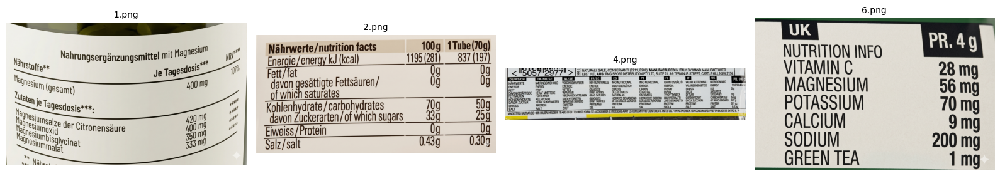

In [36]:
"""Glance at the dataset before running anything."""
sample = list_images(RAW_DIR, limit=4)
logger.info("Found %d images in %s", len(list_images(RAW_DIR)), RAW_DIR)
display_sample_images(sample, n=4)

---

# Phase 1 — OCR engine ablation

Downstream is fixed to **rule-based classifier + Graph V2 association**. Only the
OCR engine changes between EXP-01 and EXP-02.

## EXP-01 — EasyOCR

Run the V2 downstream stack on `EasyOCR` tokens. EasyOCR ships without `cx`/`cy`,
so the runner injects them. The corrector is `OCRCorrector` from `src/utils/ocr_corrector.py`.

04:53:20 [INFO] torch._native.dsl_registry :: Successfully registered DSL: cutedsl
04:53:20 [INFO] torch._native.dsl_registry :: Successfully registered DSL: triton
04:53:27 [INFO] ablation :: [EXP-01] running on 57 images
04:53:39 [INFO] src.utils.token_enricher :: Enriching 23 tokens (9 NOISE excluded)
04:53:39 [INFO] src.utils.token_enricher :: Resolution scale: 3.26x (max_y=1630) → row_perp=82px, col_para=196px
04:53:39 [INFO] src.utils.token_enricher :: Enrichment diagnostics: {'active_tokens': 23, 'num_rows': 5, 'num_columns': 6, 'column_roles': {0: 'NUTRIENT', 1: 'DOSAGE', 2: 'MIXED', 3: 'SINGLETON', 4: 'UNIT', 5: 'SINGLETON'}, 'column_angles': {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0}, 'column_contexts': {4: 'tagesdosis***'}, 'dosage_streams': 1, 'rank_counts': {0: 5, 1: 2, 2: 2, 3: 1, 4: 11, 5: 1}, 'rank_consistent': False, 'headers_detected': 1}
04:53:39 [INFO] src.graph.graph_constructor_v2 :: Graph built: 23 nodes, 219 edges (scale=2.86x, row_thresh=72px)
04:53:48 [I

  EXPERIMENT RESULTS : easyocr
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 878
  Matched pairs      : 579
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.659
  Nutrient Recall    : 0.669
  Nutrient F1        : 0.664
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 45.6%
  Unit Match Acc     : 51.8%
  Context Match Acc  : 62.5%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 23.2%
  ★ Full Tuple Recall    : 23.6%
  ★ Full Tuple F1        : 23.4%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 17.8%
  ★ Full Tuple Recall    : 18.0%
  ★ Full Tuple F1        : 17.9%
─────────────────────────────────────────────────────────────────
  Co

### EXP-01 — easyocr

- OCR: `easyocr` · Classifier: `rule_based` · Association: `graph_v2`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,878,156,722,710,0.1777,0.1801,0.1789,0.6595,0.6686,0.664,0.456,0.5181,0.6252,0.2323,0.2356,0.2339,204,156,579,0.1397,0.1635,0.1925,0.0,0.2534,easyocr,2026-05-17T05:00:26.048123,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,878,5.5,0,156,0.1,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,3,3,67,100,0,33,0,0,3,5,0.0000,0.0000,0.00
1,101.png,11,10,10,20,30,100,20,20,2,8,9,0.2000,0.1818,0.20
2,102.png,18,14,11,9,18,64,9,9,1,13,17,0.0714,0.0556,0.09
3,103.jpeg,18,22,15,47,60,53,47,33,5,17,13,0.2273,0.2778,0.33
4,104.jpeg,18,18,13,31,31,54,31,15,2,16,16,0.1111,0.1111,0.15
5,105.png,18,14,10,20,20,60,20,10,1,13,17,0.0714,0.0556,0.10
6,106.png,2,7,2,50,50,50,50,50,1,6,1,0.1429,0.5000,0.50
7,107.png,10,15,8,50,25,0,25,0,0,15,10,0.0000,0.0000,0.00
8,108.jpeg,11,11,8,25,50,0,25,0,0,11,11,0.0000,0.0000,0.00
9,109.jpeg,9,10,7,57,57,100,57,57,4,6,5,0.4000,0.4444,0.57


#### Image: `114.jpeg`

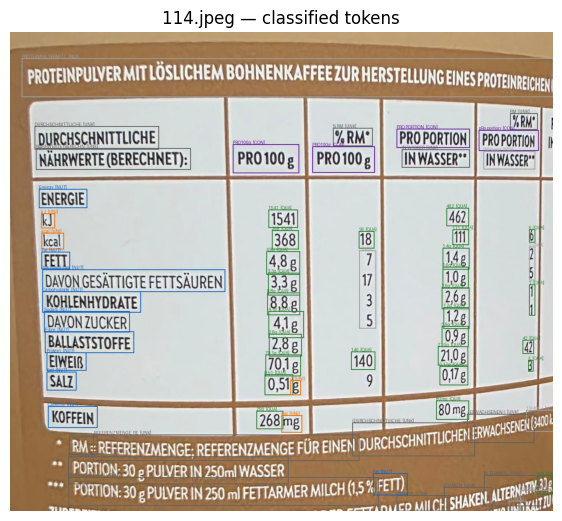

**Predicted tuples** (26) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,1541,kj,per_100g
1,Energy,462,kj,per_serving
2,Fat,4.8,g,per_100g
3,Fat,1.0,g,per_serving
4,Fat,1.4,g,per_serving
5,Saturated Fats,4.8,g,per_100g
6,Saturated Fats,3.3,g,per_100g
7,Saturated Fats,1.0,g,per_serving
8,Carbohydrate,8.8,g,per_100g
9,Carbohydrate,2.6,g,per_serving


**Ground-truth tuples** (20) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1541,kJ,per_100g
1,Energy,368,kcal,per_100g
2,Fat,4.8,g,per_100g
3,Saturated Fats,3.3,g,per_100g
4,Carbohydrate,8.8,g,per_100g
5,Sugars,4.1,g,per_100g
6,Fibre,2.8,g,per_100g
7,Protein,70.1,g,per_100g
8,Salt,0.51,g,per_100g
9,Caffeine,268,mg,per_100g


**Evaluator counts:** TP 16 · FP 10 · FN 4  (precision 0.62, recall 0.80, F1 0.89)

```
Image: 114.jpeg. GT=20, predicted=26, TP=16, FP=10, FN=4. Precision=0.62, recall=0.80, F1=0.89. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 1541 kj [per_100g]; Fat 4.8 g [per_100g]; Saturated Fats 3.3 g [per_100g]  (+15 more)
```

#### Image: `1.png`

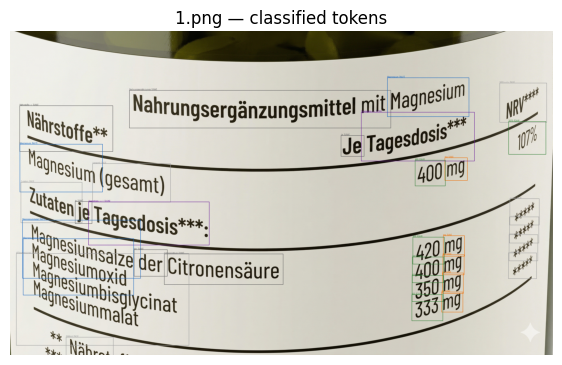

**Predicted tuples** (3) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Magnesium,400,mg,tagesdosis***
1,Magnesiummalat,420,mg,tagesdosis***
2,Magnesiumoxid,400,mg,tagesdosis***


**Ground-truth tuples** (5) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt),400,mg,per_daily_dose
1,Magnesiumsalze der Citronensäure,420,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Evaluator counts:** TP 0 · FP 3 · FN 5  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 1.png. GT=5, predicted=3, TP=0, FP=3, FN=5. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesiumoxid 400 mg [tagesdosis***]; Magnesiummalat 420 mg [tagesdosis***]; Magnesium 400 mg [tagesdosis***]
```

#### Image: `201.jpeg`

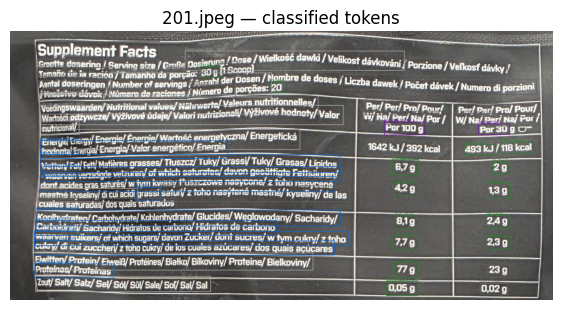

**Predicted tuples** (19) — from `tuples.csv`

,nutrient,quantity,unit,context
0,hodnota] Energia] Energial Valor energeticol Energia,493,kj,por 30
1,hodnota] Energia] Energial Valor energeticol Energia,118,kcal,por 30
2,Vetten Fat] Fett/ Matieres grasses/ Tluszcz] Tukyl Grassi Tukyl Grasas/ Lipidos,679,NaN,per_100g
3,Vetten Fat] Fett/ Matieres grasses/ Tluszcz] Tukyl Grassi Tukyl Grasas/ Lipidos,29,NaN,por 30
4,Saturated Fats,679,NaN,per_100g
5,Saturated Fats,29,NaN,por 30
6,dont acides gras satures/ w tym kwasy t'uszczowe nasycone/ 2 toho nasycene,4.29,NaN,per_100g
7,dont acides gras satures/ w tym kwasy t'uszczowe nasycone/ 2 toho nasycene,1.39,NaN,por 30
8,Koolhvdraten/ Carbohydrate] Kohlenhydratel Glucides/ Weglowodany/ Sacharidy,8.19,NaN,per_100g
9,Koolhvdraten/ Carbohydrate] Kohlenhydratel Glucides/ Weglowodany/ Sacharidy,249,NaN,por 30


**Ground-truth tuples** (16) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1642,kJ,per_100g
1,Energy,392,kcal,per_100g
2,Fat,6.7,g,per_100g
3,Saturated Fats,4.2,g,per_100g
4,Carbohydrate,8.1,g,per_100g
5,Sugars,7.7,g,per_100g
6,Protein,77,g,per_100g
7,Salt,0.05,g,per_100g
8,Energy,493,kJ,per_serving (30 g (1 Scoop))
9,Energy,118,kcal,per_serving (30 g (1 Scoop))


**Evaluator counts:** TP 0 · FP 19 · FN 16  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 201.jpeg. GT=16, predicted=19, TP=0, FP=19, FN=16. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Fat 4.29  [per_100g]; Saturated Fats 679  [per_100g]; Carbohydrate 8.19  [per_100g]  (+6 more)
```

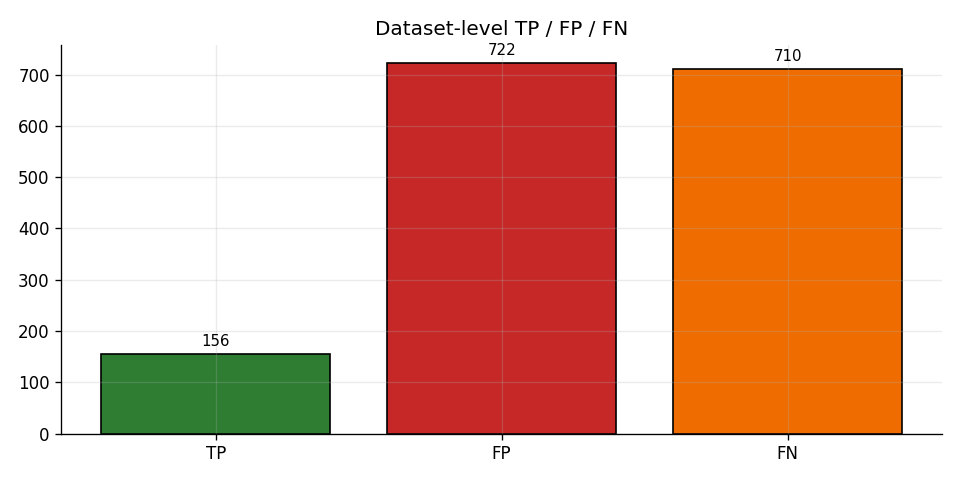

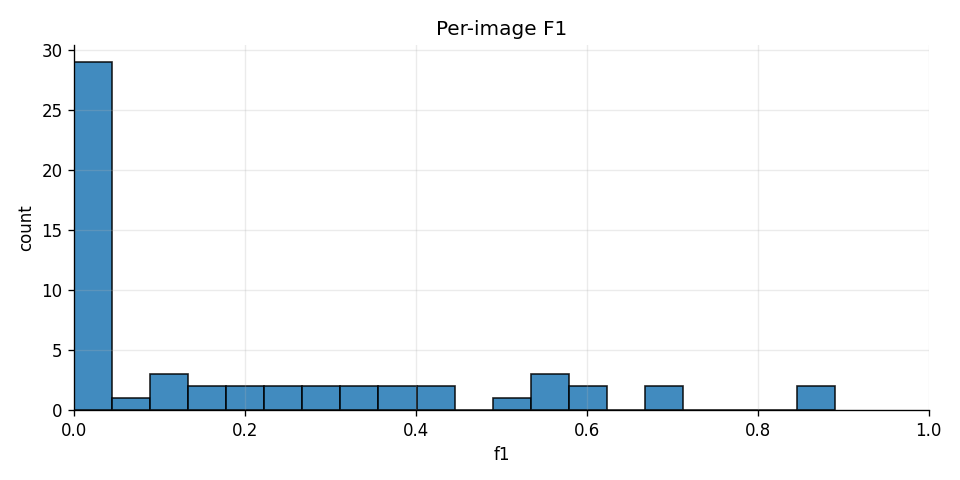

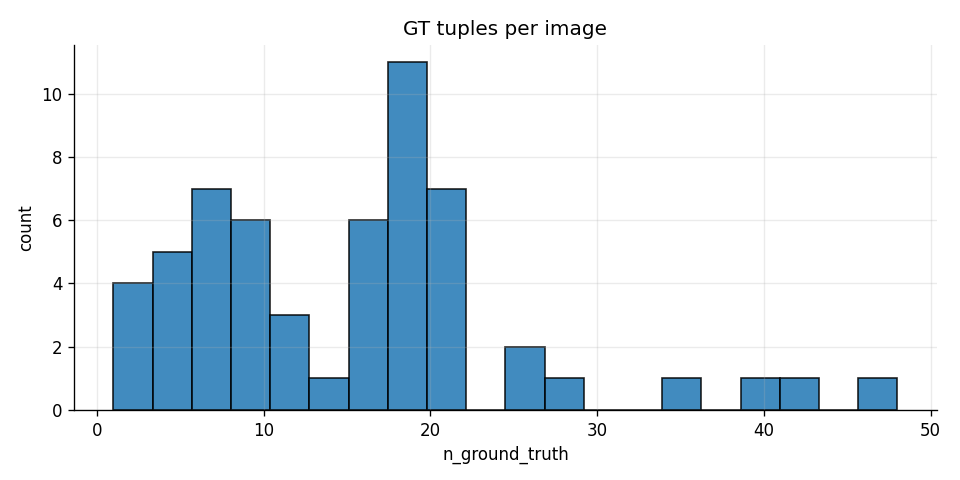

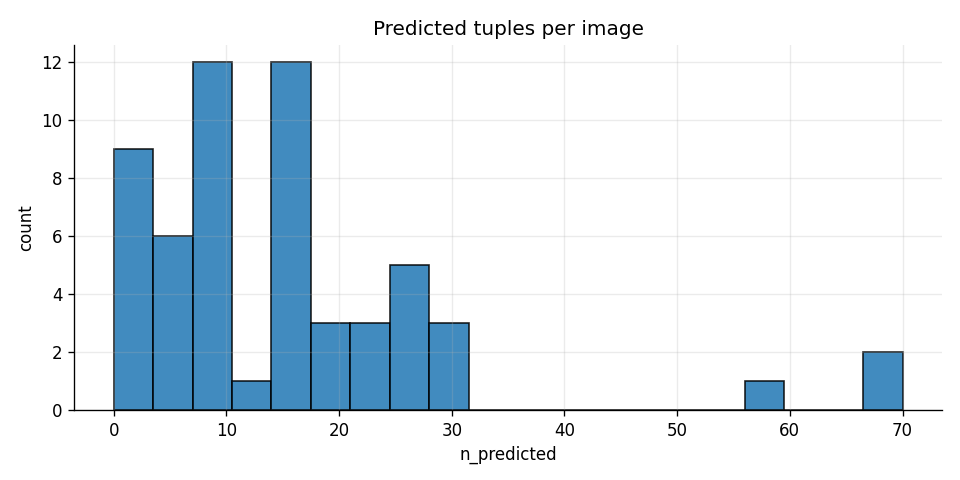

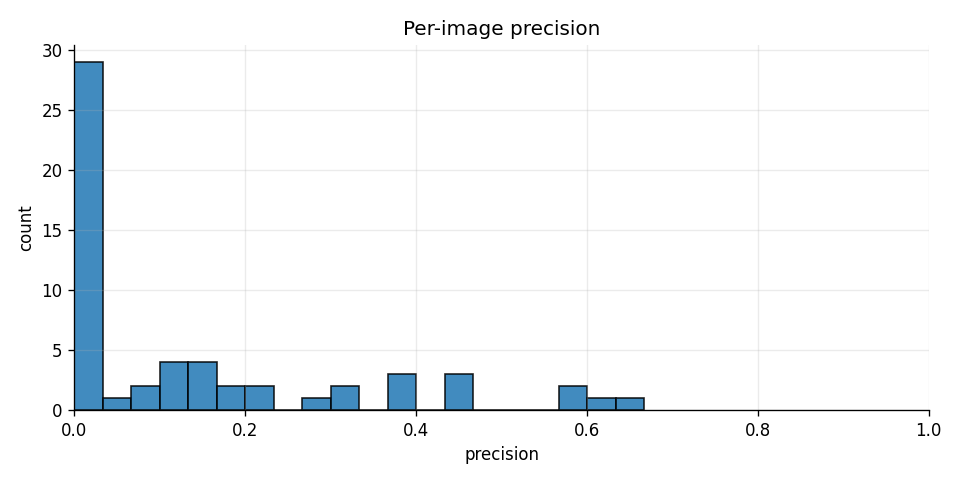

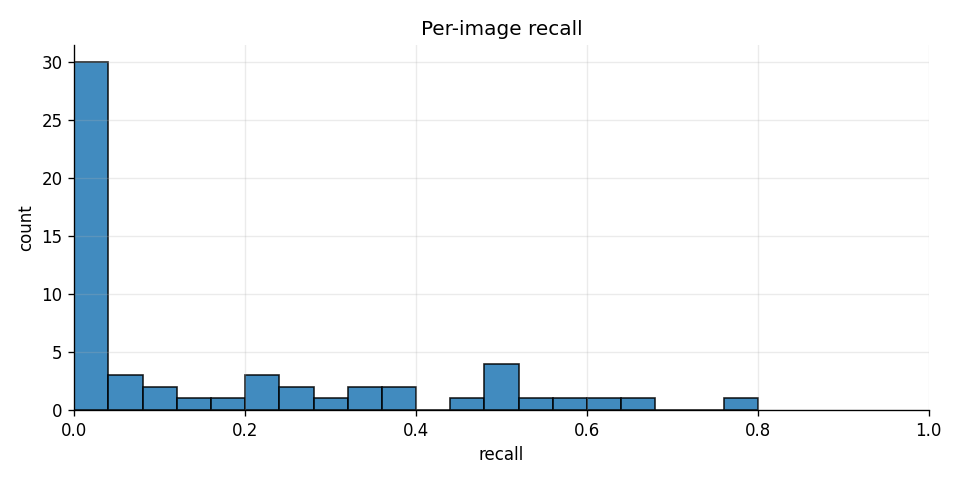

# Dataset-level descriptive report — EXP-01

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 878
- True positives: 156
- False positives: 722
- False negatives: 710
- Dataset-level **precision = 0.1777**, **recall = 0.1801**, **F1 = 0.1789**
- Mean per-image F1: 0.1925
- Median per-image F1: 0.0000
- Standard deviation of per-image F1: 0.2534

## Performance characterisation

The experiment is limited primarily by precision and recall in roughly balanced proportion. The 0.25 standard deviation of per-image F1 indicates highly variable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id   f1  tp  fp  fn
    114.jpeg 0.89  16  10   4
    116.jpeg 0.86  12   6   6
    113.jpeg 0.71  10  12  10
    121.jpeg 0.67  12  15   8
      34.png 0.61  23  36  17

## Worst-performing images

    image_id  f1  tp  fp  fn
       1.png 0.0   0   3   5
     107.png 0.0   0  15  10
    108.jpeg 0.0   0  11  11
    111.jpeg 0.0   0   2   1
    112.jpeg 0.0   0   2   1


In [37]:
exp01_result = run_single_experiment(
    experiment_id   = "EXP-01",
    experiment_name = "easyocr",
    ocr_engine      = "easyocr",
    classifier_key  = ablation_config["phase1"]["fixed_classifier"],
    association_key = ablation_config["phase1"]["fixed_association"],
    notes           = "Phase 1 — EasyOCR baseline under V2 downstream.",
)
display_experiment_results(exp01_result)

## EXP-02 — PaddleOCR

Same downstream as EXP-01, but with PaddleOCR (PP-OCRv5). The corrector is
`paddleOCR_corrector_v2.correct_tokens`.

05:01:22 [INFO] ablation :: [EXP-02] running on 57 images
05:01:22 [INFO] paddleocr_runner :: [PaddleOCR] '1.png' (2682x1600px)


  EXPERIMENT RESULTS : paddleocr
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 912
  Matched pairs      : 631
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.692
  Nutrient Recall    : 0.729
  Nutrient F1        : 0.710
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 77.0%
  Unit Match Acc     : 80.7%
  Context Match Acc  : 86.2%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 41.9%
  ★ Full Tuple Recall    : 44.1%
  ★ Full Tuple F1        : 43.0%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 39.7%
  ★ Full Tuple Recall    : 41.8%
  ★ Full Tuple F1        : 40.7%
─────────────────────────────────────────────────────────────────
  

### EXP-02 — paddleocr

- OCR: `paddleocr` · Classifier: `rule_based` · Association: `graph_v2`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,912,362,550,504,0.3969,0.418,0.4072,0.6919,0.7286,0.7098,0.7702,0.8067,0.8621,0.4189,0.4411,0.4297,382,362,631,0.3937,0.4133,0.5012,0.57,0.3425,paddleocr,2026-05-17T05:04:57.951685,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,912,2.2,0,362,0.1,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,5,4,100,100,100,100,100,4,1,1,0.8000,0.8000,1.00
1,101.png,11,11,11,91,91,100,91,91,10,1,1,0.9091,0.9091,0.91
2,102.png,18,22,13,77,92,62,77,62,8,14,10,0.3636,0.4444,0.62
3,103.jpeg,18,20,17,76,82,88,65,59,10,10,8,0.5000,0.5556,0.59
4,104.jpeg,18,19,15,80,80,87,73,73,11,8,7,0.5789,0.6111,0.73
5,105.png,18,16,13,69,100,54,69,46,6,10,12,0.3750,0.3333,0.46
6,106.png,2,8,2,100,50,0,50,0,0,8,2,0.0000,0.0000,0.00
7,107.png,10,16,10,80,50,100,50,50,5,11,5,0.3125,0.5000,0.50
8,108.jpeg,11,18,10,70,70,100,70,70,7,11,4,0.3889,0.6364,0.70
9,109.jpeg,9,12,9,100,100,100,100,100,9,3,0,0.7500,1.0000,1.00


#### Image: `1.png`

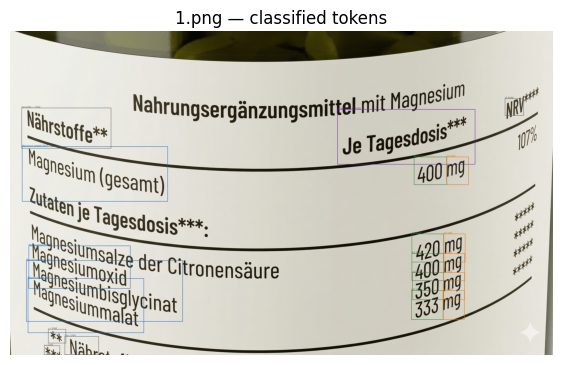

**Predicted tuples** (5) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt,400,mg,per_daily_dose
1,Magnesiumoxid,400,mg,per_daily_dose
2,Magnesiumbisglycinat,333,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Ground-truth tuples** (5) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt),400,mg,per_daily_dose
1,Magnesiumsalze der Citronensäure,420,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Evaluator counts:** TP 4 · FP 1 · FN 1  (precision 0.80, recall 0.80, F1 1.00)

```
Image: 1.png. GT=5, predicted=5, TP=4, FP=1, FN=1. Precision=0.80, recall=0.80, F1=1.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium (gesamt 400 mg [per_daily_dose]; Magnesiumoxid 400 mg [per_daily_dose]; Magnesiumbisglycinat 350 mg [per_daily_dose]  (+1 more)
```

#### Image: `106.png`

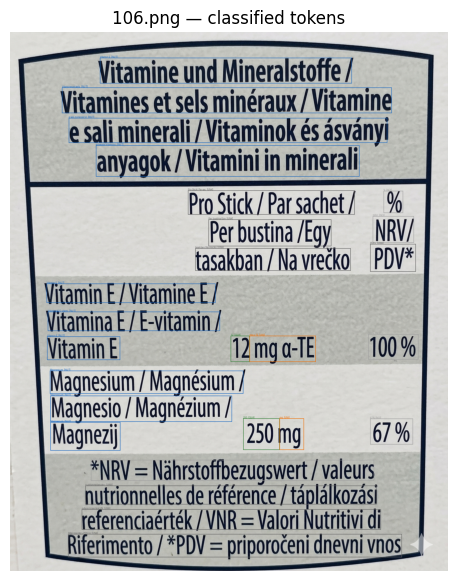

**Predicted tuples** (8) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Vitamin E,NaN,NaN,None
1,Vitamines et sels minéraux/Vitamine,NaN,NaN,None
2,e sali minerali/Vitaminok es asvanyi,NaN,NaN,None
3,anyagok/Vitamini in minerali,12,mg a-te,None
4,VitaminaE/E-vitamin,NaN,NaN,None
5,Vitamin E,12,mg a-te,None
6,Magnesium,NaN,NaN,None
7,Magnesium,250,mg,None


**Ground-truth tuples** (2) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Vitamin E,12,mg α-TE,per_serving (Pro Stick)
1,Magnesium,250,mg,per_serving (Pro Stick)


**Evaluator counts:** TP 0 · FP 8 · FN 2  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 106.png. GT=2, predicted=8, TP=0, FP=8, FN=2. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium 250 mg []; Vitamin E 12 mg a-te []
```

#### Image: `201.jpeg`

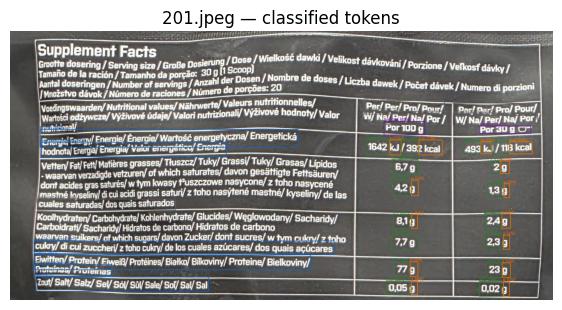

**Predicted tuples** (14) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,1642,kj,per_100g
1,Energy,392,kcal,per_100g
2,Energy,493,kj,por 30go
3,hodnota/Energia/Energia/Valor energetico/Energia,1642,kj,per_100g
4,hodnota/Energia/Energia/Valor energetico/Energia,493,kj,por 30go
5,hodnota/Energia/Energia/Valor energetico/Energia,118,kcal,por 30go
6,cukry/di cui zuccheri/z toho cukry/de los cuales azucares/dos quais acucares,779,g,per_100g
7,cukry/di cui zuccheri/z toho cukry/de los cuales azucares/dos quais acucares,2.3,g,por 30go
8,Protein,77,g,per_100g
9,Protein,23,g,por 30go


**Ground-truth tuples** (16) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1642,kJ,per_100g
1,Energy,392,kcal,per_100g
2,Fat,6.7,g,per_100g
3,Saturated Fats,4.2,g,per_100g
4,Carbohydrate,8.1,g,per_100g
5,Sugars,7.7,g,per_100g
6,Protein,77,g,per_100g
7,Salt,0.05,g,per_100g
8,Energy,493,kJ,per_serving (30 g (1 Scoop))
9,Energy,118,kcal,per_serving (30 g (1 Scoop))


**Evaluator counts:** TP 4 · FP 10 · FN 12  (precision 0.29, recall 0.25, F1 0.57)

```
Image: 201.jpeg. GT=16, predicted=14, TP=4, FP=10, FN=12. Precision=0.29, recall=0.25, F1=0.57. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 1642 kj [per_100g]; Energy 392 kcal [per_100g]; Protein 77 g [per_100g]  (+4 more)
```

#### Image: `41.png`

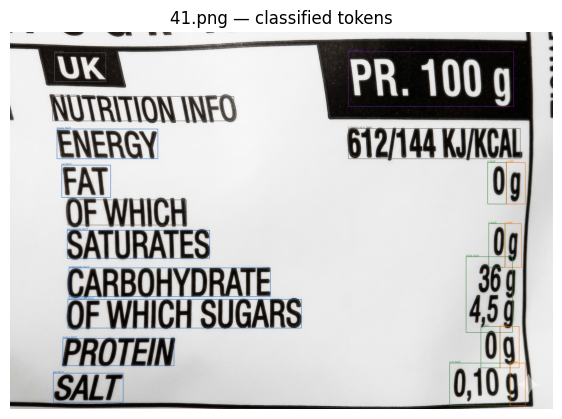

**Predicted tuples** (7) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,0,g,per_100g
1,Fat,0,g,per_100g
2,Saturated Fats,0,g,per_100g
3,Carbohydrate,16156,g,per_100g
4,OFWHICH SUGARS,0.10,g,per_100g
5,Protein,0,g,per_100g
6,Salt,0.10,g,per_100g


**Ground-truth tuples** (8) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,612,kJ,per_100g
1,Energy,144,kcal,per_100g
2,Fat,0,g,per_100g
3,Saturated Fats,0,g,per_100g
4,Carbohydrate,36,g,per_100g
5,Sugars,4.5,g,per_100g
6,Protein,0,g,per_100g
7,Salt,0.10,g,per_100g


**Evaluator counts:** TP 4 · FP 3 · FN 4  (precision 0.57, recall 0.50, F1 0.57)

```
Image: 41.png. GT=8, predicted=7, TP=4, FP=3, FN=4. Precision=0.57, recall=0.50, F1=0.57. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Fat 0 g [per_100g]; Saturated Fats 0 g [per_100g]; Protein 0 g [per_100g]  (+4 more)
```

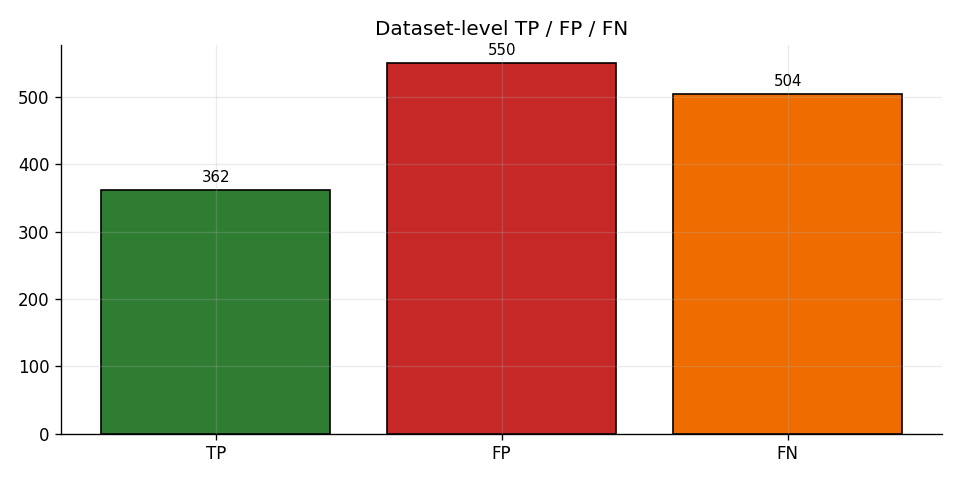

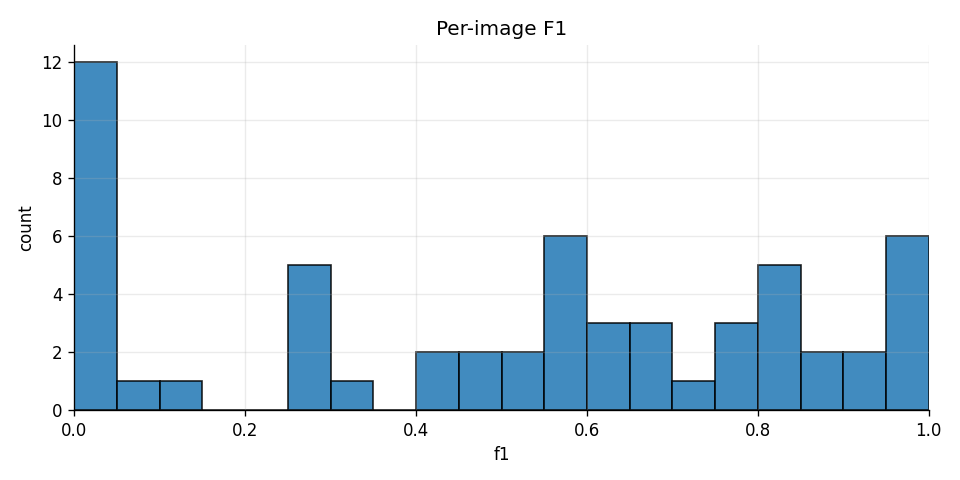

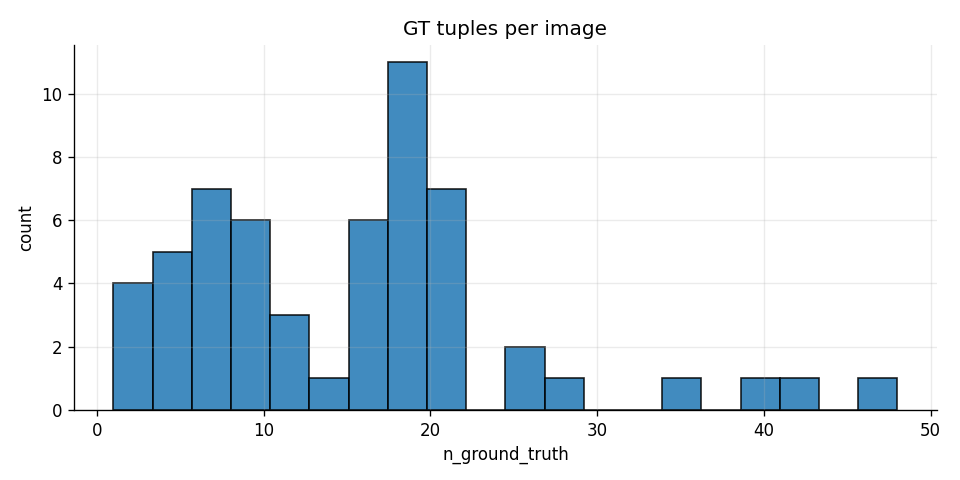

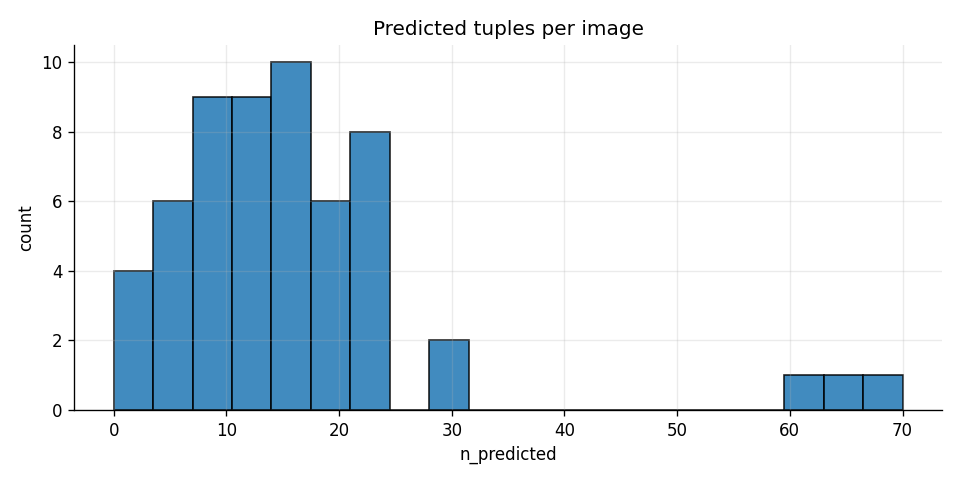

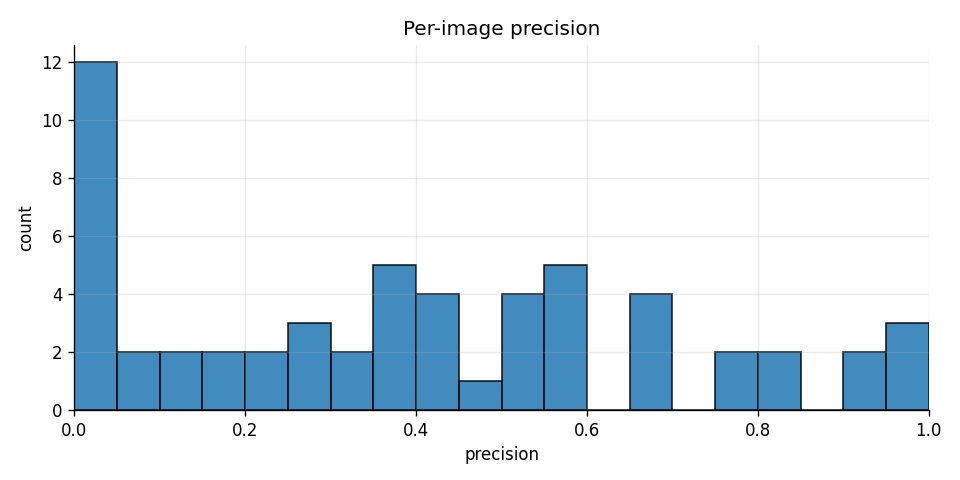

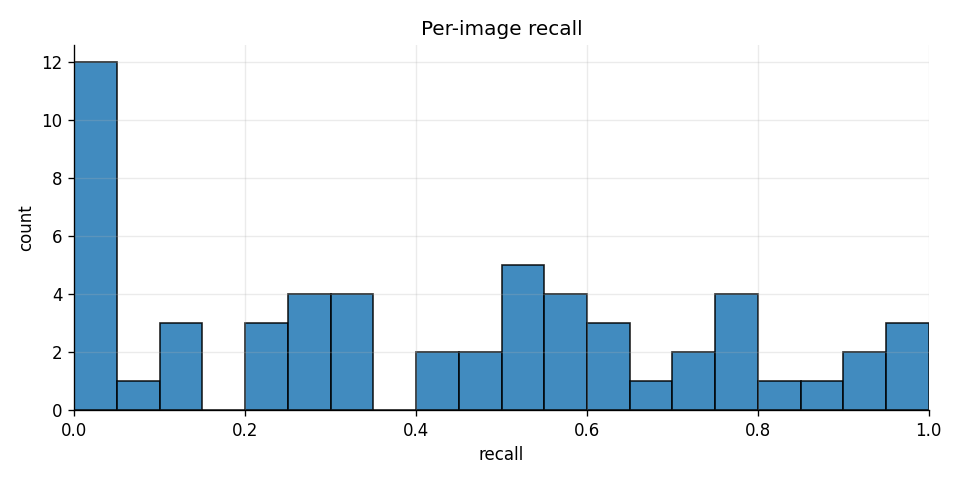

# Dataset-level descriptive report — EXP-02

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 912
- True positives: 362
- False positives: 550
- False negatives: 504
- Dataset-level **precision = 0.3969**, **recall = 0.4180**, **F1 = 0.4072**
- Mean per-image F1: 0.5012
- Median per-image F1: 0.5700
- Standard deviation of per-image F1: 0.3425

## Performance characterisation

The experiment is limited primarily by precision and recall in roughly balanced proportion. The 0.34 standard deviation of per-image F1 indicates highly variable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id  f1  tp  fp  fn
       1.png 1.0   4   1   1
    109.jpeg 1.0   9   3   0
    110.jpeg 1.0   6   0   0
      15.png 1.0   9   0  33
       6.png 1.0   6   0   0

## Worst-performing images

    image_id  f1  tp  fp  fn
     106.png 0.0   0   8   2
    111.jpeg 0.0   0   2   1
    112.jpeg 0.0   0   2   1
    118.jpeg 0.0   0  15  20
    119.jpeg 0.0   0  12  20


In [38]:
exp02_result = run_single_experiment(
    experiment_id   = "EXP-02",
    experiment_name = "paddleocr",
    ocr_engine      = "paddleocr",
    classifier_key  = ablation_config["phase1"]["fixed_classifier"],
    association_key = ablation_config["phase1"]["fixed_association"],
    notes           = "Phase 1 — PaddleOCR under V2 downstream.",
)
display_experiment_results(exp02_result)

## Phase 1 Summary — OCR Winner

Compare EXP-01 and EXP-02. Winner is chosen by `full_tuple_f1` and locked into
Phase 2 via `ablation_config["phase2"]["ocr_engine"]`.

### Phase 1 — OCR comparison

,experiment_id,experiment_name,ocr_engine,classifier_key,association_key,full_tuple_precision,full_tuple_recall,full_tuple_f1,n_images,n_predicted,n_ground_truth
0,EXP-01,easyocr,easyocr,rule_based,graph_v2,0.1777,0.1801,0.1789,57,878,866
1,EXP-02,paddleocr,paddleocr,rule_based,graph_v2,0.3969,0.4180,0.4072,57,912,866


**Winner: `paddleocr`** (EXP-02) — full_tuple_f1 = 0.4072 (Δ +0.2283 over the other engine).

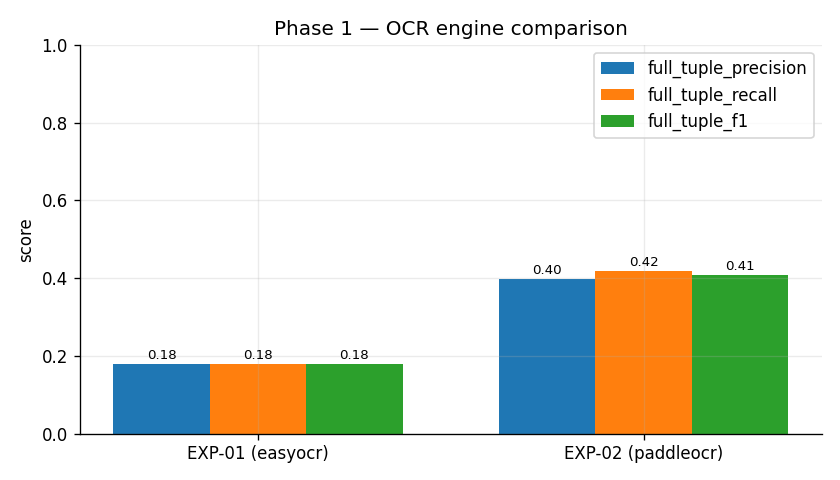

In [39]:
def _summarize_phase1(results: List[ExperimentResult]) -> pd.DataFrame:
    rows = []
    for r in results:
        m = r.dataset_metrics
        rows.append({
            "experiment_id":   r.spec.experiment_id,
            "experiment_name": r.spec.experiment_name,
            "ocr_engine":      r.spec.ocr_engine,
            "classifier_key":  r.spec.classifier_key,
            "association_key": r.spec.association_key,
            "full_tuple_precision": m.get("full_tuple_precision", 0.0),
            "full_tuple_recall":    m.get("full_tuple_recall",    0.0),
            "full_tuple_f1":        m.get("full_tuple_f1",        0.0),
            "n_images":             m.get("n_images",             0),
            "n_predicted":          m.get("n_predicted",          0),
            "n_ground_truth":       m.get("n_ground_truth",       0),
        })
    return pd.DataFrame(rows)

phase1_df = _summarize_phase1([exp01_result, exp02_result])
phase1_df.to_csv(SUMMARY_DIR / "phase1_summary.csv", index=False)

# Pick the winner
primary = ablation_config["phase1"]["primary_metric"]
winner_row = phase1_df.loc[phase1_df[primary].idxmax()]
winner = {
    "experiment_id":   winner_row["experiment_id"],
    "ocr_engine":      winner_row["ocr_engine"],
    "metric":          primary,
    "value":           float(winner_row[primary]),
    "delta_over_other": float(winner_row[primary] - phase1_df[primary].min()),
}
with open(SUMMARY_DIR / "phase1_winner.json", "w", encoding="utf-8") as f:
    json.dump(winner, f, indent=2)

# Lock the winner for Phase 2
ablation_config["phase2"]["ocr_engine"] = winner["ocr_engine"]

# Display
display(Markdown("### Phase 1 — OCR comparison"))
display(phase1_df)
display(Markdown(
    f"**Winner: `{winner['ocr_engine']}`** "
    f"({winner['experiment_id']}) — {primary} = {winner['value']:.4f} "
    f"(Δ +{winner['delta_over_other']:.4f} over the other engine)."
))

plot_phase1_comparison(phase1_df, SUMMARY_DIR / "plots" / "phase1_comparison.png")
display(IPImage(filename=str(SUMMARY_DIR / "plots" / "phase1_comparison.png")))

---

# Phase 2 — Classifier × Association ablation

OCR engine locked to the Phase 1 winner. Now we sweep the 3 × 3 grid of
{rule-based, embedding, GLiNER} × {Graph v1, Graph v2, VLM}.

VLM cells (`EXP-05`, `EXP-08`, `EXP-11`) only execute when
`ablation_config["RUN_VLM_EXPERIMENTS"] = True`. Otherwise they return an
empty stub so the notebook stays runnable end-to-end.

In [40]:
PHASE2_OCR = ablation_config["phase2"]["ocr_engine"]
logger.info("Phase 2 OCR engine: %s", PHASE2_OCR)

def _phase2_name(clf_letter: str, assoc_letter: str) -> str:
    return f"{clf_letter}_{assoc_letter}"

## EXP-03 — Classifier A (rule-based) + Graph v1

  EXPERIMENT RESULTS : A_G1
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 903
  Matched pairs      : 623
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.690
  Nutrient Recall    : 0.719
  Nutrient F1        : 0.704
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 70.1%
  Unit Match Acc     : 71.9%
  Context Match Acc  : 61.5%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 35.0%
  ★ Full Tuple Recall    : 36.5%
  ★ Full Tuple F1        : 35.7%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 23.8%
  ★ Full Tuple Recall    : 24.8%
  ★ Full Tuple F1        : 24.3%
─────────────────────────────────────────────────────────────────
  Conte

### EXP-03 — A_G1

- OCR: `paddleocr` · Classifier: `rule_based` · Association: `graph_v1`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,903,215,688,651,0.2381,0.2483,0.2431,0.6899,0.7194,0.7044,0.7014,0.7191,0.6148,0.3499,0.3649,0.3573,316,215,623,0.262,0.2896,0.3347,0.33,0.277,A_G1,2026-05-16T08:32:03.727565,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,903,11.4,0,215,0.1,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,5,4,100,100,100,100,100,4,1,1,0.8000,0.8000,1.00
1,101.png,11,11,11,91,82,100,82,82,9,2,2,0.8182,0.8182,0.82
2,102.png,18,22,13,77,85,62,69,54,7,15,11,0.3182,0.3889,0.54
3,103.jpeg,18,20,17,59,82,53,47,35,6,14,12,0.3000,0.3333,0.35
4,104.jpeg,18,19,15,73,67,53,53,40,6,13,12,0.3158,0.3333,0.40
5,105.png,18,16,13,69,85,54,54,46,6,10,12,0.3750,0.3333,0.46
6,106.png,2,8,2,100,50,0,50,0,0,8,2,0.0000,0.0000,0.00
7,107.png,10,16,10,80,50,100,50,50,5,11,5,0.3125,0.5000,0.50
8,108.jpeg,11,18,10,70,70,100,70,70,7,11,4,0.3889,0.6364,0.70
9,109.jpeg,9,12,9,100,89,100,89,89,8,4,1,0.6667,0.8889,0.89


#### Image: `1.png`

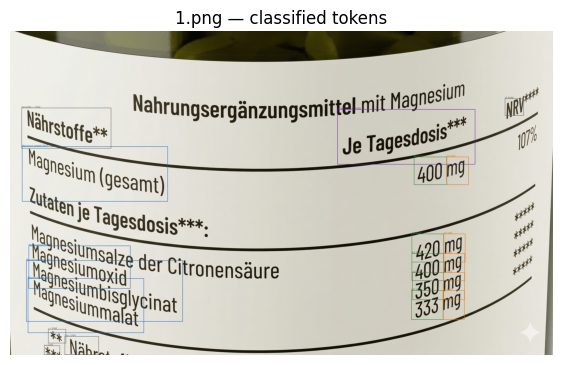

**Predicted tuples** (5) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt,400,mg,per_daily_dose
1,Magnesiumoxid,400,mg,per_daily_dose
2,Magnesiumbisglycinat,333,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Ground-truth tuples** (5) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt),400,mg,per_daily_dose
1,Magnesiumsalze der Citronensäure,420,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Evaluator counts:** TP 4 · FP 1 · FN 1  (precision 0.80, recall 0.80, F1 1.00)

```
Image: 1.png. GT=5, predicted=5, TP=4, FP=1, FN=1. Precision=0.80, recall=0.80, F1=1.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium (gesamt 400 mg [per_daily_dose]; Magnesiumoxid 400 mg [per_daily_dose]; Magnesiumbisglycinat 350 mg [per_daily_dose]  (+1 more)
```

#### Image: `106.png`

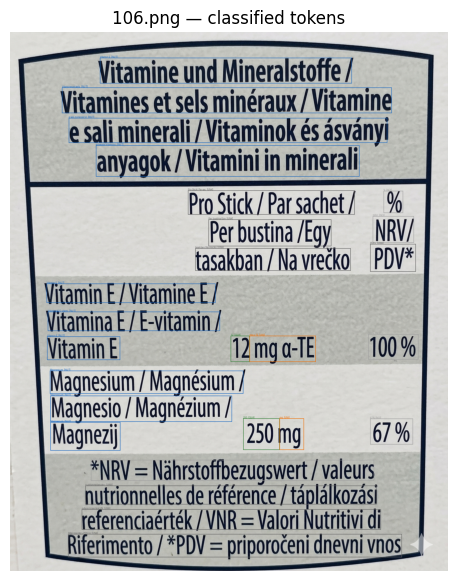

**Predicted tuples** (8) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Vitamin E,NaN,NaN,None
1,Vitamines et sels minéraux/Vitamine,NaN,NaN,None
2,e sali minerali/Vitaminok es asvanyi,NaN,NaN,None
3,anyagok/Vitamini in minerali,12,mg a-te,None
4,VitaminaE/E-vitamin,NaN,NaN,None
5,Vitamin E,12,mg a-te,None
6,Magnesium,NaN,NaN,None
7,Magnesium,250,mg,None


**Ground-truth tuples** (2) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Vitamin E,12,mg α-TE,per_serving (Pro Stick)
1,Magnesium,250,mg,per_serving (Pro Stick)


**Evaluator counts:** TP 0 · FP 8 · FN 2  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 106.png. GT=2, predicted=8, TP=0, FP=8, FN=2. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium 250 mg []; Vitamin E 12 mg a-te []
```

#### Image: `91.png`

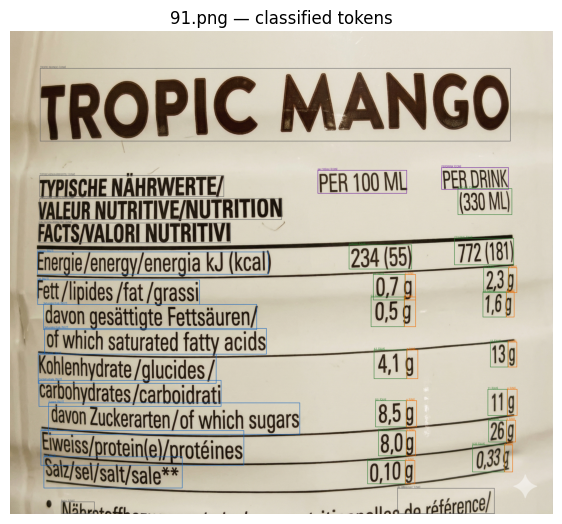

**Predicted tuples** (22) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,234,g,per_serving
1,Energy,0.7,g,per_serving
2,Energy,772,g,per_serving
3,Fat,0.5,g,per_serving
4,Fat,0.7,g,per_serving
5,Fat,1.6,g,per_serving
6,Saturated Fats,0.5,g,per_serving
7,Saturated Fats,1.6,g,per_serving
8,Saturated Fats,4.1,g,per_serving
9,Saturated Fats,13,g,per_serving


**Ground-truth tuples** (16) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,234,kJ,per_100ml
1,Energy,55,kcal,per_100ml
2,Fat,0.7,g,per_100ml
3,Saturated Fats,0.5,g,per_100ml
4,Carbohydrate,4.1,g,per_100ml
5,Sugars,8.5,g,per_100ml
6,Protein,8.0,g,per_100ml
7,Salt,0.10,g,per_100ml
8,Energy,772,kJ,per_serving (PER DRINK (330 ML))
9,Energy,181,kcal,per_serving (PER DRINK (330 ML))


**Evaluator counts:** TP 5 · FP 17 · FN 11  (precision 0.23, recall 0.31, F1 0.33)

```
Image: 91.png. GT=16, predicted=22, TP=5, FP=17, FN=11. Precision=0.23, recall=0.31, F1=0.33. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Saturated Fats 1.6 g [per_serving]; Carbohydrate 13 g [per_serving]; Sugars 11 g [per_serving]  (+12 more)
```

#### Image: `42.png`

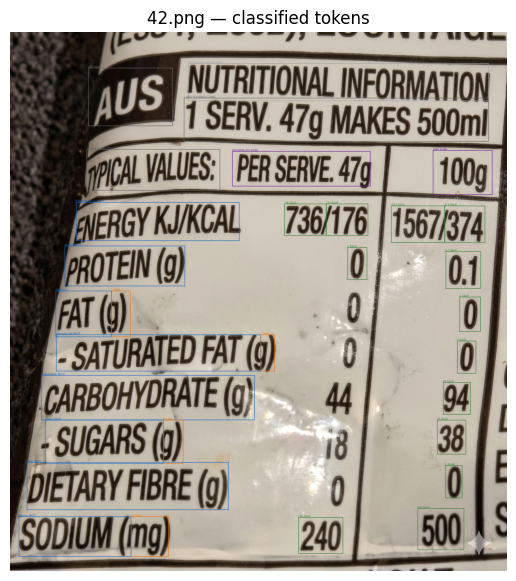

**Predicted tuples** (12) — from `tuples.csv`

,nutrient,quantity,unit,context
0,ENERGYKJ/KCAL,736,NaN,per_100g
1,ENERGYKJ/KCAL,176,NaN,per_100g
2,ENERGYKJ/KCAL,1567,NaN,per_100g
3,Protein,0,NaN,per_100g
4,Protein,0.1,NaN,per_100g
5,Fat,0,g,per_100g
6,Saturated Fats,0,g,per_100g
7,Carbohydrate,94,NaN,per_100g
8,Sugars,38,g,per_100g
9,Fibre,0,NaN,per_100g


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,736,kJ,per_serving (PER SERVE 47g)
1,Energy,176,kcal,per_serving (PER SERVE 47g)
2,Protein,0,g,per_serving (PER SERVE 47g)
3,Fat,0,g,per_serving (PER SERVE 47g)
4,Saturated Fats,0,g,per_serving (PER SERVE 47g)
5,Carbohydrate,44,g,per_serving (PER SERVE 47g)
6,Sugars,18,g,per_serving (PER SERVE 47g)
7,Fibre,0,g,per_serving (PER SERVE 47g)
8,Sodium,240,mg,per_serving (PER SERVE 47g)
9,Energy,1567,kJ,per_100g


**Evaluator counts:** TP 4 · FP 8 · FN 14  (precision 0.33, recall 0.22, F1 0.33)

```
Image: 42.png. GT=18, predicted=12, TP=4, FP=8, FN=14. Precision=0.33, recall=0.22, F1=0.33. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Fat 0 g [per_100g]; Saturated Fats 0 g [per_100g]; Sugars 38 g [per_100g]  (+9 more)
```

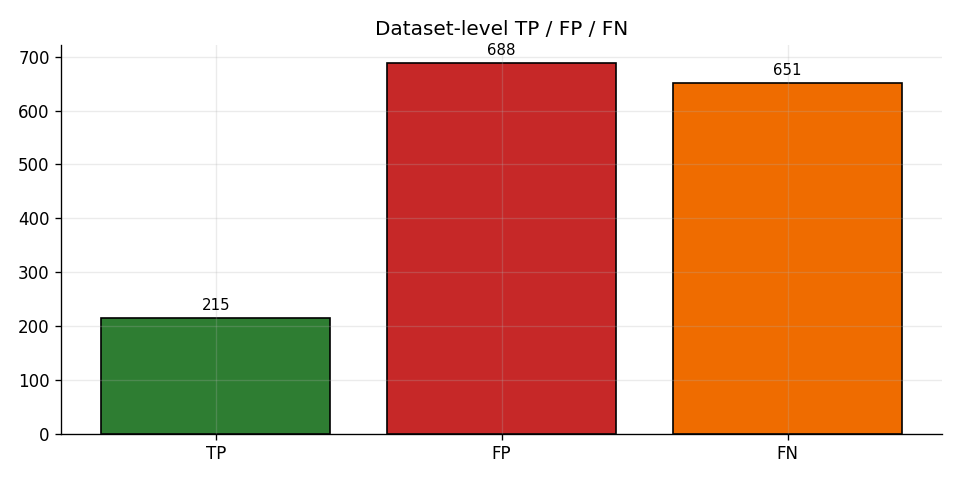

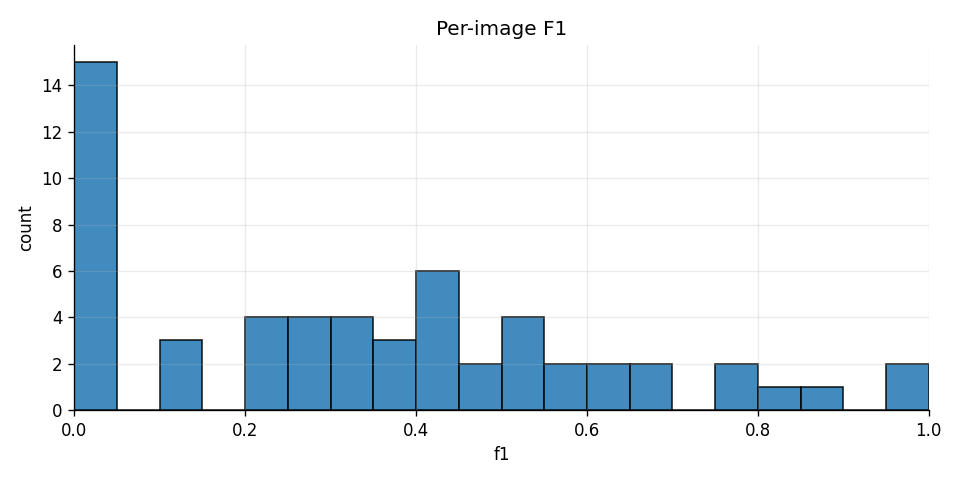

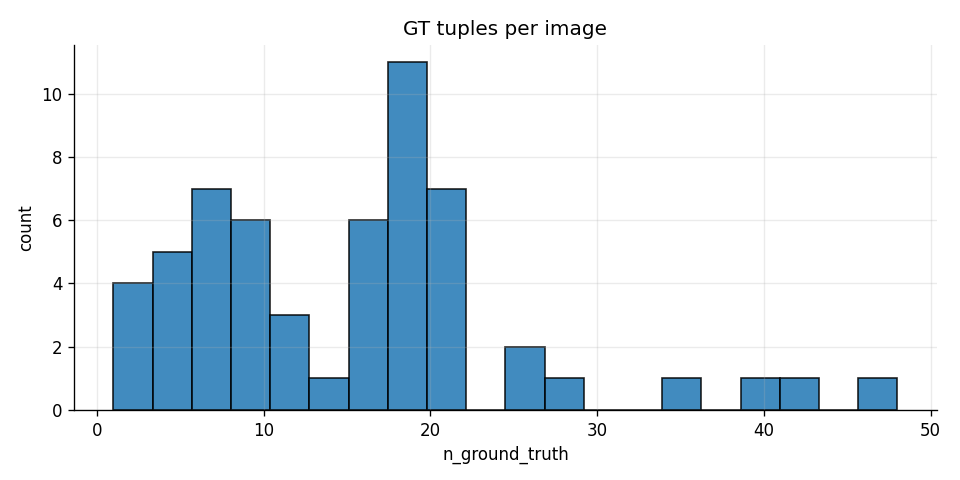

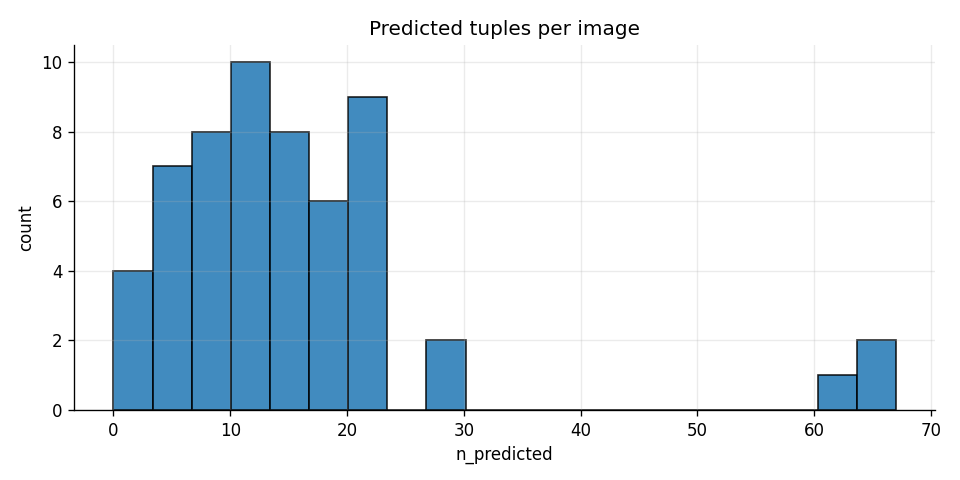

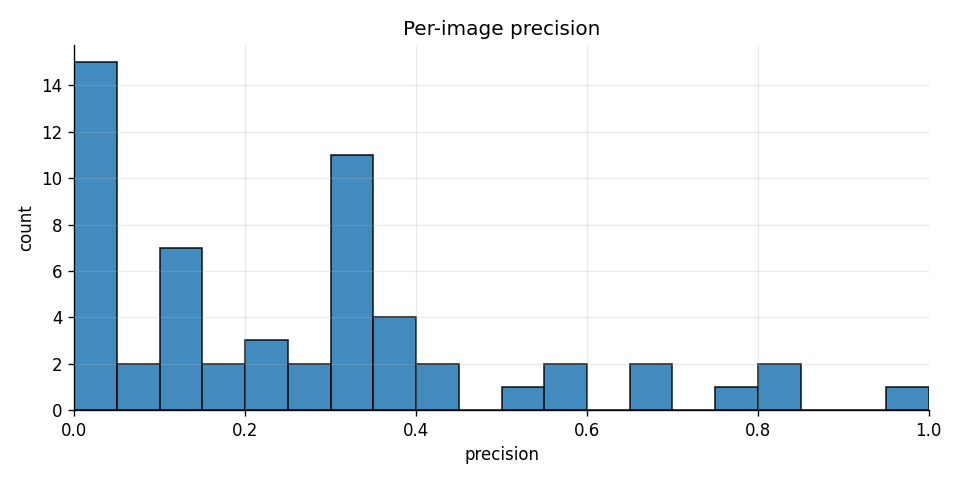

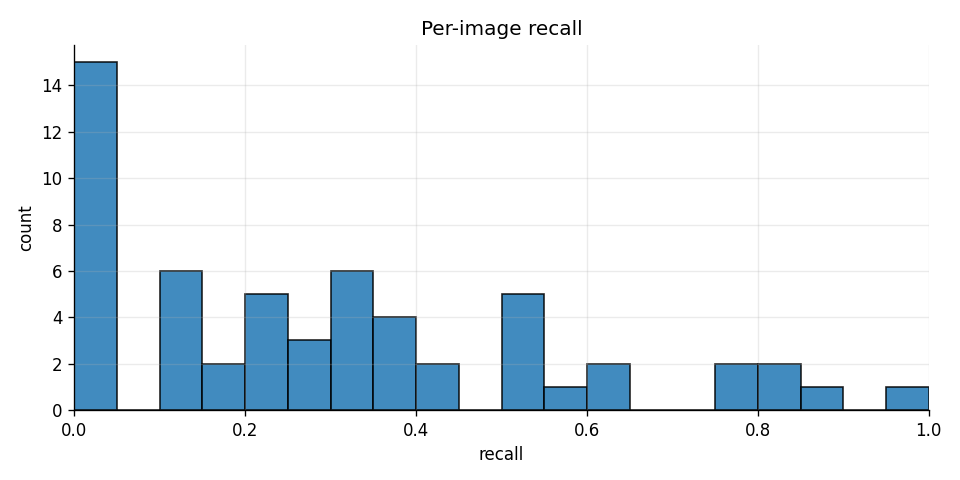

# Dataset-level descriptive report — EXP-03

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 903
- True positives: 215
- False positives: 688
- False negatives: 651
- Dataset-level **precision = 0.2381**, **recall = 0.2483**, **F1 = 0.2431**
- Mean per-image F1: 0.3347
- Median per-image F1: 0.3300
- Standard deviation of per-image F1: 0.2770

## Performance characterisation

The experiment is limited primarily by precision and recall in roughly balanced proportion. The 0.28 standard deviation of per-image F1 indicates highly variable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id   f1  tp  fp  fn
       1.png 1.00   4   1   1
       6.png 1.00   6   0   0
    109.jpeg 0.89   8   4   1
     101.png 0.82   9   2   2
      17.png 0.75   3   4   1

## Worst-performing images

    image_id  f1  tp  fp  fn
     106.png 0.0   0   8   2
    111.jpeg 0.0   0   2   1
    112.jpeg 0.0   0   2   1
    113.jpeg 0.0   0  22  20
    118.jpeg 0.0   0  14  20


In [20]:
exp03_result = run_single_experiment(
    experiment_id   = "EXP-03",
    experiment_name = _phase2_name("A", "G1"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["A"],
    association_key = ablation_config["phase2"]["associations"]["G1"],
    notes           = "rule_based + graph_v1",
)
display_experiment_results(exp03_result)

## EXP-04 — Classifier A (rule-based) + Graph v2

  EXPERIMENT RESULTS : A_G2
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 912
  Matched pairs      : 631
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.692
  Nutrient Recall    : 0.729
  Nutrient F1        : 0.710
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 77.0%
  Unit Match Acc     : 80.7%
  Context Match Acc  : 86.2%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 41.9%
  ★ Full Tuple Recall    : 44.1%
  ★ Full Tuple F1        : 43.0%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 39.7%
  ★ Full Tuple Recall    : 41.8%
  ★ Full Tuple F1        : 40.7%
─────────────────────────────────────────────────────────────────
  Conte

### EXP-04 — A_G2

- OCR: `paddleocr` · Classifier: `rule_based` · Association: `graph_v2`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,912,362,550,504,0.3969,0.418,0.4072,0.6919,0.7286,0.7098,0.7702,0.8067,0.8621,0.4189,0.4411,0.4297,382,362,631,0.3937,0.4133,0.5012,0.57,0.3425,A_G2,2026-05-16T08:35:51.555709,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,912,2.2,0,362,0.1,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,5,4,100,100,100,100,100,4,1,1,0.8000,0.8000,1.00
1,101.png,11,11,11,91,91,100,91,91,10,1,1,0.9091,0.9091,0.91
2,102.png,18,22,13,77,92,62,77,62,8,14,10,0.3636,0.4444,0.62
3,103.jpeg,18,20,17,76,82,88,65,59,10,10,8,0.5000,0.5556,0.59
4,104.jpeg,18,19,15,80,80,87,73,73,11,8,7,0.5789,0.6111,0.73
5,105.png,18,16,13,69,100,54,69,46,6,10,12,0.3750,0.3333,0.46
6,106.png,2,8,2,100,50,0,50,0,0,8,2,0.0000,0.0000,0.00
7,107.png,10,16,10,80,50,100,50,50,5,11,5,0.3125,0.5000,0.50
8,108.jpeg,11,18,10,70,70,100,70,70,7,11,4,0.3889,0.6364,0.70
9,109.jpeg,9,12,9,100,100,100,100,100,9,3,0,0.7500,1.0000,1.00


#### Image: `1.png`

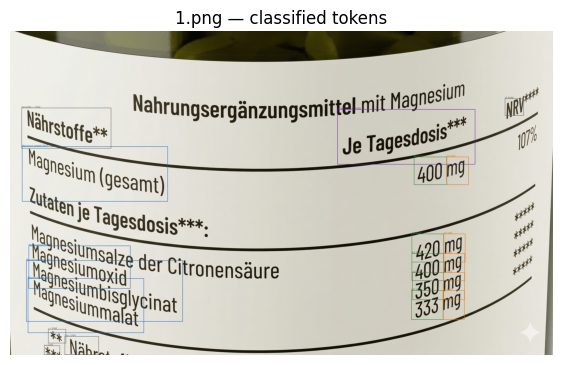

**Predicted tuples** (5) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt,400,mg,per_daily_dose
1,Magnesiumoxid,400,mg,per_daily_dose
2,Magnesiumbisglycinat,333,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Ground-truth tuples** (5) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt),400,mg,per_daily_dose
1,Magnesiumsalze der Citronensäure,420,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Evaluator counts:** TP 4 · FP 1 · FN 1  (precision 0.80, recall 0.80, F1 1.00)

```
Image: 1.png. GT=5, predicted=5, TP=4, FP=1, FN=1. Precision=0.80, recall=0.80, F1=1.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium (gesamt 400 mg [per_daily_dose]; Magnesiumoxid 400 mg [per_daily_dose]; Magnesiumbisglycinat 350 mg [per_daily_dose]  (+1 more)
```

#### Image: `106.png`

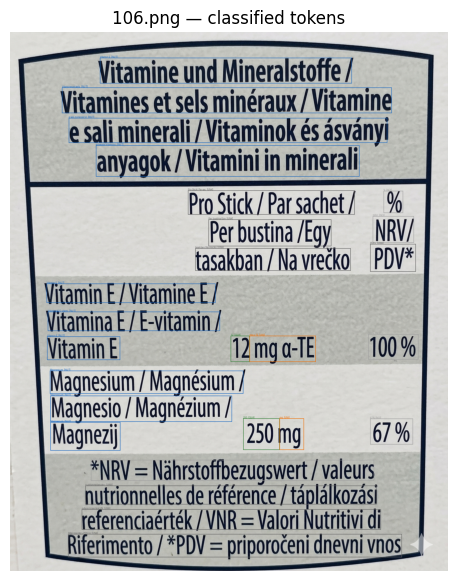

**Predicted tuples** (8) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Vitamin E,NaN,NaN,None
1,Vitamines et sels minéraux/Vitamine,NaN,NaN,None
2,e sali minerali/Vitaminok es asvanyi,NaN,NaN,None
3,anyagok/Vitamini in minerali,12,mg a-te,None
4,VitaminaE/E-vitamin,NaN,NaN,None
5,Vitamin E,12,mg a-te,None
6,Magnesium,NaN,NaN,None
7,Magnesium,250,mg,None


**Ground-truth tuples** (2) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Vitamin E,12,mg α-TE,per_serving (Pro Stick)
1,Magnesium,250,mg,per_serving (Pro Stick)


**Evaluator counts:** TP 0 · FP 8 · FN 2  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 106.png. GT=2, predicted=8, TP=0, FP=8, FN=2. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium 250 mg []; Vitamin E 12 mg a-te []
```

#### Image: `201.jpeg`

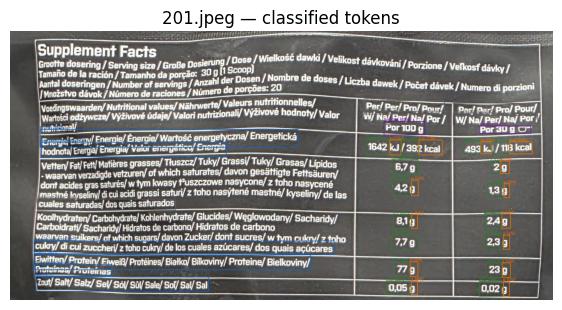

**Predicted tuples** (14) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,1642,kj,per_100g
1,Energy,392,kcal,per_100g
2,Energy,493,kj,por 30go
3,hodnota/Energia/Energia/Valor energetico/Energia,1642,kj,per_100g
4,hodnota/Energia/Energia/Valor energetico/Energia,493,kj,por 30go
5,hodnota/Energia/Energia/Valor energetico/Energia,118,kcal,por 30go
6,cukry/di cui zuccheri/z toho cukry/de los cuales azucares/dos quais acucares,779,g,per_100g
7,cukry/di cui zuccheri/z toho cukry/de los cuales azucares/dos quais acucares,2.3,g,por 30go
8,Protein,77,g,per_100g
9,Protein,23,g,por 30go


**Ground-truth tuples** (16) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1642,kJ,per_100g
1,Energy,392,kcal,per_100g
2,Fat,6.7,g,per_100g
3,Saturated Fats,4.2,g,per_100g
4,Carbohydrate,8.1,g,per_100g
5,Sugars,7.7,g,per_100g
6,Protein,77,g,per_100g
7,Salt,0.05,g,per_100g
8,Energy,493,kJ,per_serving (30 g (1 Scoop))
9,Energy,118,kcal,per_serving (30 g (1 Scoop))


**Evaluator counts:** TP 4 · FP 10 · FN 12  (precision 0.29, recall 0.25, F1 0.57)

```
Image: 201.jpeg. GT=16, predicted=14, TP=4, FP=10, FN=12. Precision=0.29, recall=0.25, F1=0.57. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 1642 kj [per_100g]; Energy 392 kcal [per_100g]; Protein 77 g [per_100g]  (+4 more)
```

#### Image: `41.png`

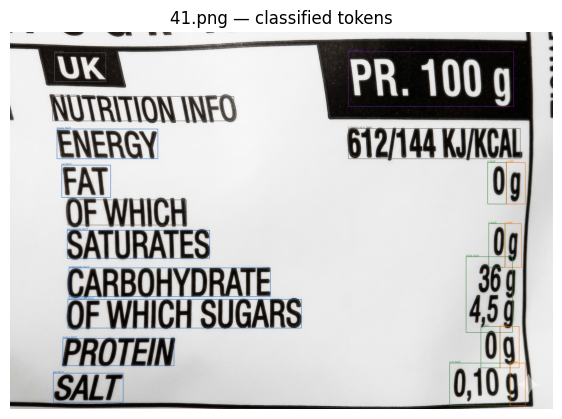

**Predicted tuples** (7) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,0,g,per_100g
1,Fat,0,g,per_100g
2,Saturated Fats,0,g,per_100g
3,Carbohydrate,16156,g,per_100g
4,OFWHICH SUGARS,0.10,g,per_100g
5,Protein,0,g,per_100g
6,Salt,0.10,g,per_100g


**Ground-truth tuples** (8) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,612,kJ,per_100g
1,Energy,144,kcal,per_100g
2,Fat,0,g,per_100g
3,Saturated Fats,0,g,per_100g
4,Carbohydrate,36,g,per_100g
5,Sugars,4.5,g,per_100g
6,Protein,0,g,per_100g
7,Salt,0.10,g,per_100g


**Evaluator counts:** TP 4 · FP 3 · FN 4  (precision 0.57, recall 0.50, F1 0.57)

```
Image: 41.png. GT=8, predicted=7, TP=4, FP=3, FN=4. Precision=0.57, recall=0.50, F1=0.57. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Fat 0 g [per_100g]; Saturated Fats 0 g [per_100g]; Protein 0 g [per_100g]  (+4 more)
```

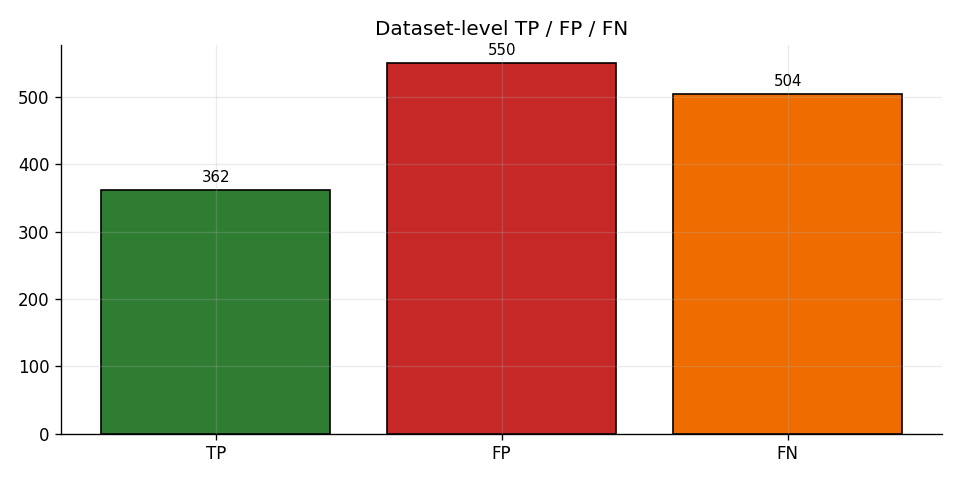

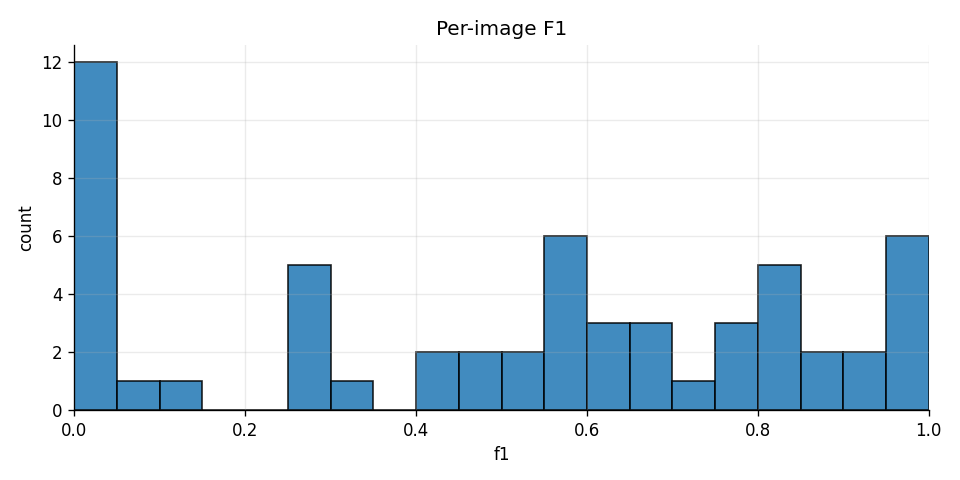

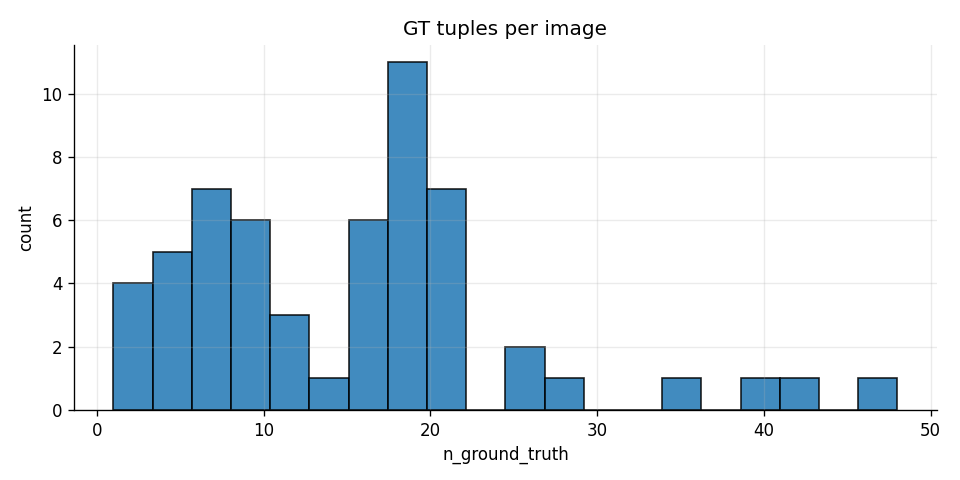

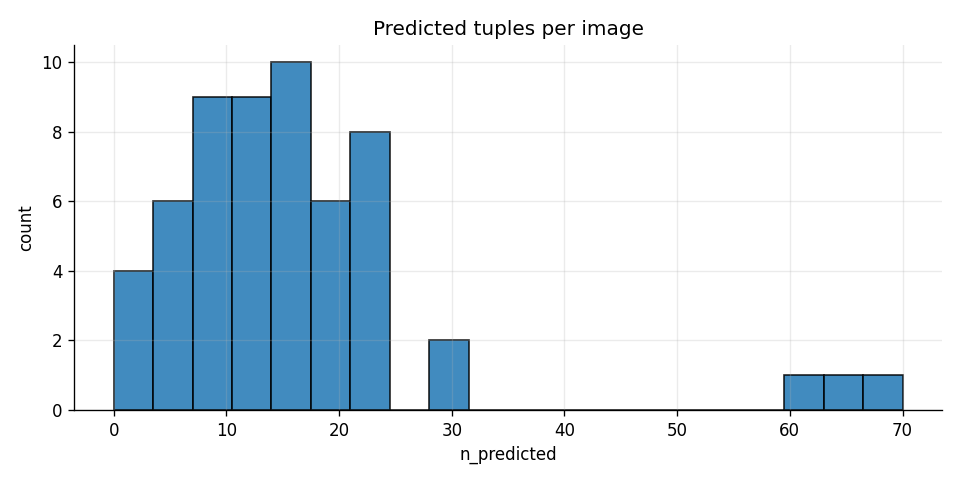

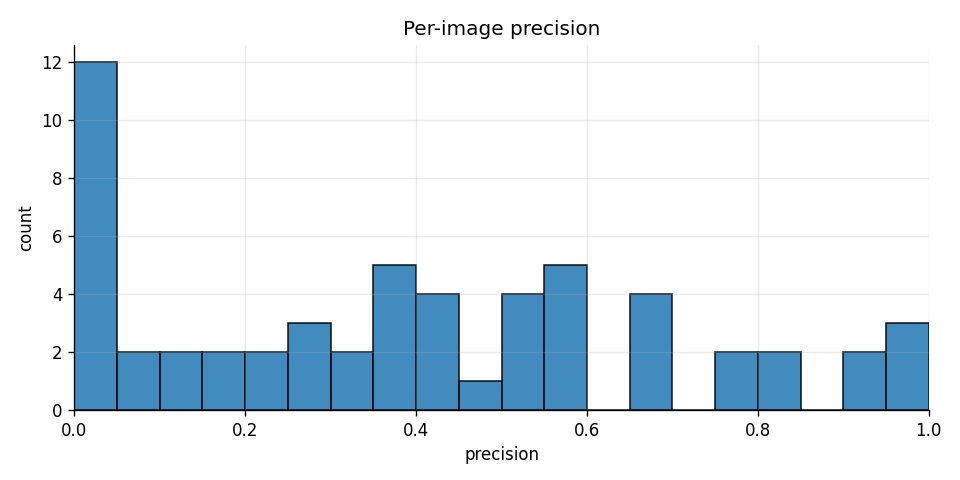

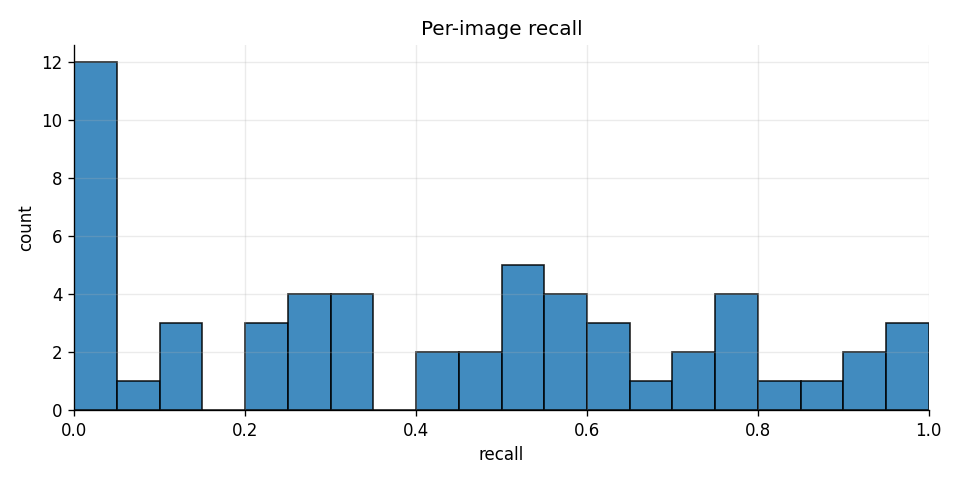

# Dataset-level descriptive report — EXP-04

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 912
- True positives: 362
- False positives: 550
- False negatives: 504
- Dataset-level **precision = 0.3969**, **recall = 0.4180**, **F1 = 0.4072**
- Mean per-image F1: 0.5012
- Median per-image F1: 0.5700
- Standard deviation of per-image F1: 0.3425

## Performance characterisation

The experiment is limited primarily by precision and recall in roughly balanced proportion. The 0.34 standard deviation of per-image F1 indicates highly variable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id  f1  tp  fp  fn
       1.png 1.0   4   1   1
    109.jpeg 1.0   9   3   0
    110.jpeg 1.0   6   0   0
      15.png 1.0   9   0  33
       6.png 1.0   6   0   0

## Worst-performing images

    image_id  f1  tp  fp  fn
     106.png 0.0   0   8   2
    111.jpeg 0.0   0   2   1
    112.jpeg 0.0   0   2   1
    118.jpeg 0.0   0  15  20
    119.jpeg 0.0   0  12  20


In [21]:
exp04_result = run_single_experiment(
    experiment_id   = "EXP-04",
    experiment_name = _phase2_name("A", "G2"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["A"],
    association_key = ablation_config["phase2"]["associations"]["G2"],
    notes           = "rule_based + graph_v2",
)
display_experiment_results(exp04_result)

## EXP-05 — Classifier A (rule-based) + VLM

Set `ablation_config["RUN_VLM_EXPERIMENTS"] = True` and re-run this cell to
enable the VLM call. Otherwise this returns an empty stub.

  EXPERIMENT RESULTS : A_VLM
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 628
  Matched pairs      : 577
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.919
  Nutrient Recall    : 0.666
  Nutrient F1        : 0.772
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 76.6%
  Unit Match Acc     : 89.3%
  Context Match Acc  : 84.9%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 64.5%
  ★ Full Tuple Recall    : 46.8%
  ★ Full Tuple F1        : 54.2%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 57.3%
  ★ Full Tuple Recall    : 41.6%
  ★ Full Tuple F1        : 48.2%
─────────────────────────────────────────────────────────────────
  Cont

### EXP-05 — A_VLM

- OCR: `paddleocr` · Classifier: `rule_based` · Association: `vlm`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,628,360,268,506,0.5732,0.4157,0.4819,0.9188,0.6663,0.7724,0.766,0.8925,0.8492,0.6449,0.4677,0.5422,405,360,577,0.6226,0.4693,0.6533,0.73,0.2877,A_VLM,2026-05-17T07:16:21.379266,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,628,6.0,0,360,0.1,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,5,4,50,100,100,50,50,2,3,3,0.4000,0.4000,0.50
1,101.png,11,10,10,100,100,100,100,100,10,0,1,1.0000,0.9091,1.00
2,102.png,18,16,14,64,100,64,64,43,6,10,12,0.3750,0.3333,0.43
3,103.jpeg,18,9,9,89,100,100,89,89,8,1,10,0.8889,0.4444,0.89
4,104.jpeg,18,11,11,100,100,100,100,100,11,0,7,1.0000,0.6111,1.00
5,105.png,18,10,10,60,100,70,60,60,6,4,12,0.6000,0.3333,0.60
6,106.png,2,2,2,100,100,100,100,100,2,0,0,1.0000,1.0000,1.00
7,107.png,10,10,10,40,50,100,40,40,4,6,6,0.4000,0.4000,0.40
8,108.jpeg,11,11,11,82,100,55,82,55,6,5,5,0.5455,0.5455,0.55
9,109.jpeg,9,8,8,88,100,100,88,88,7,1,2,0.8750,0.7778,0.88


#### Image: `101.png`

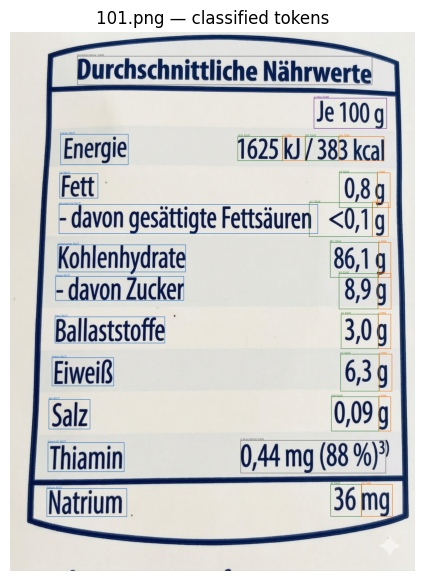

**Predicted tuples** (10) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,1625,kJ,per_100g
1,Fat,0.8,g,per_100g
2,Saturated Fats,<0.1,g,per_100g
3,Carbohydrate,86.1,g,per_100g
4,Sugars,8.9,g,per_100g
5,Fibre,3.0,g,per_100g
6,Protein,6.3,g,per_100g
7,Salt,0.09,g,per_100g
8,Vitamin B1,0.44,mg,per_100g
9,Sodium,36,mg,per_100g


**Ground-truth tuples** (11) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1625,kJ,per_100g
1,Energy,383,kcal,per_100g
2,Fat,0.8,g,per_100g
3,Saturated Fats,< 0.1,g,per_100g
4,Carbohydrate,86.1,g,per_100g
5,Sugars,8.9,g,per_100g
6,Fibre,3.0,g,per_100g
7,Protein,6.3,g,per_100g
8,Salt,0.09,g,per_100g
9,Vitamin B1,0.44,mg,per_100g


**Evaluator counts:** TP 10 · FP 0 · FN 1  (precision 1.00, recall 0.91, F1 1.00)

```
Image: 101.png. GT=11, predicted=10, TP=10, FP=0, FN=1. Precision=1.00, recall=0.91, F1=1.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 1625 kJ [per_100g]; Fat 0.8 g [per_100g]; Saturated Fats <0.1 g [per_100g]  (+7 more)
```

#### Image: `112.jpeg`

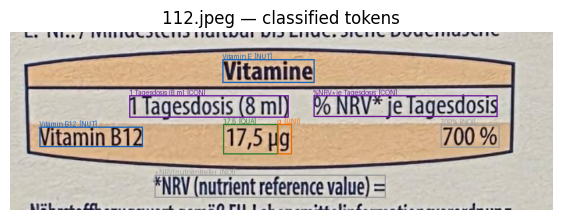

**Predicted tuples** (1) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Vitamin B12,17.5,µg,per_100ml


**Ground-truth tuples** (1) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Vitamin B12,17.5,µg,per_daily_dose (1 Tagesdosis (8 ml))


**Evaluator counts:** TP 0 · FP 1 · FN 1  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 112.jpeg. GT=1, predicted=1, TP=0, FP=1, FN=1. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Vitamin B12 17.5 µg [per_100ml]
```

#### Image: `51.png`

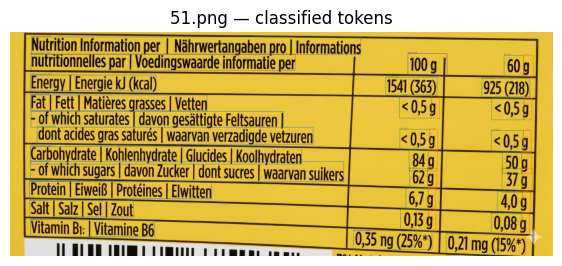

**Predicted tuples** (13) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,1541,363,per_100g
1,Fat,<0.5,g,per_100g
2,Fat,<0.5,g,of which saturates
3,Carbohydrate,84,g,per_100g
4,Protein,6.7,g,per_100g
5,Salt,0.13,g,per_100g
6,Vitamin B1,0.21,mg,per_100g
7,Energy,925,218,per_serving
8,Fat,<0.5,g,per_serving
9,Carbohydrate,50,g,per_serving


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1541,kJ,per_100g
1,Energy,363,kcal,per_100g
2,Fat,< 0.5,g,per_100g
3,Saturated Fats,< 0.5,g,per_100g
4,Carbohydrate,84,g,per_100g
5,Sugars,62,g,per_100g
6,Protein,6.7,g,per_100g
7,Salt,0.13,g,per_100g
8,Vitamin B6,0.35,mg,per_100g
9,Energy,925,kJ,per_serving (60 g)


**Evaluator counts:** TP 8 · FP 5 · FN 10  (precision 0.62, recall 0.44, F1 0.73)

```
Image: 51.png. GT=18, predicted=13, TP=8, FP=5, FN=10. Precision=0.62, recall=0.44, F1=0.73. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Fat <0.5 g [per_100g]; Carbohydrate 84 g [per_100g]; Protein 6.7 g [per_100g]  (+8 more)
```

#### Image: `116.jpeg`

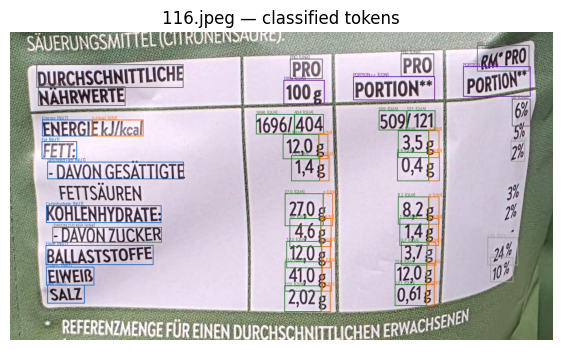

**Predicted tuples** (15) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,1696,kJ/kcal,per_100g
1,Fat,12.0,g,per_100g
2,Saturated Fats,1.4,g,per_100g
3,Carbohydrate,27.0,g,per_100g
4,Sugars,4.6,g,per_100g
5,Fibre,12.0,g,per_100g
6,Salt,2.02,g,per_100g
7,Protein,41.0,g,per_100g
8,Fat,509,121,per_serving
9,Energy,3.5,g,per_serving


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1696,kJ,per_100g
1,Energy,404,kcal,per_100g
2,Fat,12.0,g,per_100g
3,Saturated Fats,1.4,g,per_100g
4,Carbohydrate,27.0,g,per_100g
5,Sugars,4.6,g,per_100g
6,Fibre,12.0,g,per_100g
7,Protein,41.0,g,per_100g
8,Salt,2.02,g,per_100g
9,Energy,509,kJ,per_serving (PORTION**)


**Evaluator counts:** TP 11 · FP 4 · FN 7  (precision 0.73, recall 0.61, F1 0.73)

```
Image: 116.jpeg. GT=18, predicted=15, TP=11, FP=4, FN=7. Precision=0.73, recall=0.61, F1=0.73. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Fat 12.0 g [per_100g]; Saturated Fats 1.4 g [per_100g]; Carbohydrate 27.0 g [per_100g]  (+12 more)
```

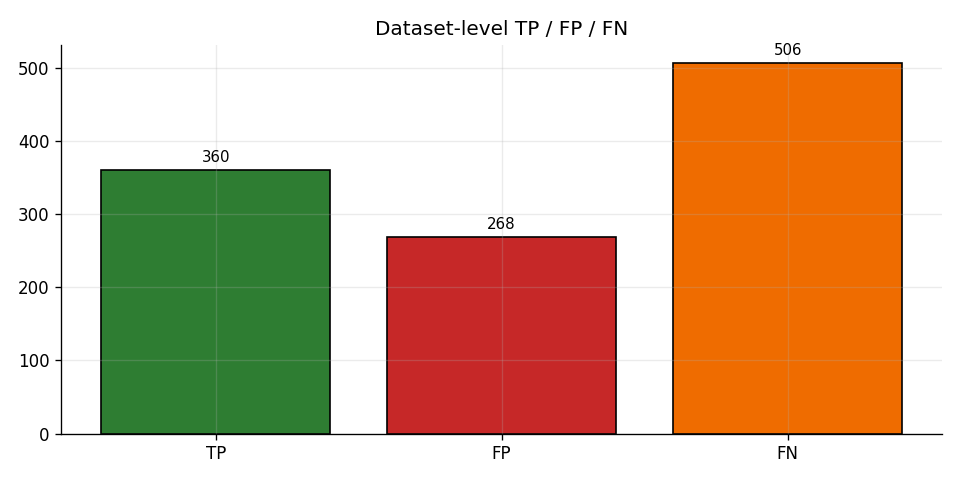

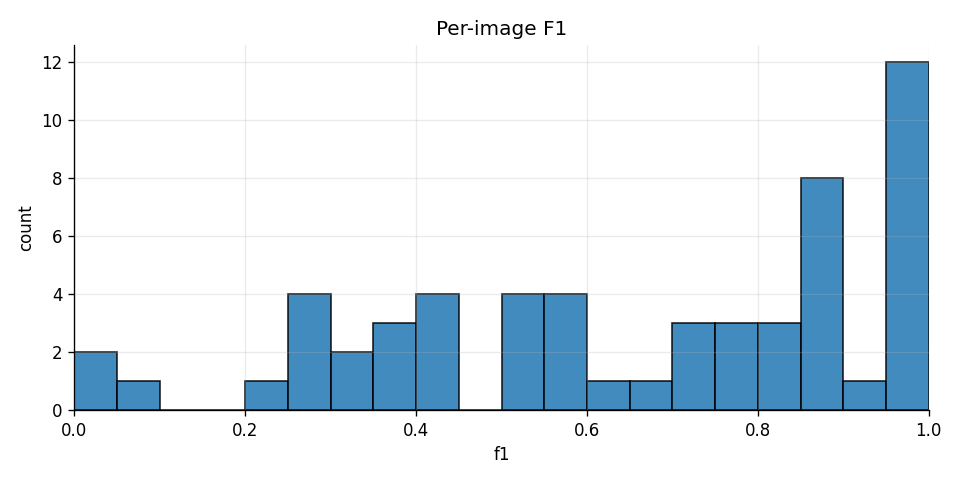

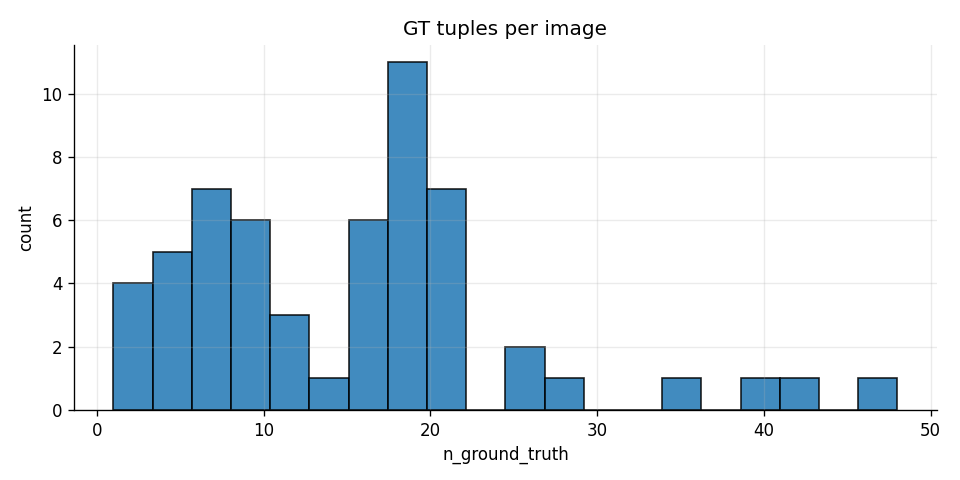

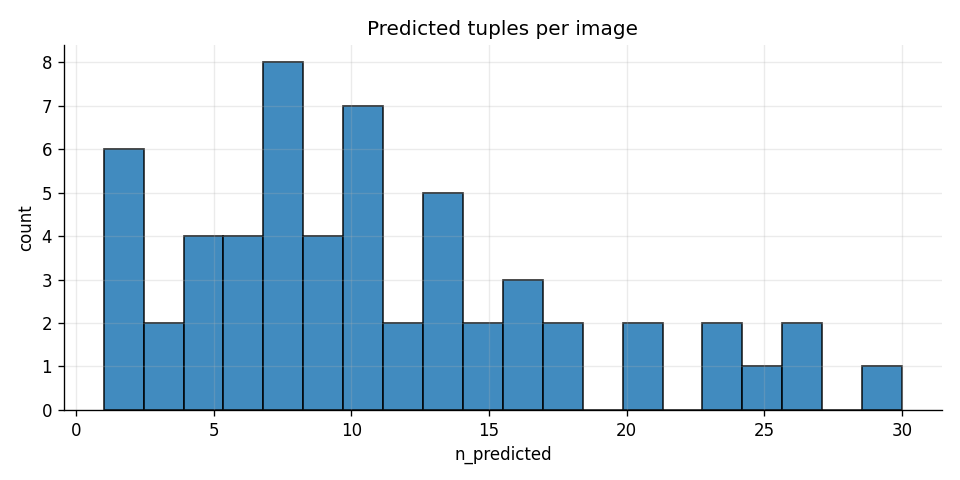

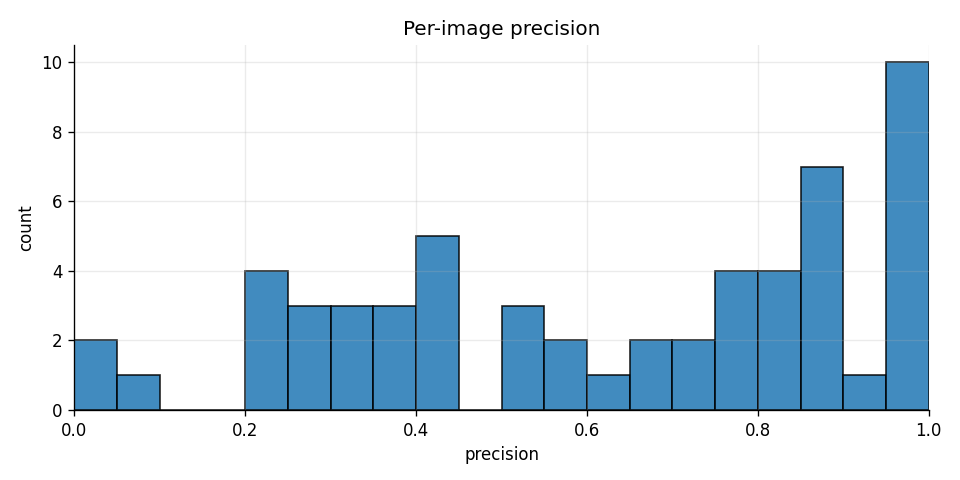

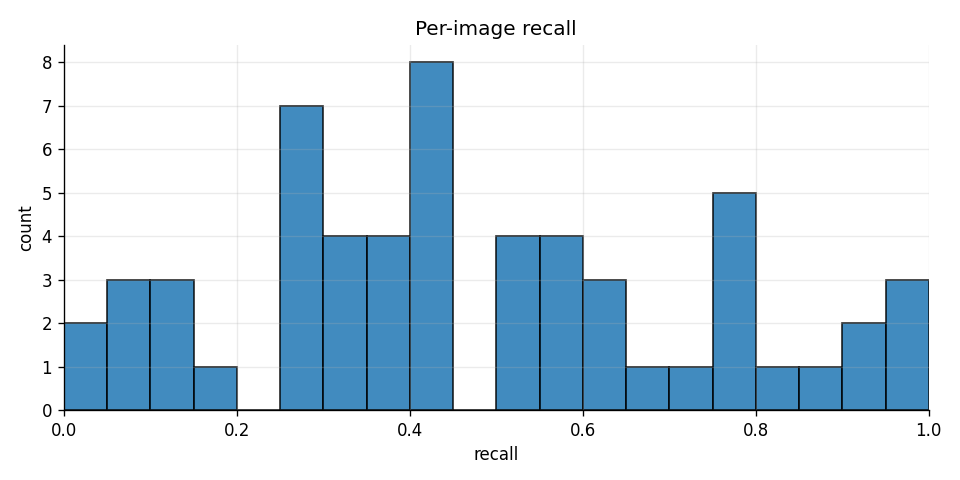

# Dataset-level descriptive report — EXP-05

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 628
- True positives: 360
- False positives: 268
- False negatives: 506
- Dataset-level **precision = 0.5732**, **recall = 0.4157**, **F1 = 0.4819**
- Mean per-image F1: 0.6533
- Median per-image F1: 0.7300
- Standard deviation of per-image F1: 0.2877

## Performance characterisation

The experiment is limited primarily by recall (the system under-predicts). The 0.29 standard deviation of per-image F1 indicates highly variable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id  f1  tp  fp  fn
     101.png 1.0  10   0   1
    104.jpeg 1.0  11   0   7
     106.png 1.0   2   0   0
    110.jpeg 1.0   3   0   3
    111.jpeg 1.0   1   0   0

## Worst-performing images

    image_id   f1  tp  fp  fn
    112.jpeg 0.00   0   1   1
     78.jpeg 0.00   0   2   2
    118.jpeg 0.08   1  16  19
    119.jpeg 0.23   3  11  17
    121.jpeg 0.25   2   7  18


In [41]:
exp05_result = run_single_experiment(
    experiment_id   = "EXP-05",
    experiment_name = _phase2_name("A", "VLM"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["A"],
    association_key = ablation_config["phase2"]["associations"]["VLM"],
    notes           = "rule_based + vlm",
)
display_experiment_results(exp05_result)

## EXP-06 — Classifier B (embedding) + Graph v1

[EmbeddingClassifier] mode=embedding_only | Loading model: BAAI/bge-m3
[EmbeddingClassifier] Ready — 125 prototypes across 5 categories
  EXPERIMENT RESULTS : B_G1
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 949
  Matched pairs      : 600
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.632
  Nutrient Recall    : 0.693
  Nutrient F1        : 0.661
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 69.5%
  Unit Match Acc     : 74.3%
  Context Match Acc  : 61.5%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 32.8%
  ★ Full Tuple Recall    : 35.9%
  ★ Full Tuple F1        : 34.3%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 22.2%
  ★

### EXP-06 — B_G1

- OCR: `paddleocr` · Classifier: `embedding` · Association: `graph_v1`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,949,211,738,655,0.2223,0.2436,0.2325,0.6322,0.6928,0.6612,0.695,0.7433,0.615,0.3277,0.3591,0.3427,311,211,600,0.2469,0.2849,0.3454,0.36,0.2824,B_G1,2026-05-16T12:45:49.213042,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,949,11.0,0,211,0.1,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,7,4,100,100,100,100,100,4,3,1,0.5714,0.8000,1.00
1,101.png,11,12,11,91,82,100,82,82,9,3,2,0.7500,0.8182,0.82
2,102.png,18,22,13,77,85,62,69,54,7,15,11,0.3182,0.3889,0.54
3,103.jpeg,18,31,17,59,82,53,47,35,6,25,12,0.1935,0.3333,0.35
4,104.jpeg,18,28,15,73,67,53,53,40,6,22,12,0.2143,0.3333,0.40
5,105.png,18,18,13,69,85,54,54,46,6,12,12,0.3333,0.3333,0.46
6,106.png,2,7,2,100,50,0,50,0,0,7,2,0.0000,0.0000,0.00
7,107.png,10,16,10,80,50,100,50,50,5,11,5,0.3125,0.5000,0.50
8,108.jpeg,11,18,10,70,70,100,70,70,7,11,4,0.3889,0.6364,0.70
9,109.jpeg,9,12,9,100,89,100,89,89,8,4,1,0.6667,0.8889,0.89


#### Image: `1.png`

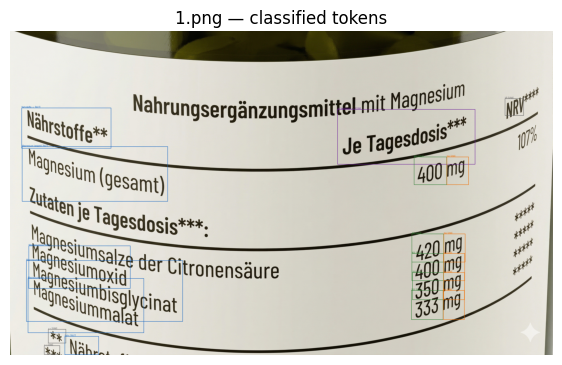

**Predicted tuples** (7) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Nahrstoffe,NaN,NaN,per_daily_dose
1,Magnesium (gesamt,400,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,333,mg,per_daily_dose
4,Magnesiumbisglycinat,350,mg,per_daily_dose
5,Magnesiummalat,333,mg,per_daily_dose
6,Nahr,NaN,NaN,per_daily_dose


**Ground-truth tuples** (5) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt),400,mg,per_daily_dose
1,Magnesiumsalze der Citronensäure,420,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Evaluator counts:** TP 4 · FP 3 · FN 1  (precision 0.57, recall 0.80, F1 1.00)

```
Image: 1.png. GT=5, predicted=7, TP=4, FP=3, FN=1. Precision=0.57, recall=0.80, F1=1.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium (gesamt 400 mg [per_daily_dose]; Magnesiumoxid 400 mg [per_daily_dose]; Magnesiumbisglycinat 350 mg [per_daily_dose]  (+1 more)
```

#### Image: `106.png`

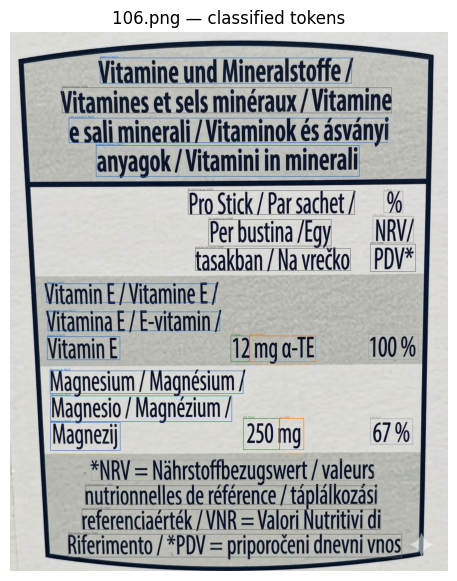

**Predicted tuples** (7) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Vitamin E,NaN,NaN,None
1,e sali minerali/Vitaminok es asvanyi,NaN,NaN,None
2,anyagok/Vitamini in minerali,12,mg a-te,None
3,VitaminaE/E-vitamin,NaN,NaN,None
4,Vitamin E,12,mg a-te,None
5,Magnesium,NaN,NaN,None
6,Magnesium,250,mg,None


**Ground-truth tuples** (2) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Vitamin E,12,mg α-TE,per_serving (Pro Stick)
1,Magnesium,250,mg,per_serving (Pro Stick)


**Evaluator counts:** TP 0 · FP 7 · FN 2  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 106.png. GT=2, predicted=7, TP=0, FP=7, FN=2. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium 250 mg []; Vitamin E 12 mg a-te []
```

#### Image: `12.png`

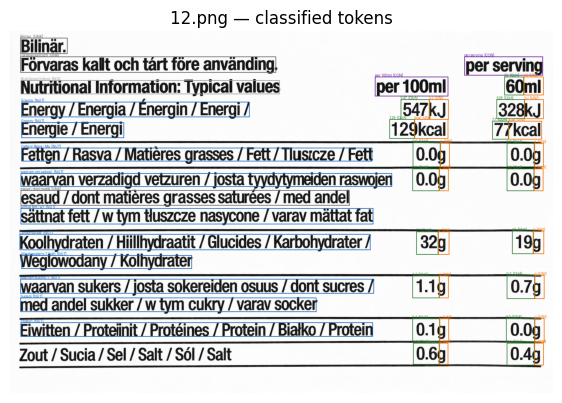

**Predicted tuples** (15) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,547,kj,per_100ml
1,Energy,328,kj,per_100ml
2,Energy,129,kcal,per_100ml
3,Energy,77,kcal,per_100ml
4,Fatten/ Rasva / Matiéres grasses / Fett/ Tlustcze / Fett,0.0,g,per_100ml
5,waarvan verzadigd vetzuren / josta tyydytymeiden raswojen,0.0,g,per_100ml
6,sattnat fett / w tym tluszcze nasycone / varav mattat fat,NaN,NaN,per_100ml
7,Carbohydrate,32,g,per_100ml
8,Carbohydrate,19,g,per_100ml
9,Weglowodany 7 Kolhydrater,NaN,NaN,per_100ml


**Ground-truth tuples** (16) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,547,kJ,per_100ml
1,Energy,129,kcal,per_100ml
2,Fat,0.0,g,per_100ml
3,Saturated Fats,0.0,g,per_100ml
4,Carbohydrate,32,g,per_100ml
5,Sugars,1.1,g,per_100ml
6,Protein,0.1,g,per_100ml
7,Salt,0.6,g,per_100ml
8,Energy,328,kJ,per_serving (60ml)
9,Energy,77,kcal,per_serving (60ml)


**Evaluator counts:** TP 4 · FP 11 · FN 12  (precision 0.27, recall 0.25, F1 0.36)

```
Image: 12.png. GT=16, predicted=15, TP=4, FP=11, FN=12. Precision=0.27, recall=0.25, F1=0.36. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 547 kj [per_100ml]; Energy 129 kcal [per_100ml]; Carbohydrate 32 g [per_100ml]  (+8 more)
```

#### Image: `120.jpeg`

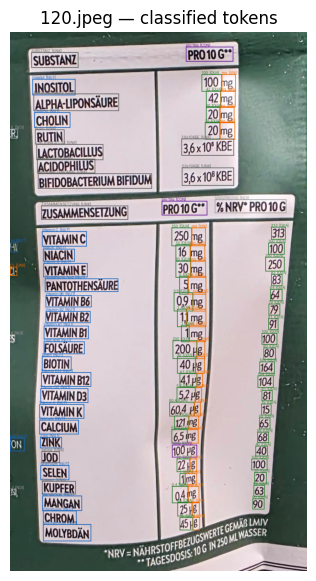

**Predicted tuples** (60) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Inositol,100,mg,per_daily_dose
1,Inositol,42,mg,per_daily_dose
2,Choline,20,mg,per_daily_dose
3,Choline,42,mg,per_daily_dose
4,Vitamin C,250,mg,per_daily_dose
5,Vitamin C,16,mg,per_daily_dose
6,HI,250,mg,per_daily_dose
7,HI,16,mg,per_daily_dose
8,HI,30,mg,per_daily_dose
9,Niacin,250,mg,per_daily_dose


**Ground-truth tuples** (26) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Inositol,100,mg,per_daily_dose (10 G)
1,Alpha-Liponsäure,42,mg,per_daily_dose (10 G)
2,Choline,20,mg,per_daily_dose (10 G)
3,Rutin,20,mg,per_daily_dose (10 G)
4,Lactobacillus Acidophilus,3.6 x 10^8,KBE,per_daily_dose (10 G)
5,Bifidobacterium Bifidum,3.6 x 10^8,KBE,per_daily_dose (10 G)
6,Vitamin C,250,mg,per_daily_dose (10 G)
7,Niacin,16,mg,per_daily_dose (10 G)
8,Vitamin E,30,mg,per_daily_dose (10 G)
9,Pantothenic Acid,5,mg,per_daily_dose (10 G)


**Evaluator counts:** TP 8 · FP 52 · FN 18  (precision 0.13, recall 0.31, F1 0.36)

```
Image: 120.jpeg. GT=26, predicted=60, TP=8, FP=52, FN=18. Precision=0.13, recall=0.31, F1=0.36. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Inositol 100 mg [per_daily_dose]; Choline 20 mg [per_daily_dose]; Vitamin C 250 mg [per_daily_dose]  (+19 more)
```

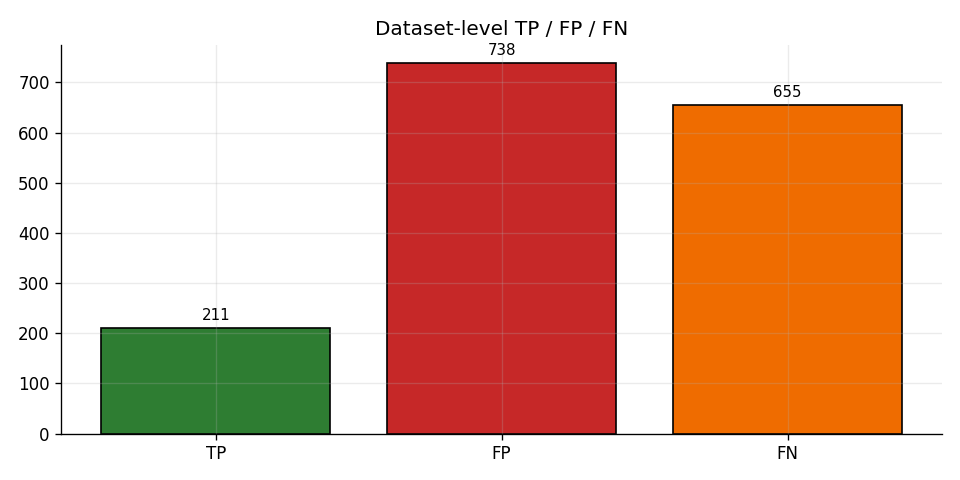

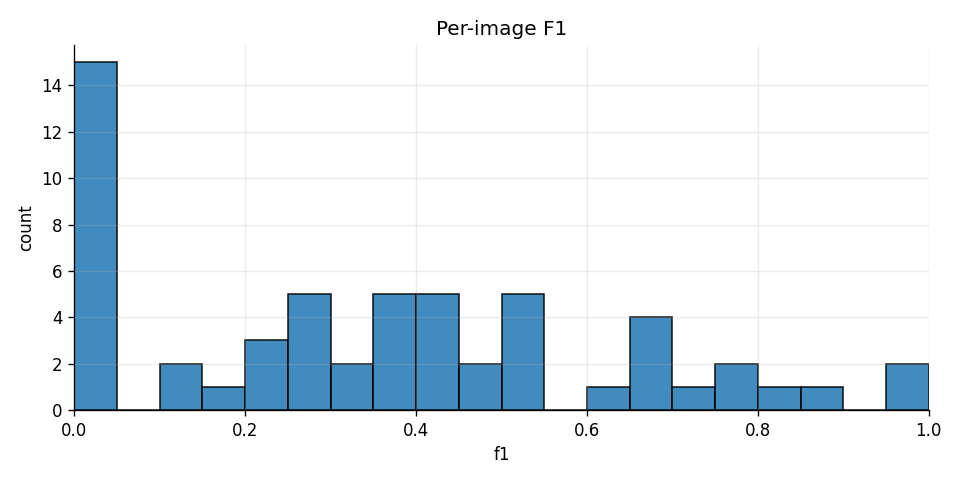

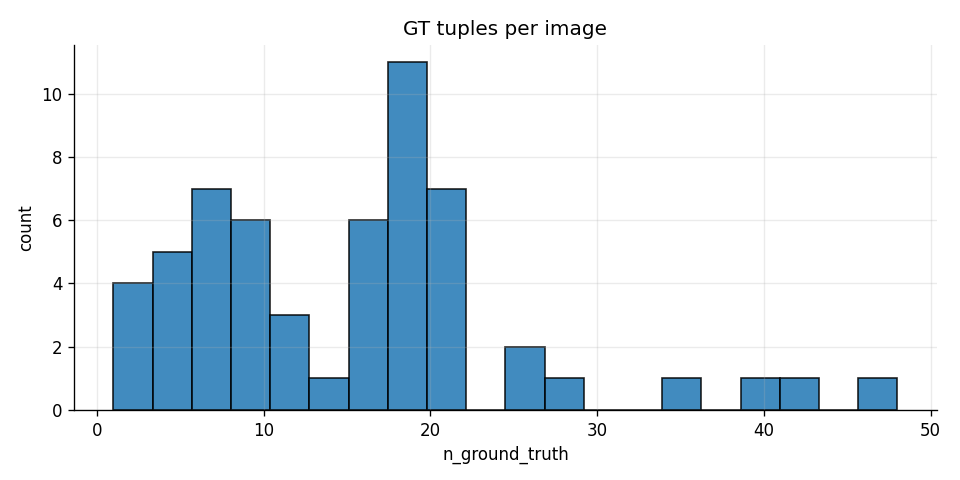

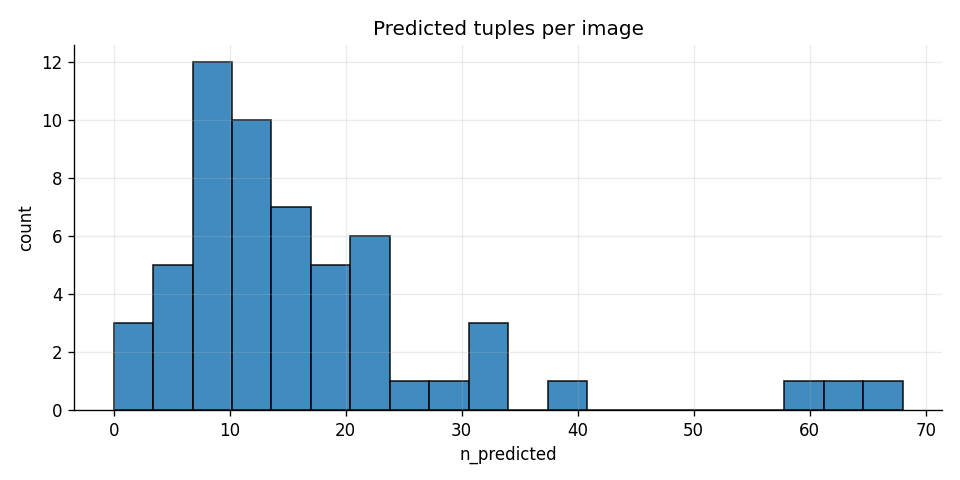

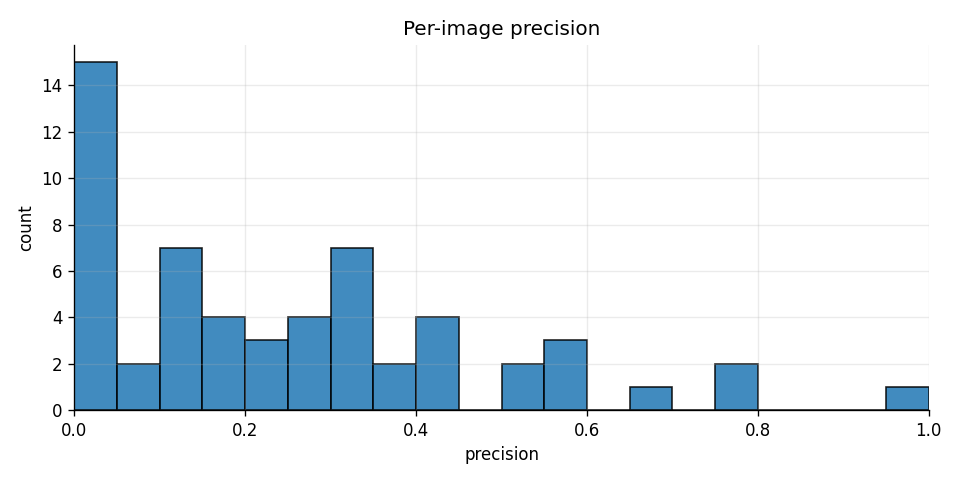

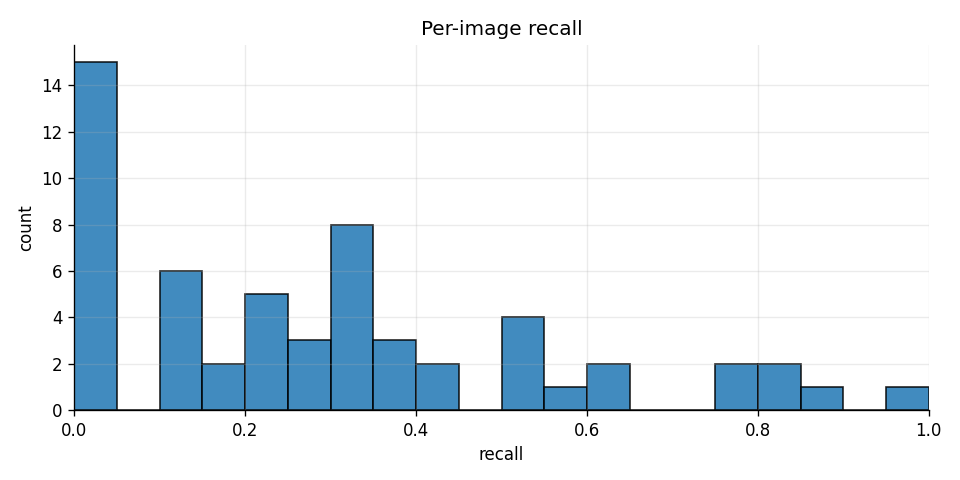

# Dataset-level descriptive report — EXP-06

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 949
- True positives: 211
- False positives: 738
- False negatives: 655
- Dataset-level **precision = 0.2223**, **recall = 0.2436**, **F1 = 0.2325**
- Mean per-image F1: 0.3454
- Median per-image F1: 0.3600
- Standard deviation of per-image F1: 0.2824

## Performance characterisation

The experiment is limited primarily by precision and recall in roughly balanced proportion. The 0.28 standard deviation of per-image F1 indicates highly variable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id   f1  tp  fp  fn
       1.png 1.00   4   3   1
       6.png 1.00   6   0   0
    109.jpeg 0.89   8   4   1
     101.png 0.82   9   3   2
      17.png 0.75   3   4   1

## Worst-performing images

    image_id  f1  tp  fp  fn
     106.png 0.0   0   7   2
    111.jpeg 0.0   0   2   1
    112.jpeg 0.0   0   2   1
    113.jpeg 0.0   0  22  20
    118.jpeg 0.0   0  11  20


In [36]:
exp06_result = run_single_experiment(
    experiment_id   = "EXP-06",
    experiment_name = _phase2_name("B", "G1"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["B"],
    association_key = ablation_config["phase2"]["associations"]["G1"],
    notes           = "embedding + graph_v1",
)
display_experiment_results(exp06_result)

## EXP-07 — Classifier B (embedding) + Graph v2

[EmbeddingClassifier] mode=embedding_only | Loading model: BAAI/bge-m3
[EmbeddingClassifier] Ready — 125 prototypes across 5 categories
  EXPERIMENT RESULTS : B_G2
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 961
  Matched pairs      : 608
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.633
  Nutrient Recall    : 0.702
  Nutrient F1        : 0.666
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 76.3%
  Unit Match Acc     : 82.4%
  Context Match Acc  : 85.0%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 38.8%
  ★ Full Tuple Recall    : 43.1%
  ★ Full Tuple F1        : 40.8%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 36.7%
  ★

### EXP-07 — B_G2

- OCR: `paddleocr` · Classifier: `embedding` · Association: `graph_v2`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,961,353,608,513,0.3673,0.4076,0.3864,0.6327,0.7021,0.6656,0.7632,0.824,0.8503,0.3881,0.4307,0.4083,373,353,608,0.3715,0.4017,0.513,0.59,0.3507,B_G2,2026-05-16T08:54:24.182348,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,961,2.2,0,353,0.1,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,7,4,100,100,100,100,100,4,3,1,0.5714,0.8000,1.00
1,101.png,11,12,11,91,91,100,91,91,10,2,1,0.8333,0.9091,0.91
2,102.png,18,22,13,77,92,62,77,62,8,14,10,0.3636,0.4444,0.62
3,103.jpeg,18,31,17,76,82,88,65,59,10,21,8,0.3226,0.5556,0.59
4,104.jpeg,18,28,15,80,80,87,73,73,11,17,7,0.3929,0.6111,0.73
5,105.png,18,18,13,69,100,54,69,46,6,12,12,0.3333,0.3333,0.46
6,106.png,2,7,2,100,50,0,50,0,0,7,2,0.0000,0.0000,0.00
7,107.png,10,16,10,80,50,100,50,50,5,11,5,0.3125,0.5000,0.50
8,108.jpeg,11,18,10,70,70,100,70,70,7,11,4,0.3889,0.6364,0.70
9,109.jpeg,9,12,9,100,100,100,100,100,9,3,0,0.7500,1.0000,1.00


#### Image: `1.png`

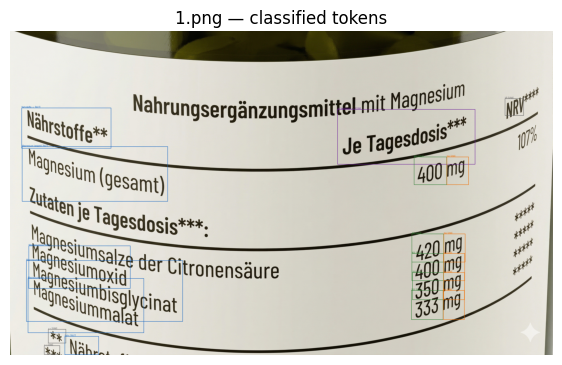

**Predicted tuples** (7) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Nahrstoffe,400,mg,per_daily_dose
1,Magnesium (gesamt,400,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,333,mg,per_daily_dose
4,Magnesiumbisglycinat,350,mg,per_daily_dose
5,Magnesiummalat,333,mg,per_daily_dose
6,Nahr,NaN,NaN,per_daily_dose


**Ground-truth tuples** (5) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt),400,mg,per_daily_dose
1,Magnesiumsalze der Citronensäure,420,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Evaluator counts:** TP 4 · FP 3 · FN 1  (precision 0.57, recall 0.80, F1 1.00)

```
Image: 1.png. GT=5, predicted=7, TP=4, FP=3, FN=1. Precision=0.57, recall=0.80, F1=1.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium (gesamt 400 mg [per_daily_dose]; Magnesiumoxid 400 mg [per_daily_dose]; Magnesiumbisglycinat 350 mg [per_daily_dose]  (+1 more)
```

#### Image: `106.png`

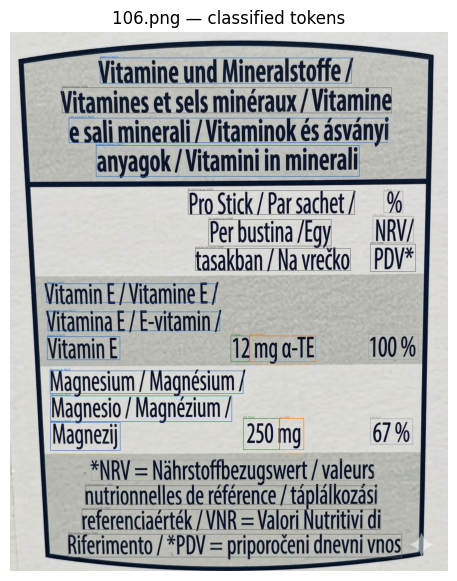

**Predicted tuples** (7) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Vitamin E,NaN,NaN,None
1,e sali minerali/Vitaminok es asvanyi,NaN,NaN,None
2,anyagok/Vitamini in minerali,12,mg a-te,None
3,VitaminaE/E-vitamin,NaN,NaN,None
4,Vitamin E,12,mg a-te,None
5,Magnesium,NaN,NaN,None
6,Magnesium,250,mg,None


**Ground-truth tuples** (2) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Vitamin E,12,mg α-TE,per_serving (Pro Stick)
1,Magnesium,250,mg,per_serving (Pro Stick)


**Evaluator counts:** TP 0 · FP 7 · FN 2  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 106.png. GT=2, predicted=7, TP=0, FP=7, FN=2. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesium 250 mg []; Vitamin E 12 mg a-te []
```

#### Image: `103.jpeg`

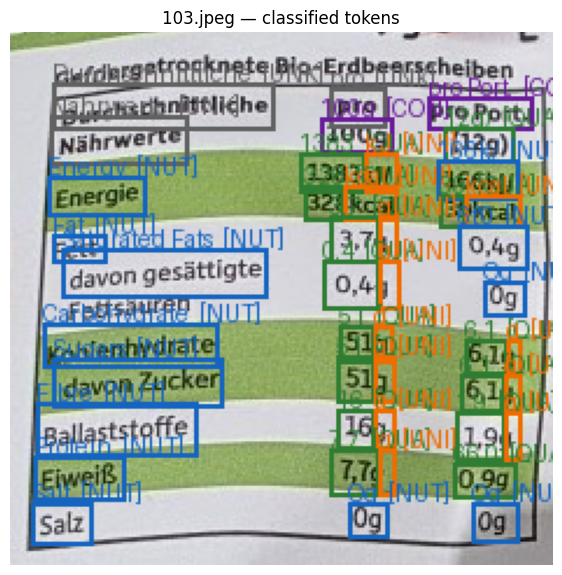

**Predicted tuples** (31) — from `tuples.csv`

,nutrient,quantity,unit,context
0,166k,328,kcal,per_100g
1,166k,1383,kcal,per_100g
2,166k,39,kcal,per_serving
3,Energy,328,kcal,per_100g
4,Energy,1383,kcal,per_100g
5,Energy,39,kcal,per_serving
6,6t'0,0.4,g,per_100g
7,6t'0,3.7,kcal,per_100g
8,6t'0,39,kcal,per_serving
9,Fat,0.4,g,per_100g


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1383,kJ,per_100g
1,Energy,328,kcal,per_100g
2,Fat,3.7,g,per_100g
3,Saturated Fats,0.4,g,per_100g
4,Carbohydrate,51,g,per_100g
5,Sugars,51,g,per_100g
6,Fibre,16,g,per_100g
7,Protein,7.7,g,per_100g
8,Salt,0,g,per_100g
9,Energy,166,kJ,per_serving (pro Port. (12g))


**Evaluator counts:** TP 10 · FP 21 · FN 8  (precision 0.32, recall 0.56, F1 0.59)

```
Image: 103.jpeg. GT=18, predicted=31, TP=10, FP=21, FN=8. Precision=0.32, recall=0.56, F1=0.59. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 328 kcal [per_100g]; Saturated Fats 0.4 g [per_100g]; Carbohydrate 51 g [per_100g]  (+14 more)
```

#### Image: `45_1.png`

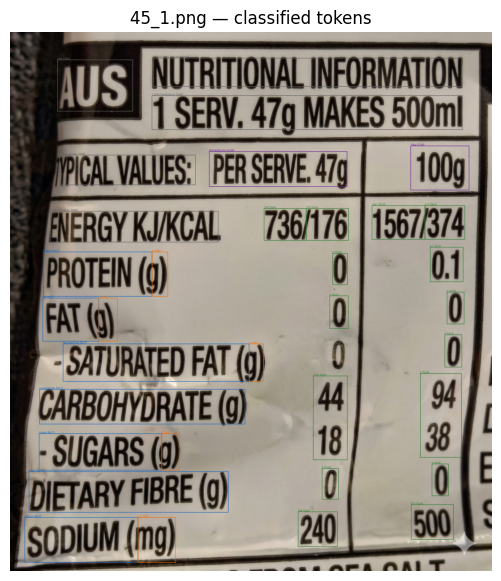

**Predicted tuples** (10) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Protein,0,g,per_serving
1,Protein,0.1,g,per_100g
2,Fat,0,g,per_serving
3,Saturated Fats,0,g,per_100g
4,Carbohydrate,1410,g,per_serving
5,Carbohydrate,8,NaN,per_100g
6,Sugars,0.1,g,per_100g
7,Fibre,0,NaN,per_serving
8,Sodium,240,mg,per_serving
9,Sodium,500,mg,per_100g


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,736,kJ,per_serving (1 SERV. 47g)
1,Energy,176,kcal,per_serving (1 SERV. 47g)
2,Protein,0,g,per_serving (1 SERV. 47g)
3,Fat,0,g,per_serving (1 SERV. 47g)
4,Saturated Fats,0,g,per_serving (1 SERV. 47g)
5,Carbohydrate,44,g,per_serving (1 SERV. 47g)
6,Sugars,18,g,per_serving (1 SERV. 47g)
7,Fibre,0,g,per_serving (1 SERV. 47g)
8,Sodium,240,mg,per_serving (1 SERV. 47g)
9,Energy,1567,kJ,per_100g


**Evaluator counts:** TP 6 · FP 4 · FN 12  (precision 0.60, recall 0.33, F1 0.60)

```
Image: 45_1.png. GT=18, predicted=10, TP=6, FP=4, FN=12. Precision=0.60, recall=0.33, F1=0.60. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Protein 0 g [per_serving]; Fat 0 g [per_serving]; Sodium 240 mg [per_serving]  (+7 more)
```

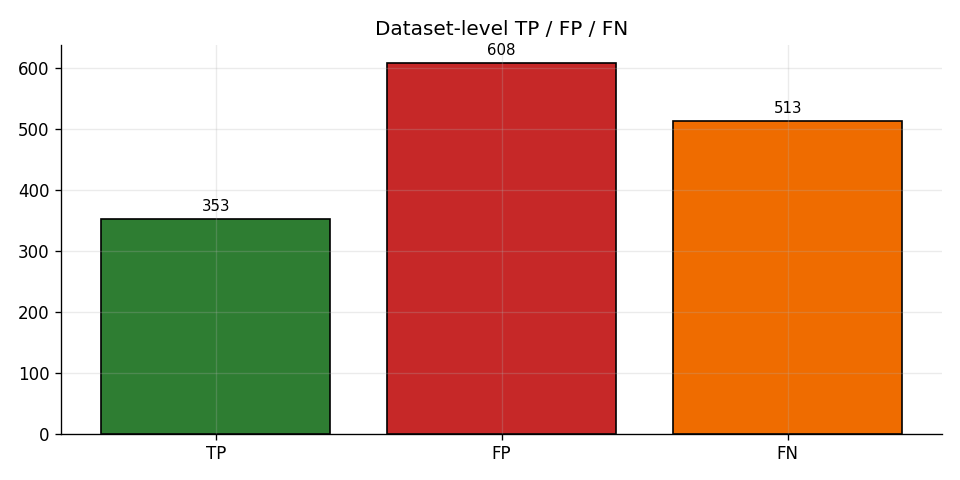

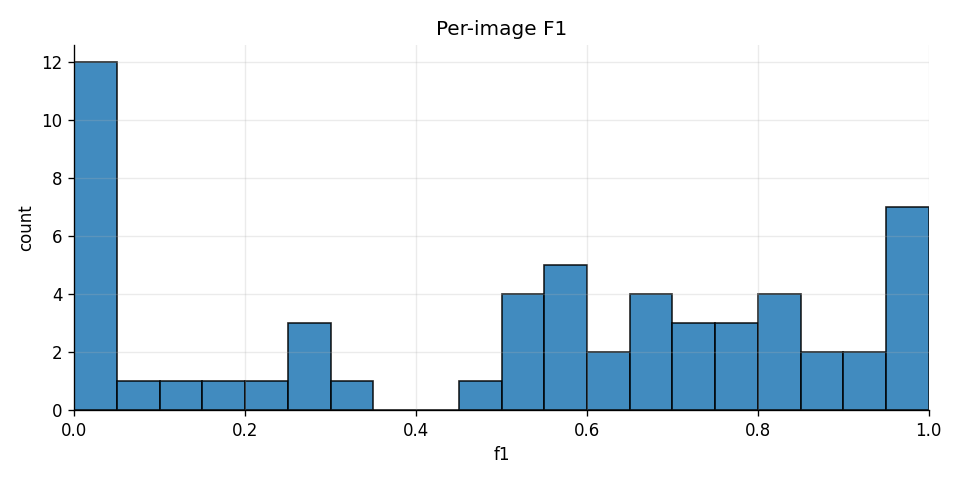

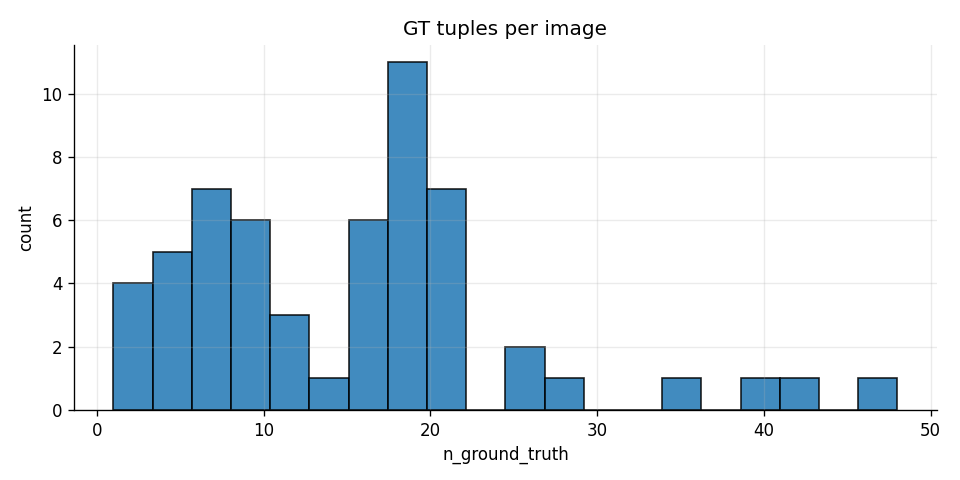

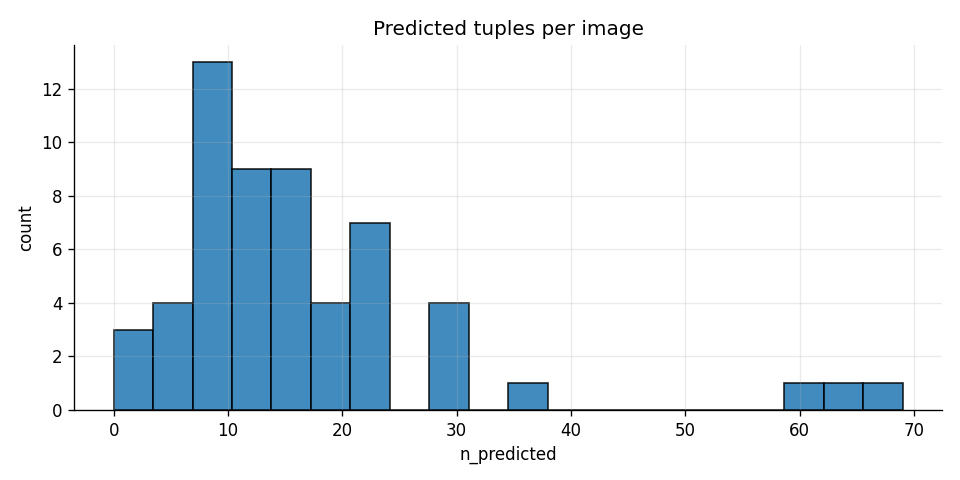

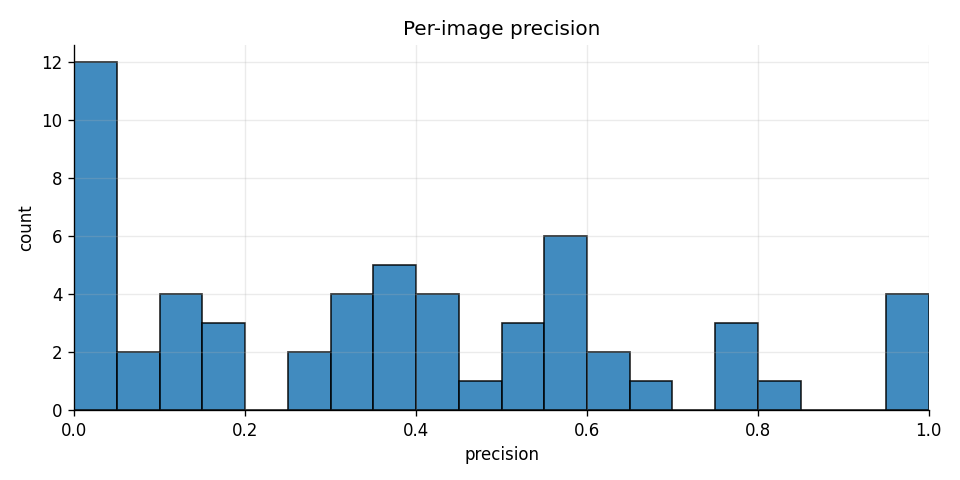

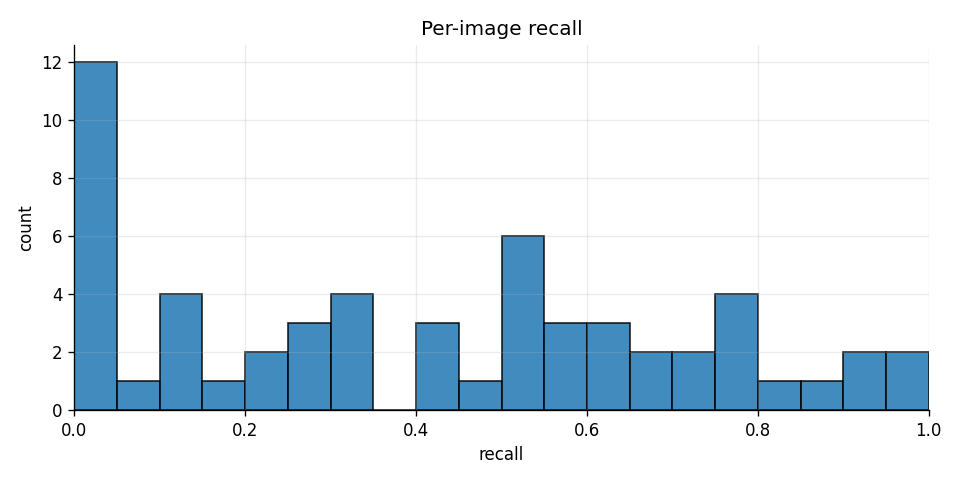

# Dataset-level descriptive report — EXP-07

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 961
- True positives: 353
- False positives: 608
- False negatives: 513
- Dataset-level **precision = 0.3673**, **recall = 0.4076**, **F1 = 0.3864**
- Mean per-image F1: 0.5130
- Median per-image F1: 0.5900
- Standard deviation of per-image F1: 0.3507

## Performance characterisation

The experiment is limited primarily by precision and recall in roughly balanced proportion. The 0.35 standard deviation of per-image F1 indicates highly variable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id  f1  tp  fp  fn
       1.png 1.0   4   3   1
    109.jpeg 1.0   9   3   0
    110.jpeg 1.0   4   0   2
    116.jpeg 1.0  12   0   6
      15.png 1.0   9   0  33

## Worst-performing images

    image_id  f1  tp  fp  fn
     106.png 0.0   0   7   2
    111.jpeg 0.0   0   2   1
    112.jpeg 0.0   0   2   1
    118.jpeg 0.0   0  12  20
    119.jpeg 0.0   0  12  20


In [23]:
exp07_result = run_single_experiment(
    experiment_id   = "EXP-07",
    experiment_name = _phase2_name("B", "G2"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["B"],
    association_key = ablation_config["phase2"]["associations"]["G2"],
    notes           = "embedding + graph_v2",
)
display_experiment_results(exp07_result)

## EXP-08 — Classifier B (embedding) + VLM

[EmbeddingClassifier] mode=embedding_only | Loading model: BAAI/bge-m3
[EmbeddingClassifier] Ready — 125 prototypes across 5 categories
  EXPERIMENT RESULTS : B_VLM
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 610
  Matched pairs      : 550
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.902
  Nutrient Recall    : 0.635
  Nutrient F1        : 0.745
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 77.3%
  Unit Match Acc     : 90.0%
  Context Match Acc  : 85.5%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 64.3%
  ★ Full Tuple Recall    : 45.3%
  ★ Full Tuple F1        : 53.1%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 58.2%
  

### EXP-08 — B_VLM

- OCR: `paddleocr` · Classifier: `embedding` · Association: `vlm`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,610,355,255,511,0.582,0.4099,0.481,0.9016,0.6351,0.7453,0.7727,0.9,0.8545,0.6426,0.4527,0.5312,392,355,550,0.6267,0.485,0.6689,0.75,0.2943,B_VLM,2026-05-16T09:07:38.270010,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,610,5.0,0,355,0.0,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,5,4,50,100,100,50,50,2,3,3,0.4000,0.4000,0.50
1,101.png,11,10,10,90,90,100,90,90,9,1,2,0.9000,0.8182,0.90
2,102.png,18,16,14,64,100,64,64,43,6,10,12,0.3750,0.3333,0.43
3,103.jpeg,18,10,10,90,100,90,90,80,8,2,10,0.8000,0.4444,0.80
4,104.jpeg,18,12,12,100,100,100,100,100,12,0,6,1.0000,0.6667,1.00
5,105.png,18,9,8,75,100,75,75,75,6,3,12,0.6667,0.3333,0.75
6,106.png,2,2,2,100,50,100,50,50,1,1,1,0.5000,0.5000,0.50
7,107.png,10,10,10,40,50,100,40,40,4,6,6,0.4000,0.4000,0.40
8,108.jpeg,11,10,10,100,100,90,100,90,9,1,2,0.9000,0.8182,0.90
9,109.jpeg,9,8,8,88,100,100,88,88,7,1,2,0.8750,0.7778,0.88


#### Image: `104.jpeg`

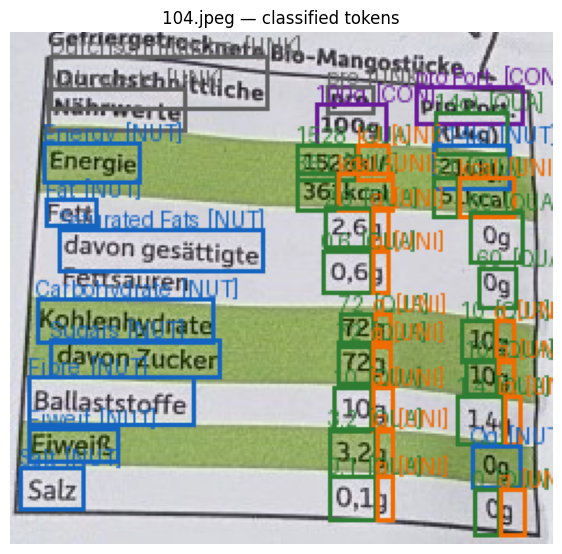

**Predicted tuples** (12) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,1528,kJ,per_100g
1,Fat,2.6,g,per_100g
2,Saturated Fats,0.6,g,per_100g
3,Carbohydrate,72,g,per_100g
4,Sugars,72,g,per_100g
5,Fibre,10,g,per_100g
6,Protein,3.2,g,per_100g
7,Salt,0.1,g,per_100g
8,Energy,214,kJ,per_serving
9,Fat,0,g,per_serving


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1528,kJ,per_100g
1,Energy,361,kcal,per_100g
2,Fat,2.6,g,per_100g
3,Saturated Fats,0.6,g,per_100g
4,Carbohydrate,72,g,per_100g
5,Sugars,72,g,per_100g
6,Fibre,10,g,per_100g
7,Protein,3.2,g,per_100g
8,Salt,0.1,g,per_100g
9,Energy,214,kJ,per_serving (pro Port. (14g))


**Evaluator counts:** TP 12 · FP 0 · FN 6  (precision 1.00, recall 0.67, F1 1.00)

```
Image: 104.jpeg. GT=18, predicted=12, TP=12, FP=0, FN=6. Precision=1.00, recall=0.67, F1=1.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 1528 kJ [per_100g]; Fat 2.6 g [per_100g]; Saturated Fats 0.6 g [per_100g]  (+9 more)
```

#### Image: `30.png`

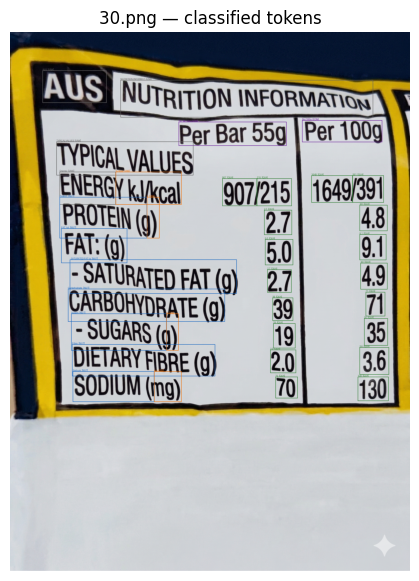

**Predicted tuples** (8) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,907,215,per_serving
1,Protein,2.7,4.8,per_serving
2,Fat,5.0,9.1,per_serving
3,Saturated Fats,2.7,4.9,per_serving
4,Carbohydrate,39,35,per_serving
5,Sugars,19,35,per_serving
6,Fibre,2.0,3.6,per_serving
7,Sodium,70,130,per_serving


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,907,kJ,per_serving (Per Bar 55g)
1,Energy,215,kcal,per_serving (Per Bar 55g)
2,Protein,2.7,g,per_serving (Per Bar 55g)
3,Fat,5.0,g,per_serving (Per Bar 55g)
4,Saturated Fats,2.7,g,per_serving (Per Bar 55g)
5,Carbohydrate,39,g,per_serving (Per Bar 55g)
6,Sugars,19,g,per_serving (Per Bar 55g)
7,Fibre,2.0,g,per_serving (Per Bar 55g)
8,Sodium,70,mg,per_serving (Per Bar 55g)
9,Energy,1649,kJ,per_100g


**Evaluator counts:** TP 0 · FP 8 · FN 18  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 30.png. GT=18, predicted=8, TP=0, FP=8, FN=18. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 907 215 [per_serving]; Protein 2.7 4.8 [per_serving]; Fat 5.0 9.1 [per_serving]  (+5 more)
```

#### Image: `45_1.png`

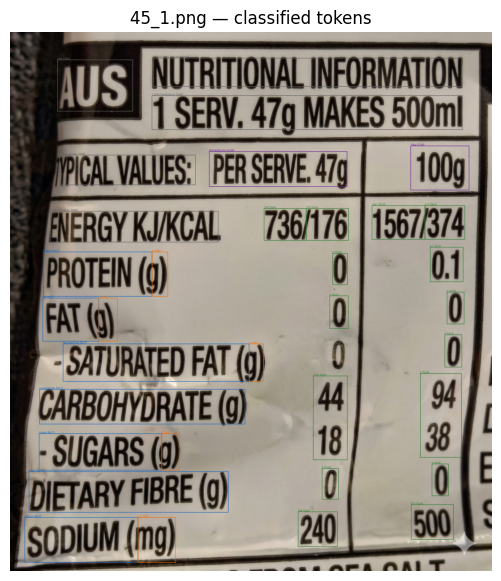

**Predicted tuples** (8) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Protein,0,g,per_serving
1,Fat,0,g,per_serving
2,Saturated Fats,0,g,per_serving
3,Carbohydrate,44,g,per_100g
4,Sugars,18,g,per_100g
5,Fibre,0,g,per_100g
6,Sodium,240,mg,per_serving
7,Protein,0.1,g,per_100g


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,736,kJ,per_serving (1 SERV. 47g)
1,Energy,176,kcal,per_serving (1 SERV. 47g)
2,Protein,0,g,per_serving (1 SERV. 47g)
3,Fat,0,g,per_serving (1 SERV. 47g)
4,Saturated Fats,0,g,per_serving (1 SERV. 47g)
5,Carbohydrate,44,g,per_serving (1 SERV. 47g)
6,Sugars,18,g,per_serving (1 SERV. 47g)
7,Fibre,0,g,per_serving (1 SERV. 47g)
8,Sodium,240,mg,per_serving (1 SERV. 47g)
9,Energy,1567,kJ,per_100g


**Evaluator counts:** TP 6 · FP 2 · FN 12  (precision 0.75, recall 0.33, F1 0.75)

```
Image: 45_1.png. GT=18, predicted=8, TP=6, FP=2, FN=12. Precision=0.75, recall=0.33, F1=0.75. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Protein 0 g [per_serving]; Fat 0 g [per_serving]; Saturated Fats 0 g [per_serving]  (+5 more)
```

#### Image: `105.png`

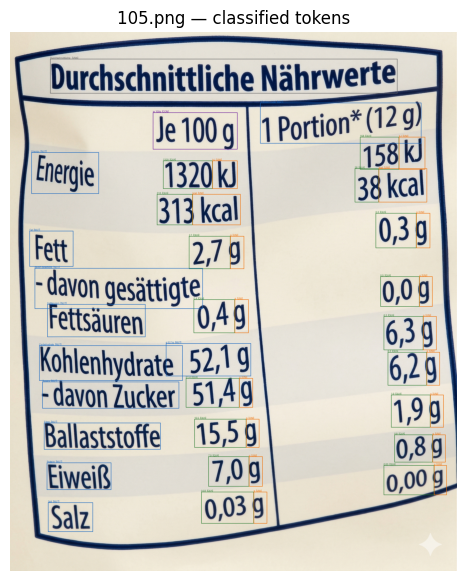

**Predicted tuples** (9) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Energy,1320,kJ,per_100g
1,Energy,158,kJ,per_serving
2,Fat,2.7,g,per_100g
3,Fat,0.4,g,davon gesättigte
4,Carbohydrate,52.1,g,per_100g
5,Carbohydrate,51.4,g,davon Zucker
6,Fibre,15.5,g,per_100g
7,Milk Solids,7.0,g,per_100g
8,Salt,0.03,g,per_100g


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,1320,kJ,per_100g
1,Energy,313,kcal,per_100g
2,Fat,2.7,g,per_100g
3,Saturated Fats,0.4,g,per_100g
4,Carbohydrate,52.1,g,per_100g
5,Sugars,51.4,g,per_100g
6,Fibre,15.5,g,per_100g
7,Protein,7.0,g,per_100g
8,Salt,0.03,g,per_100g
9,Energy,158,kJ,per_serving (1 Portion* (12 g))


**Evaluator counts:** TP 6 · FP 3 · FN 12  (precision 0.67, recall 0.33, F1 0.75)

```
Image: 105.png. GT=18, predicted=9, TP=6, FP=3, FN=12. Precision=0.67, recall=0.33, F1=0.75. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Energy 1320 kJ [per_100g]; Fat 2.7 g [per_100g]; Carbohydrate 52.1 g [per_100g]  (+5 more)
```

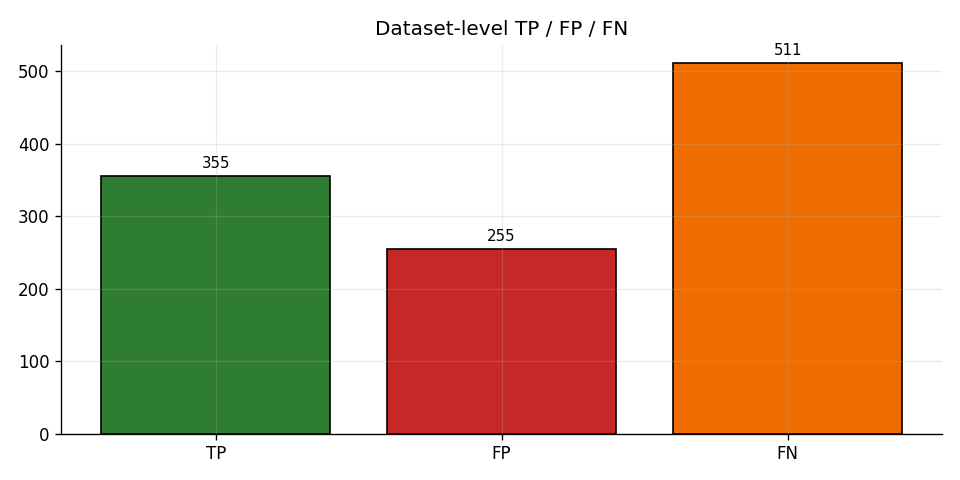

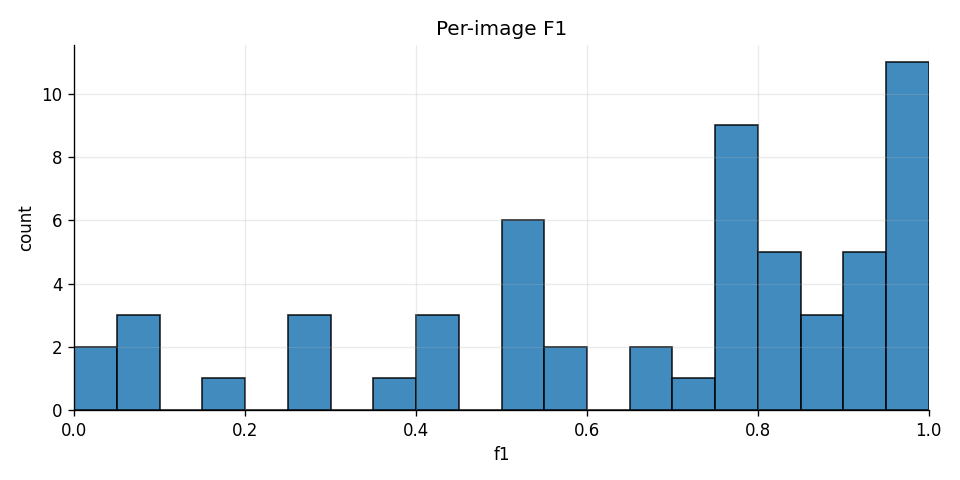

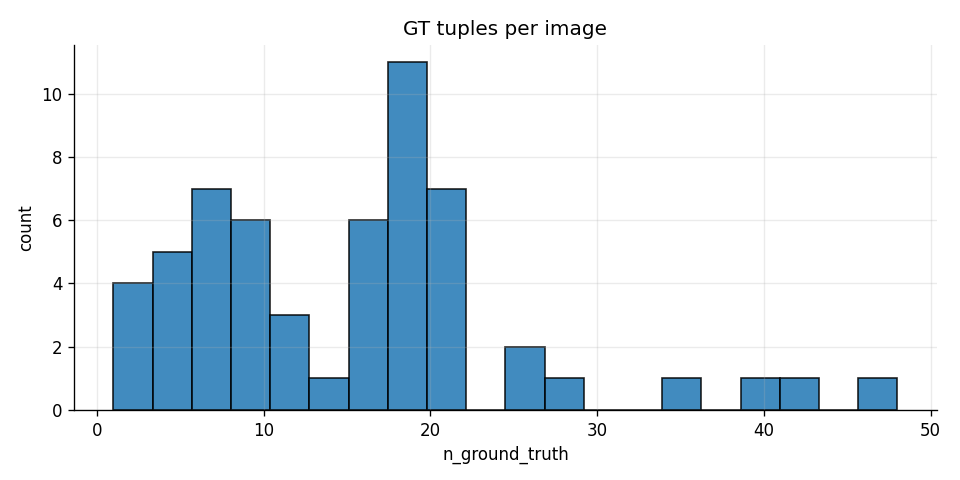

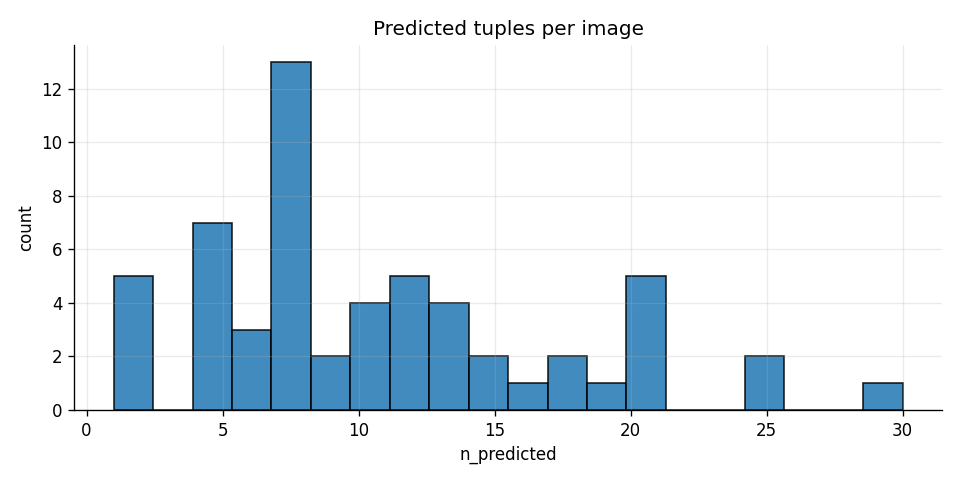

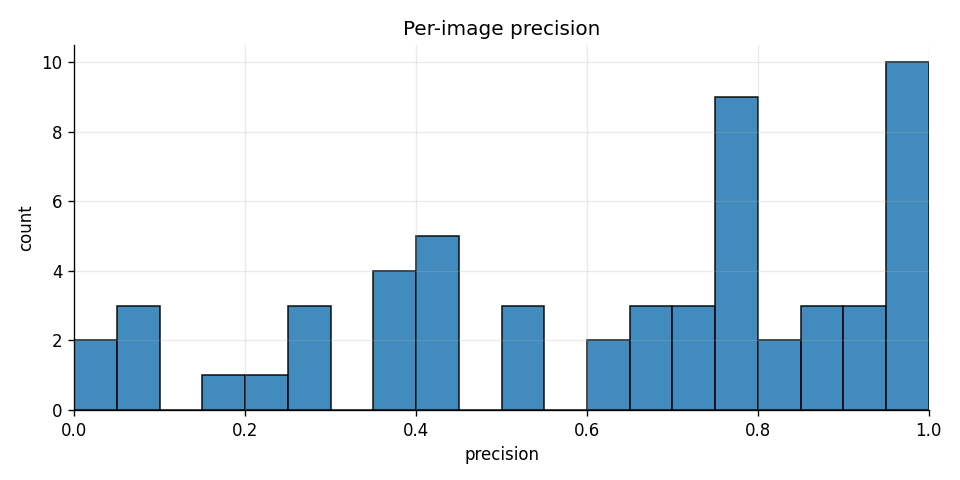

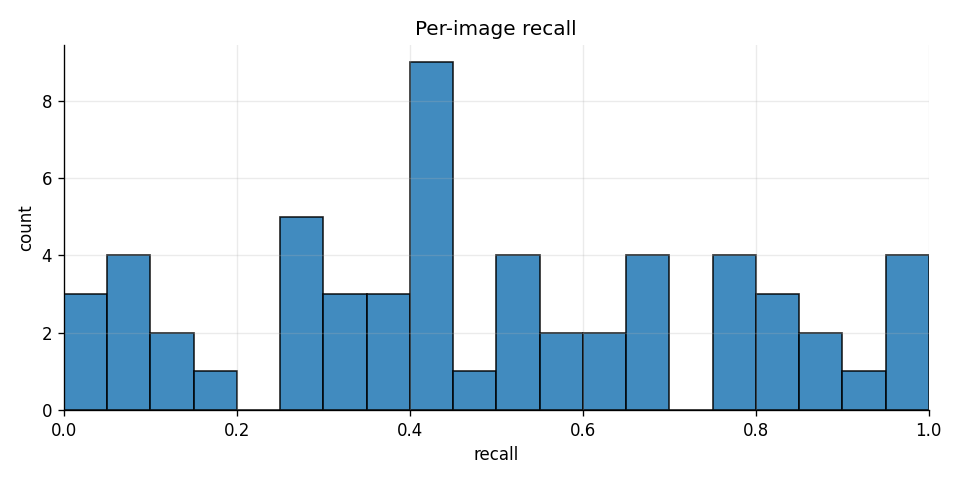

# Dataset-level descriptive report — EXP-08

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 610
- True positives: 355
- False positives: 255
- False negatives: 511
- Dataset-level **precision = 0.5820**, **recall = 0.4099**, **F1 = 0.4810**
- Mean per-image F1: 0.6689
- Median per-image F1: 0.7500
- Standard deviation of per-image F1: 0.2943

## Performance characterisation

The experiment is limited primarily by recall (the system under-predicts). The 0.29 standard deviation of per-image F1 indicates highly variable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id  f1  tp  fp  fn
    104.jpeg 1.0  12   0   6
    111.jpeg 1.0   1   0   0
    112.jpeg 1.0   1   0   0
      12.png 1.0  12   0   4
      17.png 1.0   3   1   1

## Worst-performing images

    image_id   f1  tp  fp  fn
      30.png 0.00   0   8  18
     78.jpeg 0.00   0   2   2
    119.jpeg 0.07   1  16  19
      91.png 0.07   1  13  15
    118.jpeg 0.08   1  14  19


: 

In [ ]:
exp08_result = run_single_experiment(
    experiment_id   = "EXP-08",
    experiment_name = _phase2_name("B", "VLM"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["B"],
    association_key = ablation_config["phase2"]["associations"]["VLM"],
    notes           = "embedding + vlm",
)
display_experiment_results(exp08_result)

## EXP-09 — Classifier C (GLiNER) + Graph v1

Fetching 12 files: 100%|██████████| 12/12 [00:00<?, ?it/s]
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.
12:50:54 [ERROR] ablation :: Pipeline failed on 119.jpeg: RuntimeError: could not create a primitive
12:50:56 [ERROR] ablation :: Pipeline failed on 120.jpeg: RuntimeError: could not create a primitive
12:50:58 [ERROR] ablation :: Pipeline failed on 121.jpeg: RuntimeError: could not create a primitive
12:50:59 [ERROR] ablation :: Pipeline failed on 201.jpeg: RuntimeError: could not create a primitive
12:51:01 [ERROR] ablation :: Pipeline failed on 45_1.png: RuntimeError: could not create a primitive
12:51:02 [ERROR] ablation :: Pipeline failed on 45_2.png: RuntimeError: could not create a primitive


  EXPERIMENT RESULTS : C_G1
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 471
  Matched pairs      : 346
─────────────────────────────────────────────────────────────────
  Nutrient Precision : 0.735
  Nutrient Recall    : 0.400
  Nutrient F1        : 0.518
─────────────────────────────────────────────────────────────────
  Quantity Match Acc : 25.7%
  Unit Match Acc     : 0.6%
  Context Match Acc  : 0.0%
─────────────────────────────────────────────────────────────────
  3-FIELD (no context) — nutrient + qty + unit
  ★ Full Tuple Precision : 0.0%
  ★ Full Tuple Recall    : 0.0%
  ★ Full Tuple F1        : 0.0%
─────────────────────────────────────────────────────────────────
  4-FIELD (with context) — primary thesis metric
  ★ Full Tuple Precision : 0.0%
  ★ Full Tuple Recall    : 0.0%
  ★ Full Tuple F1        : 0.0%
─────────────────────────────────────────────────────────────────
  Context cost 

### EXP-09 — C_G1

- OCR: `paddleocr` · Classifier: `gliner` · Association: `graph_v1`

**Dataset-level metrics**

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_precision,nutrient_recall,nutrient_f1,quantity_acc,unit_acc,context_acc,full3f_precision,full3f_recall,full3f_f1,full3f_correct,full4f_correct,matched_pairs,mean_image_precision,mean_image_recall,mean_image_f1,median_image_f1,std_image_f1,experiment,timestamp,notes,evaluator,schema,images_evaluated,gt_tuples,predicted_tuples,context_cost_pp,llm_calls,fast_hits,eval_time_s,metric_source
0,57,866,471,0,471,866,0.0,0.0,0.0,0.7346,0.3995,0.5176,0.2572,0.0058,0.0,0.0,0.0,0,0,0,346,0.0,0.0,0.0,0.0,0.0,C_G1,2026-05-16T12:51:03.066040,ablation,LLM-Assisted (qwen2.5:7b),nutrient|quantity|unit|context,57,866,471,0,0,0,0.0,llm_tuple_evaluator


**Per-image metrics (head)**

,image_id,n_ground_truth,n_predicted,nutrient_matches,qty_acc_pct,unit_acc_pct,ctx_acc_pct,f1_3field_pct,f1_4field_pct,tp,fp,fn,precision,recall,f1
0,1.png,5,7,3,100,0,0,0,0.0,0,7,5,0.0,0.0,0.0
1,101.png,11,11,9,22,0,0,0,0.0,0,11,11,0.0,0.0,0.0
2,102.png,18,18,12,17,0,0,0,0.0,0,18,18,0.0,0.0,0.0
3,103.jpeg,18,15,12,25,0,0,0,0.0,0,15,18,0.0,0.0,0.0
4,104.jpeg,18,15,8,12,0,0,0,0.0,0,15,18,0.0,0.0,0.0
5,105.png,18,15,11,9,0,0,0,0.0,0,15,18,0.0,0.0,0.0
6,106.png,2,2,2,0,0,0,0,0.0,0,2,2,0.0,0.0,0.0
7,107.png,10,15,10,20,0,0,0,0.0,0,15,10,0.0,0.0,0.0
8,108.jpeg,11,20,10,50,0,0,0,0.0,0,20,11,0.0,0.0,0.0
9,109.jpeg,9,16,7,86,0,0,0,0.0,0,16,9,0.0,0.0,0.0


#### Image: `1.png`

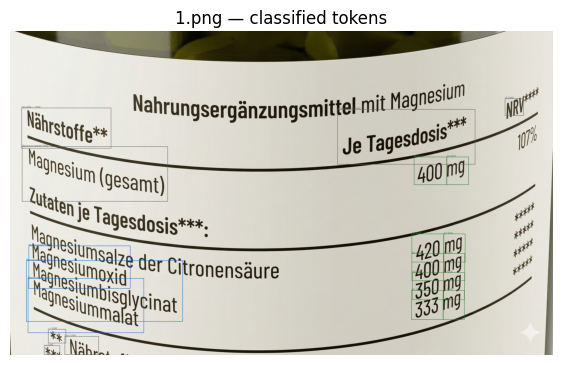

**Predicted tuples** (7) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Magnesiumoxid,400,None,None
1,Magnesiumoxid,mg,None,None
2,Magnesiumbisglycinat,333,None,None
3,Magnesiumbisglycinat,350,None,None
4,Magnesiumbisglycinat,mg,None,None
5,Magnesiummalat,333,None,None
6,Magnesiummalat,mg,None,None


**Ground-truth tuples** (5) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Magnesium (gesamt),400,mg,per_daily_dose
1,Magnesiumsalze der Citronensäure,420,mg,per_daily_dose
2,Magnesiumoxid,400,mg,per_daily_dose
3,Magnesiumbisglycinat,350,mg,per_daily_dose
4,Magnesiummalat,333,mg,per_daily_dose


**Evaluator counts:** TP 0 · FP 7 · FN 5  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 1.png. GT=5, predicted=7, TP=0, FP=7, FN=5. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Magnesiumoxid 400  []; Magnesiumbisglycinat 350  []; Magnesiummalat 333  []
```

#### Image: `30.png`

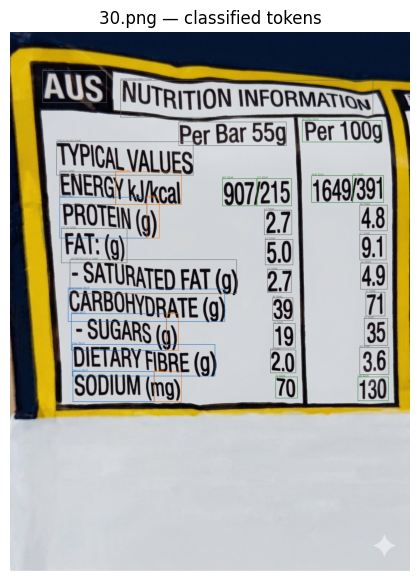

**Predicted tuples** (6) — from `tuples.csv`

,nutrient,quantity,unit,context
0,Protein,NaN,NaN,None
1,Carbohydrate,NaN,NaN,None
2,Sugars,NaN,NaN,None
3,Fibre,NaN,NaN,None
4,Sodium,70,,None
5,Sodium,130,,None


**Ground-truth tuples** (18) — from `test_set_normalized.csv`

,nutrient,quantity,unit,context
0,Energy,907,kJ,per_serving (Per Bar 55g)
1,Energy,215,kcal,per_serving (Per Bar 55g)
2,Protein,2.7,g,per_serving (Per Bar 55g)
3,Fat,5.0,g,per_serving (Per Bar 55g)
4,Saturated Fats,2.7,g,per_serving (Per Bar 55g)
5,Carbohydrate,39,g,per_serving (Per Bar 55g)
6,Sugars,19,g,per_serving (Per Bar 55g)
7,Fibre,2.0,g,per_serving (Per Bar 55g)
8,Sodium,70,mg,per_serving (Per Bar 55g)
9,Energy,1649,kJ,per_100g


**Evaluator counts:** TP 0 · FP 6 · FN 18  (precision 0.00, recall 0.00, F1 0.00)

```
Image: 30.png. GT=18, predicted=6, TP=0, FP=6, FN=18. Precision=0.00, recall=0.00, F1=0.00. Likely failure source: none. Fast-rule decision: n/a.
  Correctly extracted: Sodium 70  []; Sodium 130  []; Protein   []  (+3 more)
```

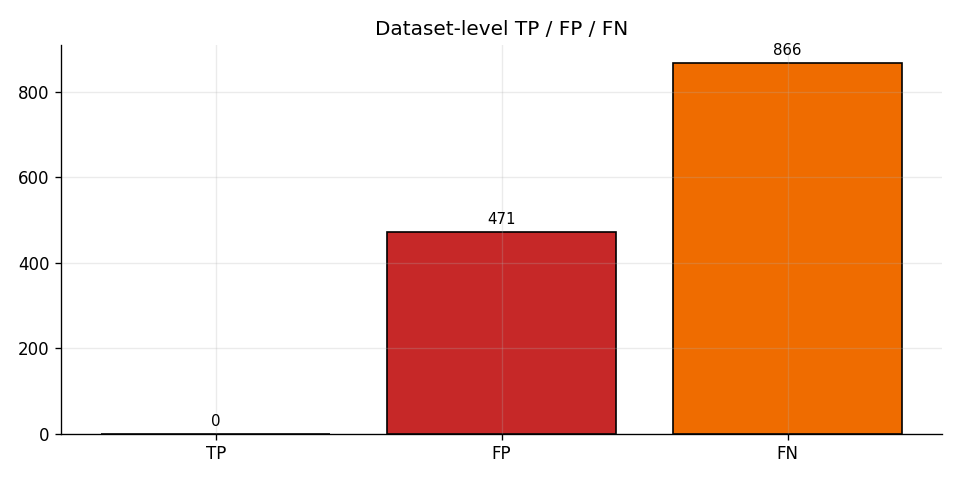

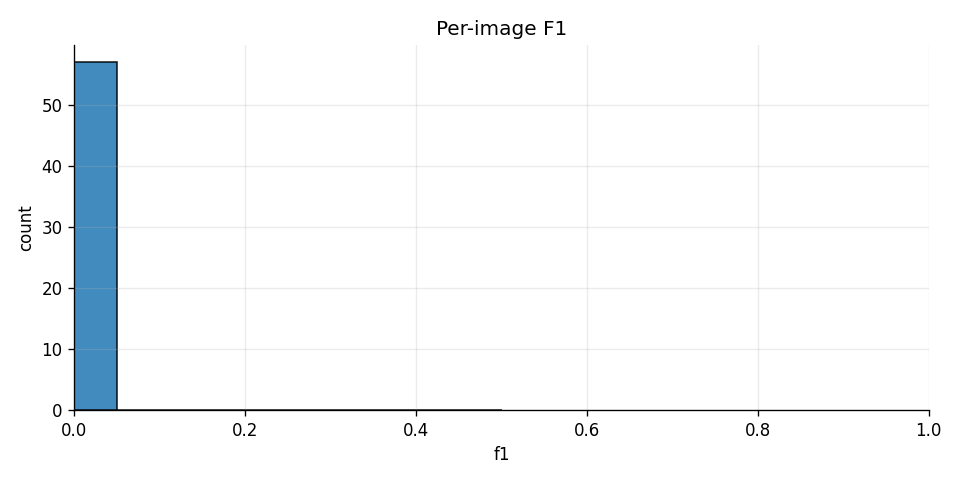

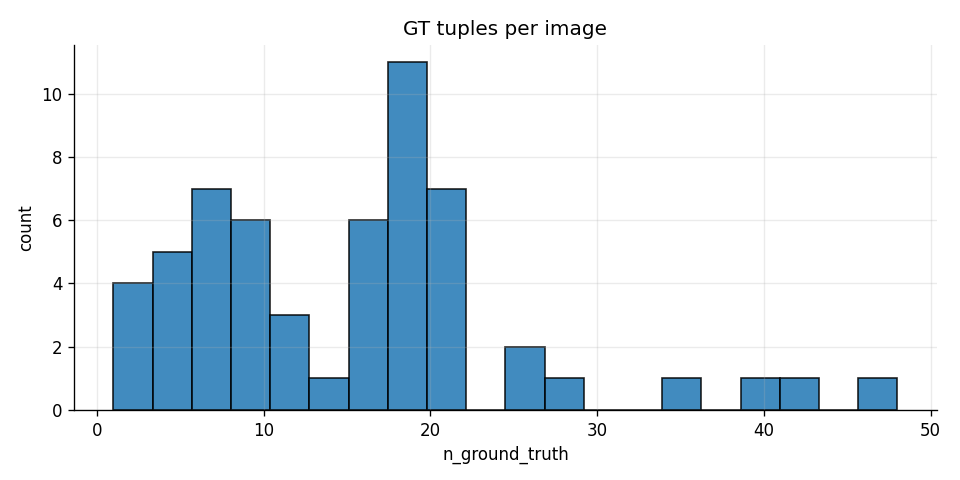

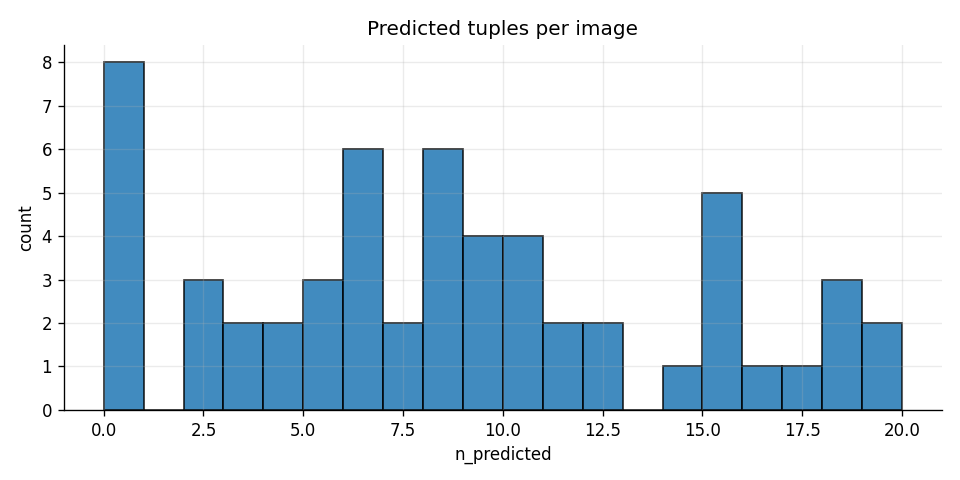

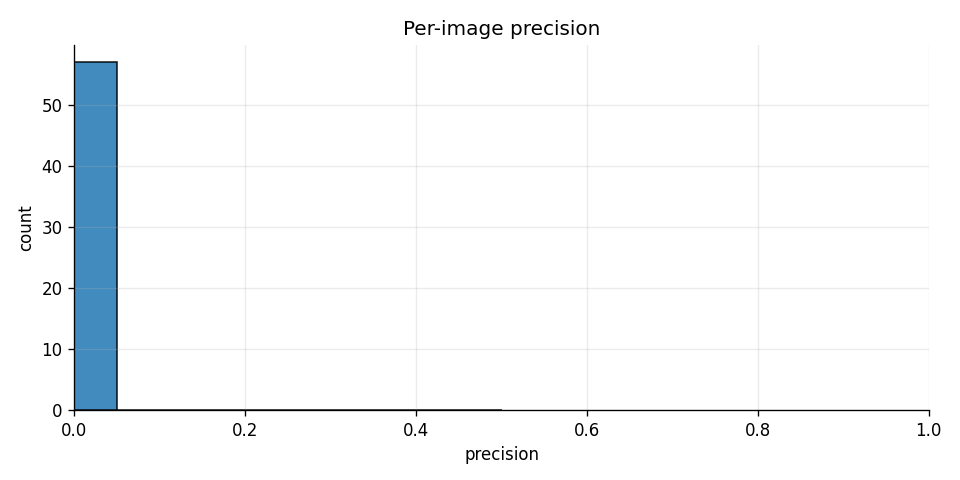

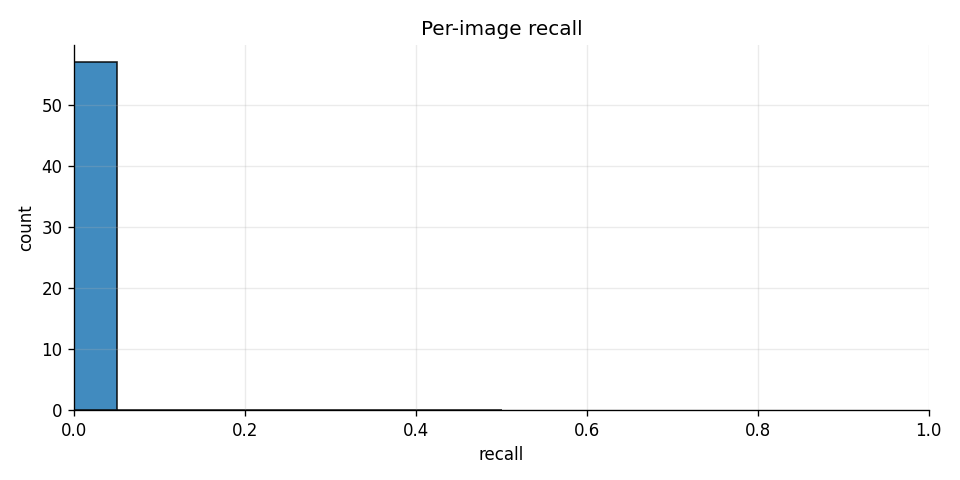

# Dataset-level descriptive report — EXP-09

## Headline metrics

- Images processed: **57**
- Ground-truth tuples: 866
- Predicted tuples: 471
- True positives: 0
- False positives: 471
- False negatives: 866
- Dataset-level **precision = 0.0000**, **recall = 0.0000**, **F1 = 0.0000**
- Mean per-image F1: 0.0000
- Median per-image F1: 0.0000
- Standard deviation of per-image F1: 0.0000

## Performance characterisation

The experiment is limited primarily by precision and recall in roughly balanced proportion. The 0.00 standard deviation of per-image F1 indicates stable behaviour across images.

## Dominant failure sources

- **none**: 57 images

## Best-performing images

    image_id  f1  tp  fp  fn
       1.png 0.0   0   7   5
     101.png 0.0   0  11  11
     102.png 0.0   0  18  18
    103.jpeg 0.0   0  15  18
    104.jpeg 0.0   0  15  18

## Worst-performing images

    image_id  f1  tp  fp  fn
       1.png 0.0   0   7   5
     101.png 0.0   0  11  11
     102.png 0.0   0  18  18
    103.jpeg 0.0   0  15  18
    104.jpeg 0.0   0  15  18


In [37]:
exp09_result = run_single_experiment(
    experiment_id   = "EXP-09",
    experiment_name = _phase2_name("C", "G1"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["C"],
    association_key = ablation_config["phase2"]["associations"]["G1"],
    notes           = "gliner + graph_v1",
)
display_experiment_results(exp09_result)

## EXP-10 — Classifier C (GLiNER) + Graph v2

In [2]:
exp10_result = run_single_experiment(
    experiment_id   = "EXP-10",
    experiment_name = _phase2_name("C", "G2"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["C"],
    association_key = ablation_config["phase2"]["associations"]["G2"],
    notes           = "gliner + graph_v2",
)
display_experiment_results(exp10_result)

NameError: name 'run_single_experiment' is not defined

## EXP-11 — Classifier C (GLiNER) + VLM

In [ ]:
exp11_result = run_single_experiment(
    experiment_id   = "EXP-11",
    experiment_name = _phase2_name("C", "VLM"),
    ocr_engine      = PHASE2_OCR,
    classifier_key  = ablation_config["phase2"]["classifiers"]["C"],
    association_key = ablation_config["phase2"]["associations"]["VLM"],
    notes           = "gliner + vlm",
)
display_experiment_results(exp11_result)

In [ ]:
"""EXP-12 helpers — consolidated, drop-in.
Defines everything Cell EXP12-C needs. Run this once."""

import io, re as _re, json, time, base64, logging, urllib.request, urllib.error
from pathlib import Path
from typing import Tuple, List, Dict, Any, Optional

import pandas as pd
from PIL import Image, ImageOps
from IPython.display import display, Markdown

try:
    logger
except NameError:
    logging.basicConfig(level=logging.INFO,
                        format="%(asctime)s [%(levelname)s] %(name)s :: %(message)s",
                        datefmt="%H:%M:%S")
    logger = logging.getLogger("ablation")


E2E_VLM_SYSTEM_PROMPT = (
    "You are an expert at extracting structured nutrient information from "
    "supplement and food label images. Output ONLY a valid JSON array. "
    "No prose, no markdown fences, no commentary."
)

E2E_VLM_USER_PROMPT = """Look at this supplement / food label image and extract every nutrient row.

For each nutrient on the label, output ONE entry with:
  - nutrient: canonical English name (e.g. "Vitamin C", "Magnesium", "Calcium", "Folic Acid", "Iron")
  - quantity: numeric value as a string (e.g. "80", "2.5", "1.5")
  - unit: standard unit (mg, g, µg, kJ, kcal, IU, ml, l)
  - context: EXACTLY ONE of: per_100g, per_100ml, per_serving, per_daily_dose, etc.

Rules:
- One entry per (nutrient, context) combination. If shown per_100g AND per_serving, emit two entries.
- Skip sub-nutrients labelled "davon" / "of which" unless their values are clearly distinct.
- Skip NRV%, %DV, %RDA, %RI.
- Skip ingredient lists, marketing copy, addresses.
- Convert German to canonical English ("Zucker"->"Sugars", "Eisen"->"Iron", "Kalium"->"Potassium", "Eiweiss"->"Protein").
- Use " µg" for micrograms.

DECIMAL SEPARATOR -- CRITICAL:
German/EU labels use "," (comma) as decimal separator. Convert ALL commas in quantity to "." (period).
  "1,5"   -> "1.5"
  "0,02"  -> "0.02"
  "12,5"  -> "12.5"
Never emit a comma inside a quantity string.

Return ONLY the JSON array. Example:
[
  {"nutrient": "Vitamin C", "quantity": "80",  "unit": "mg", "context": "per_serving"},
  {"nutrient": "Magnesium",  "quantity": "1.5", "unit": "mg", "context": "per_daily_dose"}
]
"""


def _image_to_base64_jpeg(image_path, max_side=896, quality=95):
    with Image.open(image_path) as im:
        im = ImageOps.exif_transpose(im).convert("RGB")
        if max(im.size) > max_side:
            im.thumbnail((max_side, max_side), Image.Resampling.LANCZOS)
        buf = io.BytesIO()
        im.save(buf, format="JPEG", quality=quality, optimize=True)
        return base64.b64encode(buf.getvalue()).decode("ascii")


def _strip_vlm_response(text):
    if not text:
        return ""
    text = _re.sub(r"<think>.*?</think>", "", text, flags=_re.DOTALL | _re.IGNORECASE)
    fence = _re.search(r"```(?:json)?\s*(.+?)```", text, _re.DOTALL)
    if fence:
        text = fence.group(1)
    text = _re.sub(r",(\s*[}\]])", r"\1", text)
    return text.strip()


def _normalize_quantity_string(raw):
    s = str(raw if raw is not None else "").strip()
    if not s:
        return ""
    if "," in s and s.count(".") >= 1 and s.rfind(",") > s.rfind("."):
        s = s.replace(".", "")
    s = s.replace(",", ".")
    return s


def _parse_e2e_vlm_response(text, image_id):
    stripped = _strip_vlm_response(text)
    if not stripped:
        return [], "empty response"
    try:
        data = json.loads(stripped)
    except json.JSONDecodeError as e:
        arr = _re.search(r"\[\s*\{.*?\}\s*\]", stripped, _re.DOTALL)
        if not arr:
            return [], f"JSON parse failed: {e}"
        try:
            data = json.loads(arr.group(0))
        except Exception as e2:
            return [], f"JSON parse failed (relaxed): {e2}"
    if not isinstance(data, list):
        return [], f"expected JSON array, got {type(data).__name__}"
    tuples = []
    for raw in data:
        if not isinstance(raw, dict):
            continue
        row = {k.lower(): v for k, v in raw.items()}
        tuples.append({
            "image_id": image_id,
            "nutrient": str(row.get("nutrient", "") or "").strip(),
            "quantity": _normalize_quantity_string(row.get("quantity")),
            "unit":     str(row.get("unit",     "") or "").strip(),
            "context":  str(row.get("context",  "") or "").strip(),
        })
    return tuples, None


def _call_lm_studio_vision(image_path, base_url, model,
                           temperature=0.1, max_tokens=4096, timeout_s=600):
    b64 = _image_to_base64_jpeg(image_path)
    body = {
        "model":       model,
        "temperature": temperature,
        "max_tokens":  max_tokens,
        "messages": [
            {"role": "system", "content": E2E_VLM_SYSTEM_PROMPT},
            {"role": "user", "content": [
                {"type": "text",      "text": E2E_VLM_USER_PROMPT},
                {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{b64}"}},
            ]},
        ],
    }
    req = urllib.request.Request(
        base_url,
        data=json.dumps(body).encode("utf-8"),
        headers={"Content-Type": "application/json"},
    )
    t0 = time.perf_counter()
    with urllib.request.urlopen(req, timeout=timeout_s) as r:
        resp = json.loads(r.read().decode("utf-8"))
    elapsed = time.perf_counter() - t0
    text = resp.get("choices", [{}])[0].get("message", {}).get("content", "") or ""
    return text, elapsed


def run_exp12_end_to_end_vlm(images, out_dir, base_url, model,
                              temperature=0.1, max_tokens=4096,
                              timeout_s=600, save_responses=False):
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    all_tuples, errors, times, raw_responses = [], [], [], []

    for i, img_path in enumerate(images, 1):
        image_id = img_path.stem + img_path.suffix.lower()
        t0 = time.perf_counter()
        try:
            text, vlm_elapsed = _call_lm_studio_vision(
                image_path=img_path, base_url=base_url, model=model,
                temperature=temperature, max_tokens=max_tokens, timeout_s=timeout_s,
            )
            tuples, parse_err = _parse_e2e_vlm_response(text, image_id)
            if parse_err:
                errors.append({"image_id": image_id, "stage": "parse", "error": parse_err})
            else:
                all_tuples.extend(tuples)
            if save_responses:
                raw_responses.append({"image_id": image_id, "response": text, "n_tuples": len(tuples)})
            total_s = time.perf_counter() - t0
            times.append({
                "image_id":                image_id,
                "status":                  "parse_error" if parse_err else "ok",
                "predicted_tuples":        len(tuples),
                "vlm_time_s":              round(vlm_elapsed, 3),
                "total_processing_time_s": round(total_s,     3),
                "error":                   parse_err or "",
            })
            logger.info("[EXP-12] %3d/%3d %-16s -> %d tuples  (%.1fs)",
                        i, len(images), image_id, len(tuples), vlm_elapsed)
        except Exception as e:
            total_s = time.perf_counter() - t0
            err_msg = f"{type(e).__name__}: {e}"
            errors.append({"image_id": image_id, "stage": "api", "error": err_msg})
            times.append({
                "image_id":                image_id,
                "status":                  "error",
                "predicted_tuples":        0,
                "vlm_time_s":              0.0,
                "total_processing_time_s": round(total_s, 3),
                "error":                   err_msg,
            })
            logger.error("[EXP-12] %3d/%3d %s FAILED: %s", i, len(images), image_id, err_msg)

    pred_cols = ["image_id", "nutrient", "quantity", "unit", "context"]
    pd.DataFrame([{k: t.get(k, "") for k in pred_cols} for t in all_tuples]) \
        .to_csv(out_dir / "tuples.csv", index=False)
    pd.DataFrame(times).to_csv(out_dir / "processing_times.csv", index=False)
    if errors:
        pd.DataFrame(errors).to_csv(out_dir / "errors.csv", index=False)
    if save_responses and raw_responses:
        with open(out_dir / "raw_responses.json", "w", encoding="utf-8") as f:
            json.dump(raw_responses, f, indent=2, ensure_ascii=False)

    return {
        "n_images":     len(images),
        "n_tuples":     len(all_tuples),
        "n_errors":     len(errors),
        "total_time_s": sum(t["total_processing_time_s"] for t in times),
        "out_dir":      str(out_dir),
        "all_tuples":   all_tuples,
    }


# Verify everything loaded
_required = ["E2E_VLM_SYSTEM_PROMPT", "E2E_VLM_USER_PROMPT",
             "_image_to_base64_jpeg", "_strip_vlm_response",
             "_normalize_quantity_string", "_parse_e2e_vlm_response",
             "_call_lm_studio_vision", "run_exp12_end_to_end_vlm"]
_missing = [n for n in _required if n not in globals()]
if _missing:
    raise RuntimeError(f"Failed to load: {_missing}")
print("[EXP-12] All 8 helpers loaded successfully.")

[EXP-12] All 8 helpers loaded successfully.


## EXP-12 — End-to-end VLM baseline (no OCR, no classifier, no graph)

Sends each image directly to Gemma 3 via LM Studio. The model is asked to
return a JSON array of `{nutrient, quantity, unit, context}` rows for every
nutrient on the label. **This is the upper-bound comparison the thesis needs**:
if the structured pipeline beats this, the contribution is justified by F1
alone; if it doesn't, the contribution is justified by *interpretability,
auditability, and explicit failure modes* — both are valid thesis stories.

**Prerequisite:** LM Studio must be running with a vision-capable Gemma 3
variant loaded. Confirm with:

```python
import urllib.request, json
req = urllib.request.Request(
    ablation_config["vlm"]["openai_base_url"],
    data=json.dumps({"model": ablation_config["vlm"]["openai_model"],
                     "messages": [{"role": "user", "content": "ping"}],
                     "max_tokens": 5}).encode(),
    headers={"Content-Type": "application/json"})
print(urllib.request.urlopen(req, timeout=10).read().decode()[:200])
```

If you get a JSON response back, you're good.

In [48]:
"""C15 post-pass for EXP-12 predictions — parity with the structured pipeline."""

import sys
from pathlib import Path

# Make sure the project root is on sys.path so the import works
_root = Path.cwd()
for _ in range(8):
    if (_root / "src").is_dir() and (_root / "data").is_dir():
        if str(_root) not in sys.path:
            sys.path.insert(0, str(_root))
        break
    _root = _root.parent

try:
    from src.utils.paddleOCR_corrector_v2 import apply_c15_normalise_names
    print("[EXP-12] C15 normalisation loaded from src.utils.paddleOCR_corrector_v2")
except ImportError:
    # Fallback: bare module name (older project layout)
    from paddleOCR_corrector_v2 import apply_c15_normalise_names
    print("[EXP-12] C15 normalisation loaded from paddleOCR_corrector_v2")


def apply_c15_to_predictions(predictions):
    """Apply the structured pipeline's C15 nutrient-name normalisation to
    the VLM-extracted tuples. Returns a new list of dicts.

    C15 maps surface forms like 'vitamin c', 'Saturated Fat', 'Eisen' to
    canonical English names ('Vitamin C', 'Saturated Fats', 'Iron') used
    in the ground truth. Without this step, EXP-12 is penalised for cosmetic
    surface mismatches even when its semantic answer is correct.
    """
    if not predictions:
        return list(predictions)
    wrapped = [{"token": p.get("nutrient", "")} for p in predictions]
    normalised = apply_c15_normalise_names(wrapped)
    out = []
    n_changed = 0
    for orig, norm in zip(predictions, normalised):
        new = dict(orig)
        new_nut = norm.get("token", orig.get("nutrient", ""))
        if new_nut != orig.get("nutrient", ""):
            n_changed += 1
        new["nutrient"] = new_nut
        out.append(new)
    print(f"[EXP-12] C15 applied: {n_changed} / {len(predictions)} nutrient names normalised.")
    return out


print("[EXP-12] apply_c15_to_predictions ready.")

[EXP-12] C15 normalisation loaded from src.utils.paddleOCR_corrector_v2
[EXP-12] apply_c15_to_predictions ready.


In [49]:
"""EXP-12 — Run end-to-end VLM extraction + C15 normalisation + evaluate.
Self-contained: defines its own minimal config / paths / GT loader so it
works regardless of which earlier notebook cells have been executed.
Requires Cell EXP12-A (helpers) to have been run."""

import sys, os
import json, time
from pathlib import Path
from dataclasses import dataclass, asdict
from typing import Optional, List, Dict, Any
import pandas as pd
from IPython.display import display, Markdown


# ── Resolve project root (data/ + src/ markers) ─────────────────────────
def _find_project_root(start: Path, markers=("data", "src"), max_up: int = 8) -> Path:
    cur = start.resolve()
    for _ in range(max_up):
        if all((cur / m).is_dir() for m in markers):
            return cur
        if cur.parent == cur:
            break
        cur = cur.parent
    return start.resolve()

PROJECT_ROOT = _find_project_root(Path.cwd())
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))
print(f"[EXP-12] Project root: {PROJECT_ROOT}")


# ── Import C15 normalisation from the structured pipeline ───────────────
try:
    from src.utils.paddleOCR_corrector_v2 import apply_c15_normalise_names
    print("[EXP-12] C15 loaded from src.utils.paddleOCR_corrector_v2")
except ImportError:
    try:
        from paddleOCR_corrector_v2 import apply_c15_normalise_names
        print("[EXP-12] C15 loaded from paddleOCR_corrector_v2")
    except ImportError as e:
        raise RuntimeError(
            "Could not import apply_c15_normalise_names. "
            "Check that paddleOCR_corrector_v2.py is reachable from "
            f"{PROJECT_ROOT}. Tried: src.utils.paddleOCR_corrector_v2 and "
            "paddleOCR_corrector_v2."
        ) from e


def apply_c15_to_predictions(predictions):
    """Apply the structured pipeline's C15 nutrient-name normalisation to
    VLM-extracted tuples. Maps surface forms like 'vitamin c', 'Eisen',
    'Saturated Fat' to canonical English names ('Vitamin C', 'Iron',
    'Saturated Fats') used in the ground truth. Without this, EXP-12 is
    penalised for cosmetic surface mismatches on semantically correct
    answers, which would make the comparison to the structured pipeline
    unfair."""
    if not predictions:
        return list(predictions), 0
    wrapped = [{"token": p.get("nutrient", "")} for p in predictions]
    normalised = apply_c15_normalise_names(wrapped)
    out, n_changed = [], 0
    for orig, norm in zip(predictions, normalised):
        new = dict(orig)
        new_nut = norm.get("token", orig.get("nutrient", ""))
        if new_nut != orig.get("nutrient", ""):
            n_changed += 1
        new["nutrient"] = new_nut
        out.append(new)
    return out, n_changed


# ── Minimal config (overrides if ablation_config already exists) ────────
_default_vlm_config = {
    "backend":          "openai_compat",
    "openai_base_url":  "http://127.0.0.1:1234/v1/chat/completions",
    "openai_model":     "google/gemma-3-4b",
    "temperature":      0.1,
    "max_tokens":       4096,
}
_default_paths = {
    "raw_dir":           "data/raw",
    "ground_truth_csv":  "data/annotations/test_set_normalized.csv",
    "output_dir":        "results/ablation",
    "image_extensions":  {".jpg", ".jpeg", ".png", ".bmp", ".tiff", ".tif", ".webp"},
}

try:
    _vlm_cfg      = dict(ablation_config["vlm"])
    _raw_dir      = PROJECT_ROOT / ablation_config["data"]["raw_dir"]
    _gt_csv       = PROJECT_ROOT / ablation_config["data"]["ground_truth_csv"]
    _output_dir   = PROJECT_ROOT / ablation_config["output_dir"]
    _img_exts     = ablation_config["data"]["image_extensions"]
    _limit        = ablation_config["debug"]["limit_images"]
    _use_llm_eval = ablation_config["evaluation"]["use_llm_in_evaluator"]
    _eval_model   = ablation_config["evaluation"]["llm_evaluator_model"]
    print("[EXP-12] Using existing ablation_config.")
except NameError:
    _vlm_cfg      = _default_vlm_config
    _raw_dir      = PROJECT_ROOT / _default_paths["raw_dir"]
    _gt_csv       = PROJECT_ROOT / _default_paths["ground_truth_csv"]
    _output_dir   = PROJECT_ROOT / _default_paths["output_dir"]
    _img_exts     = _default_paths["image_extensions"]
    _limit        = None
    _use_llm_eval = False
    _eval_model   = "qwen2.5:7b"
    print("[EXP-12] ablation_config not found — using built-in defaults.")

print(f"[EXP-12] RAW_DIR:     {_raw_dir}     exists={_raw_dir.exists()}")
print(f"[EXP-12] GT_CSV:      {_gt_csv}      exists={_gt_csv.exists()}")
print(f"[EXP-12] OUTPUT_DIR:  {_output_dir}")
print(f"[EXP-12] VLM model:   {_vlm_cfg['openai_model']} @ {_vlm_cfg['openai_base_url']}")


# ── Minimal ExperimentSpec (idempotent — uses notebook's class if defined) ─
try:
    ExperimentSpec
except NameError:
    @dataclass
    class ExperimentSpec:
        experiment_id:    str
        experiment_name:  str
        ocr_engine:       str
        classifier_key:   str
        association_key:  str
        notes:            str = ""


# ── Image listing ───────────────────────────────────────────────────────
def _list_images(raw_dir: Path, limit: Optional[int] = None) -> List[Path]:
    files = [f for f in Path(raw_dir).iterdir() if f.suffix.lower() in _img_exts]
    files.sort(key=lambda f: (int(f.stem) if f.stem.isdigit() else float("inf"), f.name))
    return files[:limit] if limit else files


# ── GT loader from CSV (mirrors the notebook's load_gt_from_csv) ────────
def _load_gt_from_csv(csv_path: Path) -> List[Dict[str, str]]:
    csv_path = Path(csv_path)
    if not csv_path.exists():
        raise FileNotFoundError(f"GT CSV not found: {csv_path}")
    df = pd.read_csv(csv_path, dtype=str, keep_default_na=False)
    rows: List[Dict[str, str]] = []
    for _, r in df.iterrows():
        raw_id = str(r.get("image_id", "") or "").strip()
        if not raw_id:
            continue
        image_id = Path(raw_id).stem + Path(raw_id).suffix.lower()
        context      = str(r.get("context",      "") or "").strip()
        serving_size = str(r.get("serving_size", "") or "").strip()
        context_full = f"{context} ({serving_size})" if serving_size else context
        rows.append({
            "image_id": image_id,
            "nutrient": str(r.get("nutrient", "") or "").strip(),
            "quantity": str(r.get("quantity", "") or "").strip(),
            "unit":     str(r.get("unit",     "") or "").strip(),
            "context":  context_full,
        })
    return rows


# ── Build experiment spec + output dir ──────────────────────────────────
EXP12_SPEC = ExperimentSpec(
    experiment_id   = "EXP-12",
    experiment_name = "e2e_vlm",
    ocr_engine      = "none",
    classifier_key  = "none",
    association_key = "vlm_e2e",
    notes           = "End-to-end VLM baseline: image -> Gemma -> tuples + C15 "
                      "nutrient-name normalisation post-hoc for fair comparison.",
)

EXP12_OUT_DIR = _output_dir / f"{EXP12_SPEC.experiment_id}_{EXP12_SPEC.experiment_name}"
EXP12_OUT_DIR.mkdir(parents=True, exist_ok=True)
(EXP12_OUT_DIR / "plots").mkdir(parents=True, exist_ok=True)

with open(EXP12_OUT_DIR / "config_snapshot.json", "w", encoding="utf-8") as f:
    json.dump({
        "experiment": asdict(EXP12_SPEC),
        "vlm_config": {
            "backend":     _vlm_cfg.get("backend"),
            "base_url":    _vlm_cfg["openai_base_url"],
            "model":       _vlm_cfg["openai_model"],
            "temperature": _vlm_cfg.get("temperature", 0.1),
            "max_tokens":  _vlm_cfg.get("max_tokens",  4096),
        },
        "post_processing": {"c15_normalisation": True},
        "timestamp": time.strftime("%Y-%m-%d %H:%M:%S"),
    }, f, indent=2)


# ── Image set ───────────────────────────────────────────────────────────
images = _list_images(_raw_dir, limit=_limit)
print(f"[EXP-12] Running end-to-end VLM on {len(images)} images "
      f"(limit_images={_limit})")


# ── Run extraction ──────────────────────────────────────────────────────
exp12_run = run_exp12_end_to_end_vlm(
    images         = images,
    out_dir        = EXP12_OUT_DIR,
    base_url       = _vlm_cfg["openai_base_url"],
    model          = _vlm_cfg["openai_model"],
    temperature    = _vlm_cfg.get("temperature", 0.1),
    max_tokens     = _vlm_cfg.get("max_tokens",  4096),
    timeout_s      = 600,
    save_responses = False,
)


# ── C15 nutrient-name normalisation (parity with structured pipeline) ───
raw_tuples_path = EXP12_OUT_DIR / "tuples_raw.csv"
pred_cols = ["image_id", "nutrient", "quantity", "unit", "context"]
pd.DataFrame([{k: t.get(k, "") for k in pred_cols} for t in exp12_run["all_tuples"]]) \
    .to_csv(raw_tuples_path, index=False)
print(f"[EXP-12] Raw tuples saved to {raw_tuples_path.name} (pre-C15).")

normalised, n_c15_changed = apply_c15_to_predictions(exp12_run["all_tuples"])
exp12_run["all_tuples"] = normalised
print(f"[EXP-12] C15 normalised {n_c15_changed} / {len(normalised)} nutrient names.")

# Overwrite tuples.csv with the C15-normalised predictions
pd.DataFrame([{k: t.get(k, "") for k in pred_cols} for t in exp12_run["all_tuples"]]) \
    .to_csv(EXP12_OUT_DIR / "tuples.csv", index=False)


# ── Evaluate against GT ─────────────────────────────────────────────────
gt_rows = _load_gt_from_csv(_gt_csv)
from src.evaluation.llm_evaluator import LLMTupleEvaluator

evaluator = LLMTupleEvaluator(
    gt_rows = gt_rows,
    use_llm = _use_llm_eval,
    model   = _eval_model,
)
exp12_eval_metrics = evaluator.run(
    predictions = exp12_run["all_tuples"],
    experiment  = EXP12_SPEC.experiment_name,
    out_dir     = EXP12_OUT_DIR,
    notes       = EXP12_SPEC.notes,
    diagnostics = {
        "end_to_end_vlm":  True,
        "model":           _vlm_cfg["openai_model"],
        "n_api_errors":    exp12_run["n_errors"],
        "total_time_s":    exp12_run["total_time_s"],
        "c15_applied":     True,
        "c15_normalised":  n_c15_changed,
    },
)


# ── Persist canonical quantitative_metrics.json ─────────────────────────
n_pred = int(exp12_eval_metrics.get("predicted_tuples", 0))
n_gt   = int(exp12_eval_metrics.get("gt_tuples",        0))
tp_4f  = int(exp12_eval_metrics.get("full4f_correct",   0))
exp12_quant = {
    "n_images":             exp12_run["n_images"],
    "n_ground_truth":       n_gt,
    "n_predicted":          n_pred,
    "tp":                   tp_4f,
    "fp":                   max(0, n_pred - tp_4f),
    "fn":                   max(0, n_gt   - tp_4f),
    "full_tuple_precision": float(exp12_eval_metrics.get("full_tuple_precision", 0.0)),
    "full_tuple_recall":    float(exp12_eval_metrics.get("full_tuple_recall",    0.0)),
    "full_tuple_f1":        float(exp12_eval_metrics.get("full_tuple_f1",        0.0)),
    "nutrient_f1":          float(exp12_eval_metrics.get("nutrient_f1",  0.0)),
    "quantity_acc":         float(exp12_eval_metrics.get("quantity_acc", 0.0)),
    "unit_acc":             float(exp12_eval_metrics.get("unit_acc",     0.0)),
    "context_acc":          float(exp12_eval_metrics.get("context_acc",  0.0)),
    "total_processing_time_s": round(exp12_run["total_time_s"], 1),
    "c15_normalisation":    {"applied": True, "n_normalised": n_c15_changed},
    "metric_source":        "llm_tuple_evaluator",
    "metric_pipeline":      "end_to_end_vlm_with_c15",
}
with open(EXP12_OUT_DIR / "quantitative_metrics.json", "w", encoding="utf-8") as f:
    json.dump(exp12_quant, f, indent=2, default=str)


# ── Display headline ────────────────────────────────────────────────────
display(Markdown(f"### EXP-12 — End-to-end VLM + C15 normalisation"))
display(Markdown(
    f"- **Model:** `{_vlm_cfg['openai_model']}` via "
    f"`{_vlm_cfg['openai_base_url']}`\n"
    f"- **Pipeline:** image → Gemma → C15 nutrient normalisation → evaluator\n"
    f"- **Images processed:** {exp12_run['n_images']}  ·  "
    f"**API errors:** {exp12_run['n_errors']}\n"
    f"- **C15 normalised:** {n_c15_changed} / {len(exp12_run['all_tuples'])} tuples\n"
    f"- **Predicted tuples:** {n_pred}  ·  **GT tuples:** {n_gt}\n"
    f"- **4-field F1:** {exp12_quant['full_tuple_f1']:.4f} "
    f"(P = {exp12_quant['full_tuple_precision']:.4f}, "
    f"R = {exp12_quant['full_tuple_recall']:.4f})\n"
    f"- **Nutrient F1:** {exp12_quant['nutrient_f1']:.4f}  ·  "
    f"**Unit acc:** {exp12_quant['unit_acc']:.4f}  ·  "
    f"**Context acc:** {exp12_quant['context_acc']:.4f}\n"
    f"- **Total time:** {exp12_run['total_time_s']/60:.1f} min "
    f"({exp12_run['total_time_s']/max(exp12_run['n_images'],1):.1f} s/image avg)"
))
display(pd.DataFrame([exp12_quant]))

if exp12_run["n_errors"]:
    display(Markdown(f"#### Errors ({exp12_run['n_errors']})"))
    display(pd.read_csv(EXP12_OUT_DIR / "errors.csv"))

[EXP-12] Project root: C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association
[EXP-12] C15 loaded from src.utils.paddleOCR_corrector_v2
[EXP-12] Using existing ablation_config.
[EXP-12] RAW_DIR:     C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\data\raw     exists=True
[EXP-12] GT_CSV:      C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\data\annotations\test_set_normalized.csv      exists=True
[EXP-12] OUTPUT_DIR:  C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\results\ablation
[EXP-12] VLM model:   google/gemma-3-4b @ http://127.0.0.1:1234/v1/chat/completions
[EXP-12] Running end-to-end VLM on 57 images (limit_images=None)
[EXP-12] Raw tuples saved to tuples_raw.csv (pre-C15).
[EXP-12] C15 normalised 363 / 613 nutrient names.
  EXPERIMENT RESULTS : e2e_vlm
  EVALUATOR          : LLM-Assisted (qwen2.5:7b via Ollama)
  Images evaluated   : 57
  GT tuples          : 866
  Predicted tuples   : 613
  Matched pairs      : 520
────────

### EXP-12 — End-to-end VLM + C15 normalisation

- **Model:** `google/gemma-3-4b` via `http://127.0.0.1:1234/v1/chat/completions`
- **Pipeline:** image → Gemma → C15 nutrient normalisation → evaluator
- **Images processed:** 57  ·  **API errors:** 1
- **C15 normalised:** 363 / 613 tuples
- **Predicted tuples:** 613  ·  **GT tuples:** 866
- **4-field F1:** 0.1974 (P = 0.2382, R = 0.1686)
- **Nutrient F1:** 0.7032  ·  **Unit acc:** 0.8135  ·  **Context acc:** 0.4038
- **Total time:** 8.2 min (8.6 s/image avg)

,n_images,n_ground_truth,n_predicted,tp,fp,fn,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_f1,quantity_acc,unit_acc,context_acc,total_processing_time_s,c15_normalisation,metric_source,metric_pipeline
0,57,866,613,146,467,720,0.2382,0.1686,0.1974,0.7032,0.7846,0.8135,0.4038,492.3,"{'applied': True, 'n_normalised': 363}",llm_tuple_evaluator,end_to_end_vlm_with_c15


#### Errors (1)

,image_id,stage,error
0,90.png,parse,JSON parse failed (relaxed): Invalid \escape: line 63 column 25 (char 1271)


In [7]:
print("run_exp12_end_to_end_vlm:", "run_exp12_end_to_end_vlm" in globals())
print("_call_lm_studio_vision:",   "_call_lm_studio_vision"   in globals())
print("E2E_VLM_USER_PROMPT:",      "E2E_VLM_USER_PROMPT"      in globals())

run_exp12_end_to_end_vlm: False
_call_lm_studio_vision: False
E2E_VLM_USER_PROMPT: True


# Final Summary — all 11 experiments

In [42]:
"""Cross-experiment comparison — reads from results/ablation/ on disk.
All metrics, tables, and plots inline. No pipeline reruns needed."""

import json
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Optional, Dict, List, Any
from IPython.display import display, Markdown
import matplotlib.pyplot as plt

%matplotlib inline

# ── Experiment grid definition ─────────────────────────────────────────
PHASE1_IDS = ["EXP-01", "EXP-02"]
PHASE2_IDS = ["EXP-03", "EXP-04", "EXP-05",
              "EXP-06", "EXP-07", "EXP-08",
              "EXP-09", "EXP-10", "EXP-11"]
BASELINE_IDS = ["EXP-12"]
ALL_IDS    = PHASE1_IDS + PHASE2_IDS + BASELINE_IDS

PHASE2_SPEC = {
    "EXP-03": {"classifier_key": "A", "association_key": "G1"},
    "EXP-04": {"classifier_key": "A", "association_key": "G2"},
    "EXP-05": {"classifier_key": "A", "association_key": "VLM"},
    "EXP-06": {"classifier_key": "B", "association_key": "G1"},
    "EXP-07": {"classifier_key": "B", "association_key": "G2"},
    "EXP-08": {"classifier_key": "B", "association_key": "VLM"},
    "EXP-09": {"classifier_key": "C", "association_key": "G1"},
    "EXP-10": {"classifier_key": "C", "association_key": "G2"},
    "EXP-11": {"classifier_key": "C", "association_key": "VLM"},
}
CLASSIFIER_NAME  = {"A": "rule-based", "B": "embedding (BGE-M3)", "C": "GLiNER"}
ASSOCIATION_NAME = {"G1": "graph_v1", "G2": "graph_v2", "VLM": "vlm"}

# Reverse mappings: notebook stores full values (rule_based, graph_v1, etc.)
# in config_snapshot.json. Pivot needs letters (A/B/C, G1/G2/VLM).
CLF_VALUE_TO_LETTER   = {"rule_based": "A", "embedding": "B", "gliner": "C"}
ASSOC_VALUE_TO_LETTER = {"graph_v1": "G1", "graph_v2": "G2", "vlm": "VLM"}

# Edit if your ablation dir is elsewhere
ABLATION_DIR = Path("results/ablation").resolve()

# ── Helpers ────────────────────────────────────────────────────────────

def _find_exp_dir(exp_id: str) -> Optional[Path]:
    m = sorted(ABLATION_DIR.glob(f"{exp_id}_*"))
    return m[0] if m else None

def _safe_load_json(path: Path) -> Dict[str, Any]:
    if not path.exists(): return {}
    try:
        with open(path, encoding="utf-8") as f:
            return json.load(f)
    except Exception:
        return {}

def _first_col(df: pd.DataFrame, candidates: List[str]) -> Optional[str]:
    lower = {c.lower(): c for c in df.columns}
    for c in candidates:
        if c.lower() in lower:
            return lower[c.lower()]
    return None

def load_per_image_metrics(exp_dir: Path) -> pd.DataFrame:
    """Same canonical schema and TP_4f derivation as the notebook loader."""
    cols = ["image_id", "n_ground_truth", "n_predicted", "nutrient_matches",
            "qty_acc_pct", "unit_acc_pct", "ctx_acc_pct",
            "f1_3field_pct", "f1_4field_pct",
            "tp", "fp", "fn", "precision", "recall", "f1"]
    p = exp_dir / "per_image_results.csv"
    if not p.exists():
        return pd.DataFrame(columns=cols)
    df = pd.read_csv(p)
    img_col   = _first_col(df, ["image_id", "image", "filename"])
    gt_col    = _first_col(df, ["gt", "n_ground_truth", "gt_count"])
    pred_col  = _first_col(df, ["pred", "n_predicted", "pred_count"])
    match_col = _first_col(df, ["match", "matched_pairs", "matches", "matched"])
    qty_col   = _first_col(df, ["qty_pct", "quantity_acc"])
    unit_col  = _first_col(df, ["unit_pct", "unit_acc"])
    ctx_col   = _first_col(df, ["ctx_pct", "context_acc"])
    f3_col    = _first_col(df, ["full3f_pct", "f1_3field"])
    f4_col    = _first_col(df, ["full4f_pct", "f1_4field", "full_tuple_f1", "f1"])

    out = pd.DataFrame()
    out["image_id"]         = df[img_col].astype(str) if img_col else [str(i) for i in range(len(df))]
    out["n_ground_truth"]   = pd.to_numeric(df[gt_col],    errors="coerce").fillna(0).astype(int) if gt_col    else 0
    out["n_predicted"]      = pd.to_numeric(df[pred_col],  errors="coerce").fillna(0).astype(int) if pred_col  else 0
    out["nutrient_matches"] = pd.to_numeric(df[match_col], errors="coerce").fillna(0).astype(int) if match_col else 0
    out["qty_acc_pct"]      = pd.to_numeric(df[qty_col],   errors="coerce").fillna(0.0) if qty_col   else 0.0
    out["unit_acc_pct"]     = pd.to_numeric(df[unit_col],  errors="coerce").fillna(0.0) if unit_col  else 0.0
    out["ctx_acc_pct"]      = pd.to_numeric(df[ctx_col],   errors="coerce").fillna(0.0) if ctx_col   else 0.0
    out["f1_3field_pct"]    = pd.to_numeric(df[f3_col],    errors="coerce").fillna(0.0) if f3_col    else 0.0
    out["f1_4field_pct"]    = pd.to_numeric(df[f4_col],    errors="coerce").fillna(0.0) if f4_col    else 0.0
    f4 = out["f1_4field_pct"].copy()
    if f4.max() <= 1.5:
        f4 = f4 * 100.0
        out["f1_4field_pct"] = f4
    out["tp"] = (f4 / 100.0 * out["nutrient_matches"]).round().astype(int)
    out["fp"] = (out["n_predicted"]    - out["tp"]).clip(lower=0).astype(int)
    out["fn"] = (out["n_ground_truth"] - out["tp"]).clip(lower=0).astype(int)
    with np.errstate(divide="ignore", invalid="ignore"):
        out["precision"] = (out["tp"] / (out["tp"] + out["fp"])).fillna(0.0).round(4)
        out["recall"]    = (out["tp"] / (out["tp"] + out["fn"])).fillna(0.0).round(4)
    out["f1"] = (out["f1_4field_pct"] / 100.0).round(4)
    return out[cols]

def collect_experiment_row(exp_id: str) -> Dict[str, Any]:
    exp_dir = _find_exp_dir(exp_id)
    row: Dict[str, Any] = {"experiment_id": exp_id}
    if exp_dir is None:
        row.update({
            "experiment_name": "", "ocr_engine": "",
            "classifier_key":  PHASE2_SPEC.get(exp_id, {}).get("classifier_key", ""),
            "association_key": PHASE2_SPEC.get(exp_id, {}).get("association_key", ""),
            "status": "missing",
            "full_tuple_precision": np.nan,
            "full_tuple_recall":    np.nan,
            "full_tuple_f1":        np.nan,
        })
        return row

    row["experiment_name"] = exp_dir.name.replace(f"{exp_id}_", "")
    eval_results  = _safe_load_json(exp_dir / "evaluation_results.json")
    quant_metrics = _safe_load_json(exp_dir / "quantitative_metrics.json")
    fast_rule     = _safe_load_json(exp_dir / "fast_rule_summary.json")
    if not eval_results and isinstance(fast_rule.get("metrics"), dict):
        eval_results = fast_rule["metrics"]
    merged = {**quant_metrics, **eval_results}

    if not merged or quant_metrics.get("skipped") or merged.get("skipped"):
        row.update({
            "ocr_engine": "",
            "classifier_key":  PHASE2_SPEC.get(exp_id, {}).get("classifier_key", ""),
            "association_key": PHASE2_SPEC.get(exp_id, {}).get("association_key", ""),
            "status": "skipped",
            "full_tuple_precision": np.nan,
            "full_tuple_recall":    np.nan,
            "full_tuple_f1":        np.nan,
        })
        return row

    snap = _safe_load_json(exp_dir / "config_snapshot.json")
    exp_meta = snap.get("experiment", {}) if snap else {}
    row["ocr_engine"]      = exp_meta.get("ocr_engine",      "")
    row["classifier_key"]  = exp_meta.get("classifier_key",  PHASE2_SPEC.get(exp_id, {}).get("classifier_key", ""))
    row["association_key"] = exp_meta.get("association_key", PHASE2_SPEC.get(exp_id, {}).get("association_key", ""))
    # Normalise to letters regardless of source format (full value vs letter).
    if row["classifier_key"] in CLF_VALUE_TO_LETTER:
        row["classifier_key"] = CLF_VALUE_TO_LETTER[row["classifier_key"]]
    if row["association_key"] in ASSOC_VALUE_TO_LETTER:
        row["association_key"] = ASSOC_VALUE_TO_LETTER[row["association_key"]]
    row["status"] = "ok"
    row["full_tuple_precision"] = float(merged.get("full_tuple_precision", np.nan))
    row["full_tuple_recall"]    = float(merged.get("full_tuple_recall",    np.nan))
    row["full_tuple_f1"]        = float(merged.get("full_tuple_f1",        np.nan))
    for k in ("nutrient_f1", "quantity_acc", "unit_acc", "context_acc",
              "full3f_f1", "full3f_correct", "full4f_correct", "matched_pairs",
              "predicted_tuples", "gt_tuples", "context_cost_pp",
              "llm_calls", "fast_hits"):
        if k in merged:
            row[k] = merged[k]
    per_img = load_per_image_metrics(exp_dir)
    if not per_img.empty:
        row["mean_image_f1"]   = round(float(per_img["f1"].mean()),     4)
        row["median_image_f1"] = round(float(per_img["f1"].median()),   4)
        row["std_image_f1"]    = round(float(per_img["f1"].std(ddof=0)), 4)
        row["n_images_on_disk"] = int(len(per_img))
    return row

print(f"Ablation dir: {ABLATION_DIR}")
print(f"Exists: {ABLATION_DIR.exists()}")

Ablation dir: C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\results\ablation
Exists: True


In [43]:
rows = []
for exp_id in ALL_IDS:
    r = collect_experiment_row(exp_id)
    rows.append(r)
    f1 = r.get("full_tuple_f1", np.nan)
    f1_str = f"F1 = {f1:.4f}" if np.isfinite(f1) else "(no F1)"
    print(f"  {exp_id} ... {r['status']:<8} {f1_str}")

all_df = pd.DataFrame(rows)
leading = ["experiment_id", "experiment_name", "ocr_engine",
           "classifier_key", "association_key", "status",
           "full_tuple_precision", "full_tuple_recall", "full_tuple_f1",
           "nutrient_f1", "quantity_acc", "unit_acc", "context_acc",
           "mean_image_f1", "median_image_f1", "std_image_f1"]
all_df = all_df[[c for c in leading if c in all_df.columns]
                + [c for c in all_df.columns if c not in leading]]

# Persist to summary/ — same as the standalone script
SUMMARY_DIR = ABLATION_DIR / "summary"
SUMMARY_DIR.mkdir(parents=True, exist_ok=True)
(SUMMARY_DIR / "plots").mkdir(parents=True, exist_ok=True)
all_df.to_csv(SUMMARY_DIR / "all_experiments_summary.csv", index=False)
print(f"\nSaved → {SUMMARY_DIR / 'all_experiments_summary.csv'}")

display(Markdown("### All experiments — ranked by 4-field F1"))
display(all_df.sort_values("full_tuple_f1", ascending=False, na_position="last")
              .reset_index(drop=True))

  EXP-01 ... ok       F1 = 0.1789
  EXP-02 ... ok       F1 = 0.4072
  EXP-03 ... ok       F1 = 0.2431
  EXP-04 ... ok       F1 = 0.4072
  EXP-05 ... ok       F1 = 0.4819
  EXP-06 ... ok       F1 = 0.2325
  EXP-07 ... ok       F1 = 0.3864
  EXP-08 ... ok       F1 = 0.4810
  EXP-09 ... ok       F1 = 0.0000
  EXP-10 ... skipped  (no F1)
  EXP-11 ... skipped  (no F1)
  EXP-12 ... ok       F1 = 0.3692

Saved → C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\results\ablation\summary\all_experiments_summary.csv


### All experiments — ranked by 4-field F1

,experiment_id,experiment_name,ocr_engine,classifier_key,association_key,status,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_f1,quantity_acc,unit_acc,context_acc,mean_image_f1,median_image_f1,std_image_f1,full3f_f1,full3f_correct,full4f_correct,matched_pairs,predicted_tuples,gt_tuples,context_cost_pp,llm_calls,fast_hits,n_images_on_disk
0,EXP-05,A_VLM,paddleocr,A,VLM,ok,0.5732,0.4157,0.4819,0.7724,0.7660,0.8925,0.8492,0.6533,0.73,0.2877,0.5422,405.0,360.0,577.0,628.0,866.0,6.0,0.0,360.0,57.0
1,EXP-08,B_VLM,paddleocr,B,VLM,ok,0.5820,0.4099,0.4810,0.7453,0.7727,0.9000,0.8545,0.6689,0.75,0.2943,0.5312,392.0,355.0,550.0,610.0,866.0,5.0,0.0,355.0,57.0
2,EXP-02,paddleocr,paddleocr,A,G2,ok,0.3969,0.4180,0.4072,0.7098,0.7702,0.8067,0.8621,0.5012,0.57,0.3425,0.4297,382.0,362.0,631.0,912.0,866.0,2.2,0.0,362.0,57.0
3,EXP-04,A_G2,paddleocr,A,G2,ok,0.3969,0.4180,0.4072,0.7098,0.7702,0.8067,0.8621,0.5012,0.57,0.3425,0.4297,382.0,362.0,631.0,912.0,866.0,2.2,0.0,362.0,57.0
4,EXP-07,B_G2,paddleocr,B,G2,ok,0.3673,0.4076,0.3864,0.6656,0.7632,0.8240,0.8503,0.5130,0.59,0.3507,0.4083,373.0,353.0,608.0,961.0,866.0,2.2,0.0,353.0,57.0
5,EXP-12,e2e_vlm,none,none,vlm_e2e,ok,0.4344,0.3210,0.3692,0.7676,0.7907,0.9308,0.5761,0.4470,0.50,0.3505,0.5790,436.0,278.0,578.0,640.0,866.0,21.0,0.0,278.0,57.0
6,EXP-03,A_G1,paddleocr,A,G1,ok,0.2381,0.2483,0.2431,0.7044,0.7014,0.7191,0.6148,0.3347,0.33,0.2770,0.3573,316.0,215.0,623.0,903.0,866.0,11.4,0.0,215.0,57.0
7,EXP-06,B_G1,paddleocr,B,G1,ok,0.2223,0.2436,0.2325,0.6612,0.6950,0.7433,0.6150,0.3454,0.36,0.2824,0.3427,311.0,211.0,600.0,949.0,866.0,11.0,0.0,211.0,57.0
8,EXP-01,easyocr,easyocr,A,G2,ok,0.1777,0.1801,0.1789,0.6640,0.4560,0.5181,0.6252,0.1925,0.00,0.2534,0.2339,204.0,156.0,579.0,878.0,866.0,5.5,0.0,156.0,57.0
9,EXP-09,C_G1,paddleocr,C,G1,ok,0.0000,0.0000,0.0000,0.5176,0.2572,0.0058,0.0000,0.0000,0.00,0.0000,0.0000,0.0,0.0,346.0,471.0,866.0,0.0,0.0,0.0,57.0


In [15]:
rows = []
for exp_id in ALL_IDS:
    r = collect_experiment_row(exp_id)
    rows.append(r)
    f1 = r.get("full_tuple_f1", np.nan)
    f1_str = f"F1 = {f1:.4f}" if np.isfinite(f1) else "(no F1)"
    print(f"  {exp_id} ... {r['status']:<8} {f1_str}")

all_df = pd.DataFrame(rows)
leading = ["experiment_id", "experiment_name", "ocr_engine",
           "classifier_key", "association_key", "status",
           "full_tuple_precision", "full_tuple_recall", "full_tuple_f1",
           "nutrient_f1", "quantity_acc", "unit_acc", "context_acc",
           "mean_image_f1", "median_image_f1", "std_image_f1"]
all_df = all_df[[c for c in leading if c in all_df.columns]
                + [c for c in all_df.columns if c not in leading]]

# Persist to summary/ — same as the standalone script
SUMMARY_DIR = ABLATION_DIR / "summary"
SUMMARY_DIR.mkdir(parents=True, exist_ok=True)
(SUMMARY_DIR / "plots").mkdir(parents=True, exist_ok=True)
all_df.to_csv(SUMMARY_DIR / "all_experiments_summary.csv", index=False)
print(f"\nSaved → {SUMMARY_DIR / 'all_experiments_summary.csv'}")

display(Markdown("### All experiments — ranked by 4-field F1"))
display(all_df.sort_values("full_tuple_f1", ascending=False, na_position="last")
              .reset_index(drop=True))

  EXP-01 ... ok       F1 = 0.1789
  EXP-02 ... ok       F1 = 0.4072
  EXP-03 ... ok       F1 = 0.2431
  EXP-04 ... ok       F1 = 0.4072
  EXP-05 ... ok       F1 = 0.4879
  EXP-06 ... ok       F1 = 0.2325
  EXP-07 ... ok       F1 = 0.3864
  EXP-08 ... ok       F1 = 0.4810
  EXP-09 ... ok       F1 = 0.0000
  EXP-10 ... skipped  (no F1)
  EXP-11 ... skipped  (no F1)
  EXP-12 ... ok       F1 = 0.3692

Saved → C:\Users\MSAEI\OneDrive\Desktop\zero_shot_nutrient_association\results\ablation\summary\all_experiments_summary.csv


### All experiments — ranked by 4-field F1

,experiment_id,experiment_name,ocr_engine,classifier_key,association_key,status,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_f1,...,full3f_f1,full3f_correct,full4f_correct,matched_pairs,predicted_tuples,gt_tuples,context_cost_pp,llm_calls,fast_hits,n_images_on_disk
0,EXP-05,A_VLM,paddleocr,A,VLM,ok,0.5607,0.4319,0.4879,0.7632,...,0.5401,414.0,374.0,585.0,667.0,866.0,5.2,0.0,374.0,57.0
1,EXP-08,B_VLM,paddleocr,B,VLM,ok,0.5820,0.4099,0.4810,0.7453,...,0.5312,392.0,355.0,550.0,610.0,866.0,5.0,0.0,355.0,57.0
2,EXP-02,paddleocr,paddleocr,A,G2,ok,0.3969,0.4180,0.4072,0.7098,...,0.4297,382.0,362.0,631.0,912.0,866.0,2.2,0.0,362.0,57.0
3,EXP-04,A_G2,paddleocr,A,G2,ok,0.3969,0.4180,0.4072,0.7098,...,0.4297,382.0,362.0,631.0,912.0,866.0,2.2,0.0,362.0,57.0
4,EXP-07,B_G2,paddleocr,B,G2,ok,0.3673,0.4076,0.3864,0.6656,...,0.4083,373.0,353.0,608.0,961.0,866.0,2.2,0.0,353.0,57.0
5,EXP-12,e2e_vlm,none,none,vlm_e2e,ok,0.4344,0.3210,0.3692,0.7676,...,0.5790,436.0,278.0,578.0,640.0,866.0,21.0,0.0,278.0,57.0
6,EXP-03,A_G1,paddleocr,A,G1,ok,0.2381,0.2483,0.2431,0.7044,...,0.3573,316.0,215.0,623.0,903.0,866.0,11.4,0.0,215.0,57.0
7,EXP-06,B_G1,paddleocr,B,G1,ok,0.2223,0.2436,0.2325,0.6612,...,0.3427,311.0,211.0,600.0,949.0,866.0,11.0,0.0,211.0,57.0
8,EXP-01,easyocr,easyocr,A,G2,ok,0.1777,0.1801,0.1789,0.6640,...,0.2339,204.0,156.0,579.0,878.0,866.0,5.5,0.0,156.0,57.0
9,EXP-09,C_G1,paddleocr,C,G1,ok,0.0000,0.0000,0.0000,0.5176,...,0.0000,0.0,0.0,346.0,471.0,866.0,0.0,0.0,0.0,57.0


### Phase 1 — OCR engine comparison

,experiment_id,experiment_name,ocr_engine,classifier_key,association_key,status,full_tuple_precision,full_tuple_recall,full_tuple_f1,nutrient_f1,quantity_acc,unit_acc,context_acc,mean_image_f1,median_image_f1,std_image_f1,full3f_f1,full3f_correct,full4f_correct,matched_pairs,predicted_tuples,gt_tuples,context_cost_pp,llm_calls,fast_hits,n_images_on_disk
0,EXP-01,easyocr,easyocr,A,G2,ok,0.1777,0.1801,0.1789,0.6640,0.4560,0.5181,0.6252,0.1925,0.00,0.2534,0.2339,204.0,156.0,579.0,878.0,866.0,5.5,0.0,156.0,57.0
1,EXP-02,paddleocr,paddleocr,A,G2,ok,0.3969,0.4180,0.4072,0.7098,0.7702,0.8067,0.8621,0.5012,0.57,0.3425,0.4297,382.0,362.0,631.0,912.0,866.0,2.2,0.0,362.0,57.0


**Winner: `paddleocr`** (EXP-02) — F1 = 0.4072, Δ +0.2283 over the other engine.

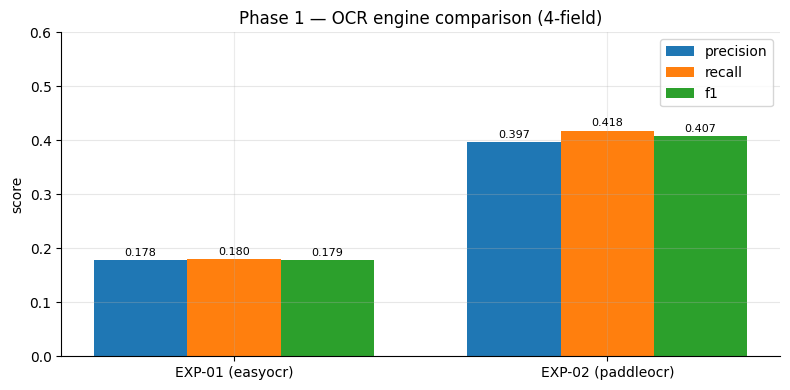

In [44]:
phase1_df = all_df[(all_df["experiment_id"].isin(PHASE1_IDS)) & (all_df["status"] == "ok")] \
                  .sort_values("experiment_id").reset_index(drop=True)
phase1_df.to_csv(SUMMARY_DIR / "phase1_summary.csv", index=False)

display(Markdown("### Phase 1 — OCR engine comparison"))
display(phase1_df)

# Determine winner
if not phase1_df.empty and not phase1_df["full_tuple_f1"].isna().all():
    win_idx = phase1_df["full_tuple_f1"].idxmax()
    win_row = phase1_df.loc[win_idx]
    other_f1 = phase1_df["full_tuple_f1"].min()
    winner = {
        "winner":   win_row["experiment_id"],
        "ocr_engine": win_row["ocr_engine"] or win_row["experiment_name"],
        "value":    float(win_row["full_tuple_f1"]),
        "delta":    float(win_row["full_tuple_f1"] - other_f1),
    }
    with open(SUMMARY_DIR / "phase1_winner.json", "w", encoding="utf-8") as f:
        json.dump(winner, f, indent=2)
    display(Markdown(
        f"**Winner: `{winner['ocr_engine']}`** ({winner['winner']}) — "
        f"F1 = {winner['value']:.4f}, Δ +{winner['delta']:.4f} over the other engine."
    ))

# Inline bar chart
if not phase1_df.empty:
    fig, ax = plt.subplots(figsize=(8, 4))
    metrics = ["full_tuple_precision", "full_tuple_recall", "full_tuple_f1"]
    labels = phase1_df["experiment_id"] + " (" + phase1_df["ocr_engine"].fillna(phase1_df["experiment_name"]) + ")"
    xs = np.arange(len(labels))
    width = 0.25
    for i, m in enumerate(metrics):
        bars = ax.bar(xs + i*width - width, phase1_df[m], width,
                      label=m.replace("full_tuple_", ""))
        for b in bars:
            ax.annotate(f"{b.get_height():.3f}",
                        xy=(b.get_x() + b.get_width()/2, b.get_height()),
                        xytext=(0, 3), textcoords="offset points",
                        ha="center", fontsize=8)
    ax.set_xticks(xs); ax.set_xticklabels(labels)
    ax.set_ylabel("score")
    ax.set_ylim(0, max(0.6, phase1_df[metrics].max().max() * 1.2))
    ax.set_title("Phase 1 — OCR engine comparison (4-field)")
    ax.legend(loc="upper right"); ax.grid(axis="y", alpha=0.3)
    fig.tight_layout()
    fig.savefig(SUMMARY_DIR / "plots" / "phase1_comparison.png", dpi=120)
    plt.show()

### Phase 2 — Classifier × Association factorial

,experiment_id,classifier_key,classifier_name,association_key,association_name,full_tuple_precision,full_tuple_recall,full_tuple_f1
0,EXP-03,A,rule-based,G1,graph_v1,0.2381,0.2483,0.2431
1,EXP-04,A,rule-based,G2,graph_v2,0.3969,0.4180,0.4072
2,EXP-05,A,rule-based,VLM,vlm,0.5607,0.4319,0.4879
3,EXP-06,B,embedding (BGE-M3),G1,graph_v1,0.2223,0.2436,0.2325
4,EXP-07,B,embedding (BGE-M3),G2,graph_v2,0.3673,0.4076,0.3864
5,EXP-08,B,embedding (BGE-M3),VLM,vlm,0.5820,0.4099,0.4810
6,EXP-09,C,GLiNER,G1,graph_v1,0.0000,0.0000,0.0000


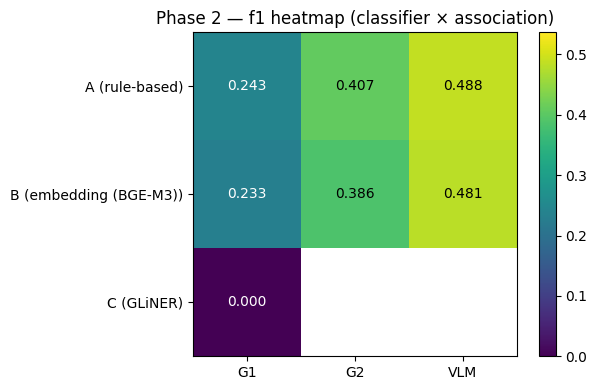

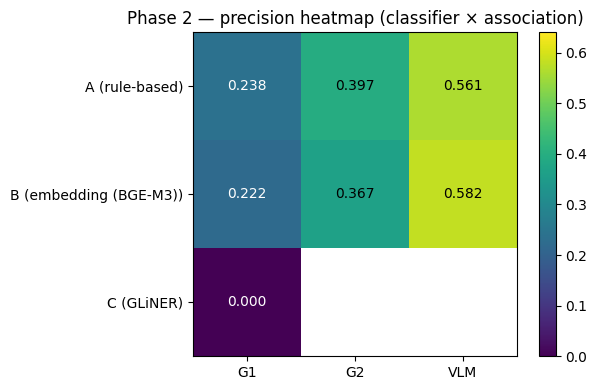

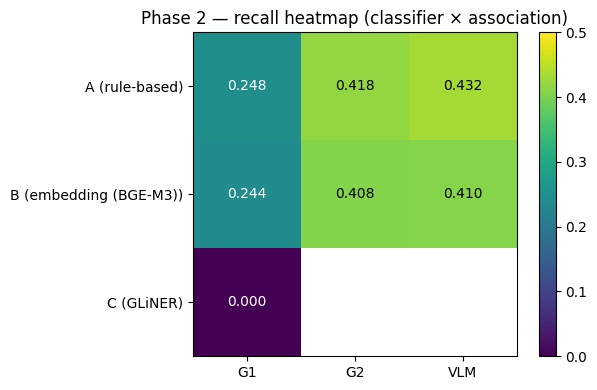

In [17]:
phase2_df = all_df[(all_df["experiment_id"].isin(PHASE2_IDS)) & (all_df["status"] == "ok")].copy()
for col in ("classifier_key", "association_key"):
    for i, r in phase2_df.iterrows():
        if not r.get(col):
            phase2_df.at[i, col] = PHASE2_SPEC.get(r["experiment_id"], {}).get(col, "")
phase2_df["classifier_name"]  = phase2_df["classifier_key"].map(CLASSIFIER_NAME)
phase2_df["association_name"] = phase2_df["association_key"].map(ASSOCIATION_NAME)
phase2_df = phase2_df.sort_values("experiment_id").reset_index(drop=True)
phase2_df.to_csv(SUMMARY_DIR / "phase2_summary.csv", index=False)

display(Markdown("### Phase 2 — Classifier × Association factorial"))
display(phase2_df[["experiment_id", "classifier_key", "classifier_name",
                   "association_key", "association_name",
                   "full_tuple_precision", "full_tuple_recall", "full_tuple_f1"]])

# Three heatmaps inline (precision, recall, f1)
if not phase2_df.empty:
    metric_cols = {"f1": "full_tuple_f1",
                   "precision": "full_tuple_precision",
                   "recall": "full_tuple_recall"}
    for m, col in metric_cols.items():
        try:
            pivot = phase2_df.pivot(index="classifier_key",
                                    columns="association_key", values=col)
        except Exception:
            continue
        if pivot.empty:
            continue
        pivot = pivot.reindex(index=["A", "B", "C"], columns=["G1", "G2", "VLM"])
        fig, ax = plt.subplots(figsize=(6, 4))
        finite_vals = pivot.values[np.isfinite(pivot.values)]
        vmax = max(0.5, float(finite_vals.max()) * 1.1) if finite_vals.size else 1.0
        im = ax.imshow(pivot.values, cmap="viridis", vmin=0, vmax=vmax)
        ax.set_xticks(range(len(pivot.columns)))
        ax.set_xticklabels(pivot.columns)
        ax.set_yticks(range(len(pivot.index)))
        ax.set_yticklabels([f"{k} ({CLASSIFIER_NAME.get(k, '?')})" for k in pivot.index])
        for i in range(pivot.shape[0]):
            for j in range(pivot.shape[1]):
                v = pivot.values[i, j]
                if np.isfinite(v):
                    ax.text(j, i, f"{v:.3f}", ha="center", va="center",
                            color="white" if v < vmax * 0.5 else "black", fontsize=10)
        fig.colorbar(im, ax=ax)
        ax.set_title(f"Phase 2 — {m} heatmap (classifier × association)")
        fig.tight_layout()
        fig.savefig(SUMMARY_DIR / "plots" / f"phase2_heatmap_{m}.png", dpi=120)
        plt.show()

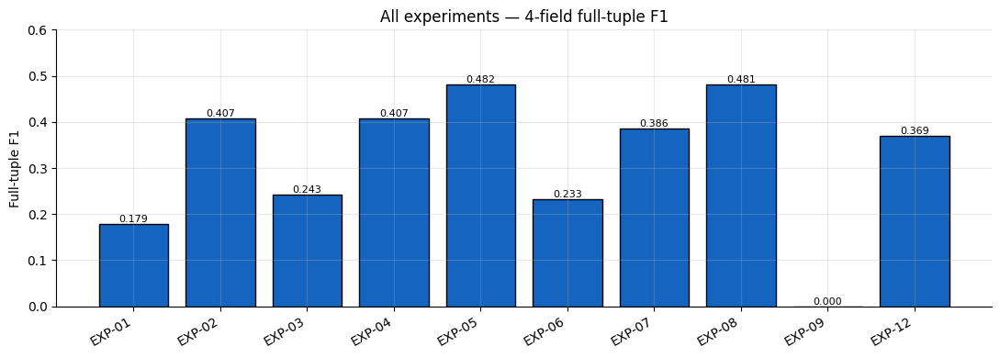

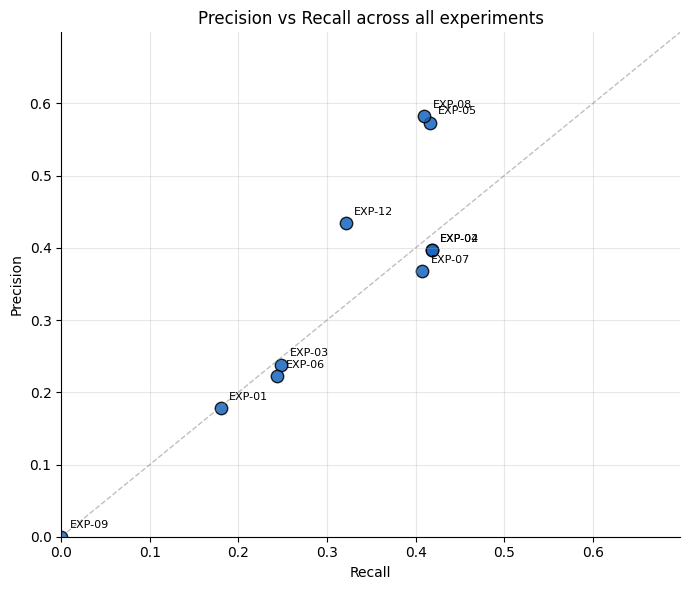

In [45]:
df_ok = all_df.dropna(subset=["full_tuple_f1"])

# Bar — all experiments F1
if not df_ok.empty:
    fig, ax = plt.subplots(figsize=(11, 4))
    bars = ax.bar(df_ok["experiment_id"], df_ok["full_tuple_f1"],
                  color="#1565C0", edgecolor="black")
    ax.set_ylabel("Full-tuple F1")
    ax.set_ylim(0, max(0.6, df_ok["full_tuple_f1"].max() * 1.2))
    ax.set_title("All experiments — 4-field full-tuple F1")
    for b, v in zip(bars, df_ok["full_tuple_f1"]):
        ax.text(b.get_x() + b.get_width()/2, v, f"{v:.3f}",
                ha="center", va="bottom", fontsize=8)
    plt.xticks(rotation=30, ha="right")
    ax.grid(axis="y", alpha=0.3)
    fig.tight_layout()
    fig.savefig(SUMMARY_DIR / "plots" / "all_experiments_f1.png", dpi=120)
    plt.show()

# Scatter — precision vs recall
df_pr = all_df.dropna(subset=["full_tuple_precision", "full_tuple_recall"])
if not df_pr.empty:
    fig, ax = plt.subplots(figsize=(7, 6))
    ax.scatter(df_pr["full_tuple_recall"], df_pr["full_tuple_precision"],
               s=80, c="#1565C0", edgecolors="black", alpha=0.85)
    for _, r in df_pr.iterrows():
        ax.annotate(r["experiment_id"],
                    (r["full_tuple_recall"], r["full_tuple_precision"]),
                    xytext=(6, 6), textcoords="offset points", fontsize=8)
    mx = max(0.5, df_pr[["full_tuple_precision", "full_tuple_recall"]].max().max() * 1.2)
    ax.plot([0, mx], [0, mx], "--", color="gray", alpha=0.5, linewidth=1)
    ax.set_xlim(0, mx); ax.set_ylim(0, mx)
    ax.set_xlabel("Recall"); ax.set_ylabel("Precision")
    ax.set_title("Precision vs Recall across all experiments")
    ax.grid(alpha=0.3)
    fig.tight_layout()
    fig.savefig(SUMMARY_DIR / "plots" / "precision_recall_scatter.png", dpi=120)
    plt.show()

### Processing time across experiments

,experiment_id,status,n_images,n_errors,total_s,total_min,mean_s,median_s,min_s,max_s
0,EXP-01,ok,57,0,417.54,6.96,7.325,7.800,2.081,15.695
1,EXP-02,ok,57,0,214.62,3.58,3.765,3.154,1.478,21.789
2,EXP-03,ok,57,0,207.58,3.46,3.642,3.269,1.603,8.511
3,EXP-04,ok,57,0,225.07,3.75,3.949,3.477,1.612,9.160
4,EXP-05,ok,57,0,767.44,12.79,13.464,12.167,5.028,33.076
5,EXP-06,ok,57,0,299.22,4.99,5.249,4.274,1.836,25.514
6,EXP-07,ok,57,0,299.98,5.00,5.263,4.833,2.562,11.370
7,EXP-08,ok,57,0,782.24,13.04,13.723,12.632,5.861,31.641
8,EXP-09,ok,57,6,229.53,3.83,4.027,3.775,1.194,9.483
9,EXP-10,ok,2,1,4.40,0.07,2.200,2.200,0.598,3.803


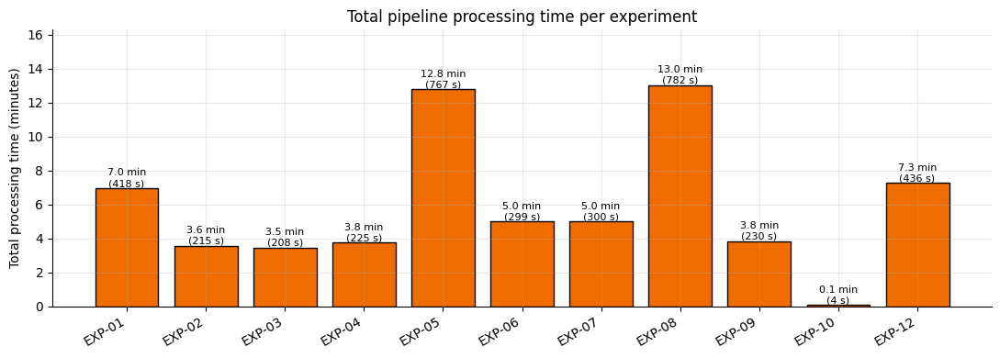

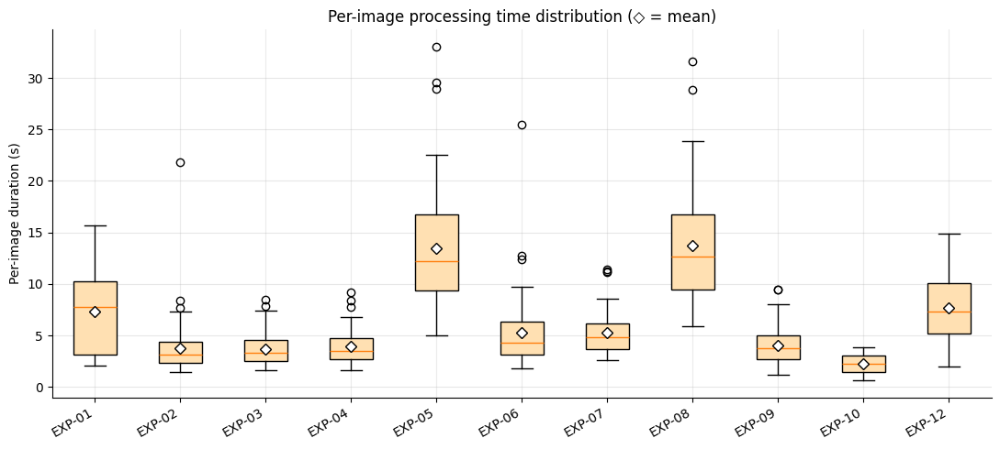

- **Fastest experiment:** `EXP-10` (0.1 min, mean 2.20s/image)
- **Slowest experiment:** `EXP-08` (13.0 min, mean 13.72s/image)
- **Total time across all completed experiments:** 64.7 min (3883 s)
- **Speedup ratio (slowest / fastest):** 177.78x

In [46]:
"""Cell 7 — Processing time comparison across experiments.
Reads per-image durations from:
  1. processing_times.csv          (preferred — written by run_vlm_experiment.py)
  2. intermediate/*_pipeline.json  (fallback — written by the notebook pipeline)
"""

def _read_processing_times_csv(exp_dir: Path) -> pd.DataFrame:
    p = exp_dir / "processing_times.csv"
    if not p.exists():
        return pd.DataFrame()
    try:
        df = pd.read_csv(p)
    except Exception:
        return pd.DataFrame()
    img_col = _first_col(df, ["image_id", "image", "filename"])
    time_col = _first_col(df, ["total_processing_time_s", "duration_s",
                               "processing_time_s", "time_s"])
    if not (img_col and time_col):
        return pd.DataFrame()
    out = pd.DataFrame({
        "image_id":   df[img_col].astype(str),
        "duration_s": pd.to_numeric(df[time_col], errors="coerce").fillna(0.0),
    })
    err_col = _first_col(df, ["error"])
    out["error"] = df[err_col].astype(str) if err_col else ""
    return out


def _read_intermediate_durations(exp_dir: Path) -> pd.DataFrame:
    inter_dir = exp_dir / "intermediate"
    if not inter_dir.exists():
        return pd.DataFrame()
    rows = []
    for jf in inter_dir.glob("*_pipeline.json"):
        try:
            with open(jf, encoding="utf-8") as f:
                data = json.load(f)
        except Exception:
            continue
        image_id = jf.stem.replace("_pipeline", "")
        rows.append({
            "image_id":   image_id,
            "duration_s": float(data.get("duration_s") or 0.0),
            "error":      data.get("error") or "",
        })
    return pd.DataFrame(rows)


def load_timing_data(exp_id: str) -> pd.DataFrame:
    """Per-image durations for one experiment. Prefers processing_times.csv,
    falls back to intermediate/*_pipeline.json."""
    exp_dir = _find_exp_dir(exp_id)
    if exp_dir is None:
        return pd.DataFrame()
    df = _read_processing_times_csv(exp_dir)
    if df.empty:
        df = _read_intermediate_durations(exp_dir)
    return df


# ── Aggregate timing across all experiments ───────────────────────────────
timing_rows: List[Dict[str, Any]] = []
per_image_times: Dict[str, pd.Series] = {}

for exp_id in ALL_IDS:
    td = load_timing_data(exp_id)
    if td.empty:
        timing_rows.append({"experiment_id": exp_id, "status": "no_data",
                            "n_images": 0, "total_s": np.nan, "mean_s": np.nan,
                            "median_s": np.nan, "min_s": np.nan, "max_s": np.nan,
                            "n_errors": 0})
        continue
    valid = td[td["duration_s"] > 0]
    errored = td[(td["error"].astype(str).str.strip() != "") & (td["error"].astype(str) != "None")]
    per_image_times[exp_id] = valid["duration_s"].reset_index(drop=True)
    timing_rows.append({
        "experiment_id": exp_id,
        "status":        "ok",
        "n_images":      int(len(valid)),
        "total_s":       round(float(valid["duration_s"].sum()),    2),
        "mean_s":        round(float(valid["duration_s"].mean()),   3),
        "median_s":      round(float(valid["duration_s"].median()), 3),
        "min_s":         round(float(valid["duration_s"].min()),    3),
        "max_s":         round(float(valid["duration_s"].max()),    3),
        "n_errors":      int(len(errored)),
    })

timing_df = pd.DataFrame(timing_rows)
timing_df["total_min"] = (timing_df["total_s"] / 60.0).round(2)
timing_df.to_csv(SUMMARY_DIR / "processing_times_summary.csv", index=False)

display(Markdown("### Processing time across experiments"))
display(timing_df[["experiment_id", "status", "n_images", "n_errors",
                   "total_s", "total_min", "mean_s", "median_s", "min_s", "max_s"]])

# ── Bar chart — total processing time per experiment ─────────────────────
df_ok = timing_df.dropna(subset=["total_s"])
df_ok = df_ok[df_ok["status"] == "ok"]
if not df_ok.empty:
    fig, ax = plt.subplots(figsize=(11, 4))
    bars = ax.bar(df_ok["experiment_id"], df_ok["total_min"],
                  color="#EF6C00", edgecolor="black")
    ax.set_ylabel("Total processing time (minutes)")
    ax.set_title("Total pipeline processing time per experiment")
    for b, v_s, v_m in zip(bars, df_ok["total_s"], df_ok["total_min"]):
        ax.text(b.get_x() + b.get_width()/2, v_m,
                f"{v_m:.1f} min\n({v_s:.0f} s)",
                ha="center", va="bottom", fontsize=8)
    plt.xticks(rotation=30, ha="right")
    ax.grid(axis="y", alpha=0.3)
    ax.set_ylim(0, df_ok["total_min"].max() * 1.25)
    fig.tight_layout()
    fig.savefig(SUMMARY_DIR / "plots" / "processing_time_totals.png", dpi=120)
    plt.show()

# ── Box plot — per-image distribution per experiment ─────────────────────
if per_image_times:
    fig, ax = plt.subplots(figsize=(11, 5))
    labels = [exp_id for exp_id in ALL_IDS if exp_id in per_image_times]
    data   = [per_image_times[k].values for k in labels]
    bp = ax.boxplot(data, tick_labels=labels, showmeans=True,
                    meanprops={"marker": "D", "markerfacecolor": "white",
                               "markeredgecolor": "black", "markersize": 6},
                    patch_artist=True)
    for patch in bp["boxes"]:
        patch.set_facecolor("#FFE0B2")
        patch.set_edgecolor("black")
    ax.set_ylabel("Per-image duration (s)")
    ax.set_title("Per-image processing time distribution (◇ = mean)")
    plt.xticks(rotation=30, ha="right")
    ax.grid(axis="y", alpha=0.3)
    fig.tight_layout()
    fig.savefig(SUMMARY_DIR / "plots" / "processing_time_distributions.png", dpi=120)
    plt.show()

# ── Headline summary ──────────────────────────────────────────────────────
df_ok_sorted = df_ok.sort_values("total_s")
if not df_ok_sorted.empty:
    fastest = df_ok_sorted.iloc[0]
    slowest = df_ok_sorted.iloc[-1]
    total_all = df_ok["total_s"].sum()
    display(Markdown(
        f"- **Fastest experiment:** `{fastest['experiment_id']}` "
        f"({fastest['total_min']:.1f} min, mean {fastest['mean_s']:.2f}s/image)\n"
        f"- **Slowest experiment:** `{slowest['experiment_id']}` "
        f"({slowest['total_min']:.1f} min, mean {slowest['mean_s']:.2f}s/image)\n"
        f"- **Total time across all completed experiments:** "
        f"{total_all/60:.1f} min ({total_all:.0f} s)\n"
        f"- **Speedup ratio (slowest / fastest):** "
        f"{slowest['total_s'] / max(fastest['total_s'], 0.001):.2f}x"
    ))

In [20]:
primary = "full_tuple_f1"
lines: List[str] = ["# Final descriptive comparison\n"]

# 1. OCR engine
lines.append("## 1. OCR engine\n")
if not phase1_df.empty:
    for _, r in phase1_df.iterrows():
        lines.append(
            f"- `{r['experiment_id']}` ({r['ocr_engine'] or r['experiment_name']}): "
            f"F1 = {r['full_tuple_f1']:.4f}"
        )
    if not phase1_df["full_tuple_f1"].isna().all():
        win = phase1_df.loc[phase1_df["full_tuple_f1"].idxmax()]
        delta = win['full_tuple_f1'] - phase1_df['full_tuple_f1'].min()
        lines.append(
            f"\n**Winner: `{win['ocr_engine'] or win['experiment_name']}`** "
            f"({win['experiment_id']}) — F1 = {win['full_tuple_f1']:.4f}, "
            f"Δ +{delta:.4f} over the other engine.\n"
        )
else:
    lines.append("- Phase 1 produced no usable metrics.\n")

# 2-3. Classifier and association rankings
if not phase2_df.empty:
    clf_mean = phase2_df.groupby("classifier_key")[primary].mean().sort_values(ascending=False)
    lines.append("## 2. Classifier ranking (mean F1 across association methods)\n")
    for k, v in clf_mean.items():
        lines.append(f"- `{k}` ({CLASSIFIER_NAME.get(k, '?')}): mean F1 = {v:.4f}")
    lines.append("")

    assoc_mean = phase2_df.groupby("association_key")[primary].mean().sort_values(ascending=False)
    lines.append("## 3. Association method ranking (mean F1 across classifiers)\n")
    for k, v in assoc_mean.items():
        lines.append(f"- `{k}` ({ASSOCIATION_NAME.get(k, '?')}): mean F1 = {v:.4f}")
    lines.append("")

    # 4. Graph v2 vs Graph v1
    lines.append("## 4. Graph v2 vs Graph v1 (head-to-head, per classifier)\n")
    v1 = phase2_df[phase2_df["association_key"] == "G1"].set_index("classifier_key")[primary]
    v2 = phase2_df[phase2_df["association_key"] == "G2"].set_index("classifier_key")[primary]
    paired = v1.index.intersection(v2.index)
    if len(paired) == 0:
        lines.append("- (insufficient paired data)")
    for c in paired:
        d = v2[c] - v1[c]
        verb = "improved" if d > 0 else "regressed"
        lines.append(f"- `{c}` ({CLASSIFIER_NAME.get(c, '?')}): "
                     f"G1 {v1[c]:.4f} → G2 {v2[c]:.4f} ({verb} by {d:+.4f})")
    lines.append("")

    # 5. VLM vs Graph v2
    lines.append("## 5. VLM vs Graph v2 (head-to-head, per classifier)\n")
    vlm = phase2_df[phase2_df["association_key"] == "VLM"].set_index("classifier_key")[primary]
    paired = v2.index.intersection(vlm.index)
    if len(paired) == 0:
        lines.append("- VLM experiments not yet evaluated.")
    for c in paired:
        d = vlm[c] - v2[c]
        verb = "improved" if d > 0 else "regressed"
        lines.append(f"- `{c}` ({CLASSIFIER_NAME.get(c, '?')}): "
                     f"G2 {v2[c]:.4f} → VLM {vlm[c]:.4f} ({verb} by {d:+.4f})")
    lines.append("")
else:
    lines.append("## 2–5. Phase 2 results\n\n- No Phase 2 results found yet.\n")

# 6. Best by metric
lines.append("## 6. Best experiment by metric\n")
for metric, label in [("full_tuple_f1", "F1"),
                      ("full_tuple_precision", "precision"),
                      ("full_tuple_recall", "recall")]:
    sub = all_df.dropna(subset=[metric])
    if sub.empty:
        continue
    best = sub.loc[sub[metric].idxmax()]
    lines.append(f"- Highest {label}: `{best['experiment_id']}` "
                 f"({best['ocr_engine'] or '?'} + "
                 f"{best.get('classifier_key', '?')}{best.get('association_key', '?')}) "
                 f"= {best[metric]:.4f}")
lines.append("")

# 7. Stability
if "std_image_f1" in all_df.columns:
    stab = all_df.dropna(subset=["std_image_f1"]).sort_values("std_image_f1")
    if not stab.empty:
        lines.append("## 7. Stability across images (lower std = more stable)\n")
        lines.append(f"- Most stable:   `{stab.iloc[0]['experiment_id']}` "
                     f"(std F1 = {stab.iloc[0]['std_image_f1']:.4f})")
        lines.append(f"- Most volatile: `{stab.iloc[-1]['experiment_id']}` "
                     f"(std F1 = {stab.iloc[-1]['std_image_f1']:.4f})\n")

# 8. Final recommendation
lines.append("## 8. Final pipeline recommendation\n")
df_ok = all_df.dropna(subset=["full_tuple_f1"])
if not df_ok.empty:
    best = df_ok.loc[df_ok["full_tuple_f1"].idxmax()]
    lines.append(
        f"- **Recommended thesis pipeline: `{best['experiment_id']}`** — "
        f"OCR = {best['ocr_engine'] or '?'}, "
        f"classifier = {best.get('classifier_key', '?')} "
        f"({CLASSIFIER_NAME.get(best.get('classifier_key', ''), '?')}), "
        f"association = {best.get('association_key', '?')} "
        f"({ASSOCIATION_NAME.get(best.get('association_key', ''), '?')}). "
        f"4-field F1 = {best['full_tuple_f1']:.4f}."
    )

final_report = "\n".join(lines)
with open(SUMMARY_DIR / "final_descriptive_comparison.md", "w", encoding="utf-8") as f:
    f.write(final_report)

display(Markdown(final_report))

# Final descriptive comparison

## 1. OCR engine

- `EXP-01` (easyocr): F1 = 0.1789
- `EXP-02` (paddleocr): F1 = 0.4072

**Winner: `paddleocr`** (EXP-02) — F1 = 0.4072, Δ +0.2283 over the other engine.

## 2. Classifier ranking (mean F1 across association methods)

- `A` (rule-based): mean F1 = 0.3794
- `B` (embedding (BGE-M3)): mean F1 = 0.3666
- `C` (GLiNER): mean F1 = 0.0000

## 3. Association method ranking (mean F1 across classifiers)

- `VLM` (vlm): mean F1 = 0.4844
- `G2` (graph_v2): mean F1 = 0.3968
- `G1` (graph_v1): mean F1 = 0.1585

## 4. Graph v2 vs Graph v1 (head-to-head, per classifier)

- `A` (rule-based): G1 0.2431 → G2 0.4072 (improved by +0.1641)
- `B` (embedding (BGE-M3)): G1 0.2325 → G2 0.3864 (improved by +0.1539)

## 5. VLM vs Graph v2 (head-to-head, per classifier)

- `A` (rule-based): G2 0.4072 → VLM 0.4879 (improved by +0.0807)
- `B` (embedding (BGE-M3)): G2 0.3864 → VLM 0.4810 (improved by +0.0946)

## 6. Best experiment by metric

- Highest F1: `EXP-05` (paddleocr + AVLM) = 0.4879
- Highest precision: `EXP-08` (paddleocr + BVLM) = 0.5820
- Highest recall: `EXP-05` (paddleocr + AVLM) = 0.4319

## 7. Stability across images (lower std = more stable)

- Most stable:   `EXP-09` (std F1 = 0.0000)
- Most volatile: `EXP-07` (std F1 = 0.3507)

## 8. Final pipeline recommendation

- **Recommended thesis pipeline: `EXP-05`** — OCR = paddleocr, classifier = A (rule-based), association = VLM (vlm). 4-field F1 = 0.4879.